In [80]:
# Dependencies
import tensorflow

#from tensorflow.math import reduce_prod
#from tensorflow.python.ops.math_ops import reduce_prod

import numpy as np

from sklearn.linear_model import LinearRegression 
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor 
from sklearn.neighbors import KNeighborsRegressor 
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor 
from sklearn.ensemble import GradientBoostingRegressor 
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.neural_network import MLPRegressor

from sklearn.model_selection import train_test_split 
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score 
from sklearn.model_selection import GridSearchCV 
from sklearn.metrics import mean_squared_error
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_regression

from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Dense 
from tensorflow.keras.optimizers import SGD 
from tensorflow.keras.layers import LSTM
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor

In [81]:
from statsmodels.tsa.arima_model import ARIMA 
import statsmodels.api as sm

In [82]:
# pandas, pandas_datareader, numpy and matplotlib
import numpy as np
import pandas as pd
#import pandas_datareader.data as web 
from matplotlib import pyplot

In [83]:
from pandas.plotting import scatter_matrix
import seaborn as sns
from sklearn.preprocessing import StandardScaler 
from pandas.plotting import scatter_matrix
from statsmodels.graphics.tsaplots import plot_acf

In [84]:
# stk_tickers = ['MSFT', 'IBM', 'GOOGL']
stk_tickers = ['ABBV', 'AMGN', 'AZN', 'BIIB', 'BMY', 'CRXT', 'GILD', 'GRFS','GSK', 'HCM', 'HZNP', 'JNJ', 'LLY', 'MRK','NVO','NVS', 'OGN','PFE','SNY','TSVT']
ccy_tickers = ['DEXJPUS', 'DEXUSUK']
idx_tickers = ['SP500', 'DJIA', 'VIXCLS']

In [85]:
!pip install pandas-datareader

In [86]:
import pandas_datareader.data as web

In [7]:
stk_data = web.DataReader(stk_tickers, 'yahoo')
ccy_data = web.DataReader(ccy_tickers, 'fred')
idx_data = web.DataReader(idx_tickers, 'fred')

In [8]:
return_period = 5 #Rendimiento Semanal

In [9]:
stk_data

Attributes   Adj Close                                                      \
Symbols           ABBV        AMGN        AZN        BIIB        BMY  CRXT   
Date                                                                         
2016-11-22   46.831333  124.940811  22.173504  318.109985  48.735176   NaN   
2016-11-23   47.824711  125.546761  22.123167  305.929993  48.907539   NaN   
2016-11-25   48.086956  125.893044  22.735601  305.200012  49.105755   NaN   
2016-11-28   47.252529  125.581383  22.425190  303.779999  48.700706   NaN   
2016-11-29   48.945229  126.386436  22.408409  302.769989  48.571434   NaN   
...                ...         ...        ...         ...        ...   ...   
2021-11-15  116.839996  207.399994  59.779999  271.820007  59.619999  4.46   
2021-11-16  116.419998  205.389999  57.630001  261.549988  59.099998  4.84   
2021-11-17  117.349998  205.820007  57.730000  258.380005  59.439999  4.94   
2021-11-18  117.070000  204.020004  56.709999  256.790009  59.040001  4.67   
2021-11-19  116.239998  206.080002  56.660000  257.190002  57.830002  4.39   

Attributes                                              ...     Volume  \
Symbols          GILD       GRFS        GSK        HCM  ...       HZNP   
Date                                                    ...              
2016-11-22  62.466217  13.835172  29.272081  12.550000  ...  1757100.0   
2016-11-23  63.170910  13.835172  29.318254  12.570000  ...  1719500.0   
2016-11-25  63.288376  13.906857  29.903067  12.570000  ...   630600.0   
2016-11-28  62.533333  14.014386  29.464453  13.000000  ...  2260700.0   
2016-11-29  62.810184  14.103990  29.449062  13.000000  ...  2596600.0   
...               ...        ...        ...        ...  ...        ...   
2021-11-15  67.199997  11.830000  42.639378  31.129999  ...  1566400.0   
2021-11-16  66.889999  12.110000  41.928230  31.590000  ...  1638700.0   
2021-11-17  67.459999  12.550000  42.027000  31.190001  ...  1080500.0   
2021-11-18  67.790001  12.060000  41.500000  30.110001  ...   949300.0   
2021-11-19  68.690002  11.880000  41.590000  30.719999  ...  1496300.0   

Attributes                                                            \
Symbols            JNJ         LLY         MRK        NVO        NVS   
Date                                                                   
2016-11-22  11649700.0   5208800.0  10052626.0  5457300.0  6064456.0   
2016-11-23   7892600.0  53877200.0   9588152.0  7698800.0  5416060.0   
2016-11-25   3433300.0   8620700.0   3669362.0  1964100.0  1975878.0   
2016-11-28   9065700.0  12507700.0   7806971.0  3515000.0  2530195.0   
2016-11-29   7799600.0   8930000.0  10516575.0  4347700.0  2042280.0   
...                ...         ...         ...        ...        ...   
2021-11-15   7496200.0   1903200.0   7108200.0   559000.0  2034200.0   
2021-11-16   7594700.0   2565700.0  10565200.0   571800.0  1896400.0   
2021-11-17   5414500.0   2873600.0  10286300.0   559100.0  1846300.0   
2021-11-18   6358700.0   1689200.0   9833600.0   886600.0  1590700.0   
2021-11-19   7620700.0   2786800.0  17581100.0   724900.0  2160100.0   

Attributes                                              
Symbols           OGN         PFE        SNY      TSVT  
Date                                                    
2016-11-22        NaN  27862279.0  2904600.0       NaN  
2016-11-23        NaN  22399924.0  2412100.0       NaN  
2016-11-25        NaN  11017357.0   710700.0       NaN  
2016-11-28        NaN  18692901.0  1184400.0       NaN  
2016-11-29        NaN  22810879.0  2224800.0       NaN  
...               ...         ...        ...       ...  
2021-11-15  2553500.0  27763200.0  1256500.0  429800.0  
2021-11-16  2385400.0  31297200.0   788400.0  434000.0  
2021-11-17  2008700.0  36889800.0  1017800.0  360800.0  
2021-11-18  2625800.0  32872600.0  1945200.0  547700.0  
2021-11-19  2631300.0  47936400.0  2197500.0  345500.0  

[1258 rows x 120 columns]

<AxesSubplot:xlabel='Date'>

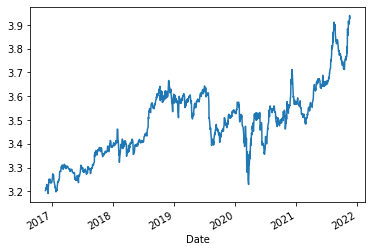

In [10]:
np.log(stk_data.loc[:, ('Adj Close', 'PFE')]).plot()

<AxesSubplot:xlabel='Date'>

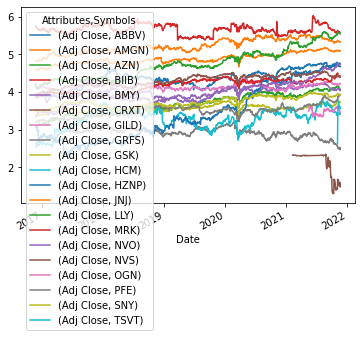

In [11]:
np.log(stk_data.loc[:, ('Adj Close', stk_tickers)]).plot()

In [12]:
#%matplotlib 

<ipython-input-13-415a31f2efe4>:17: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.tight_layout(pad=5)


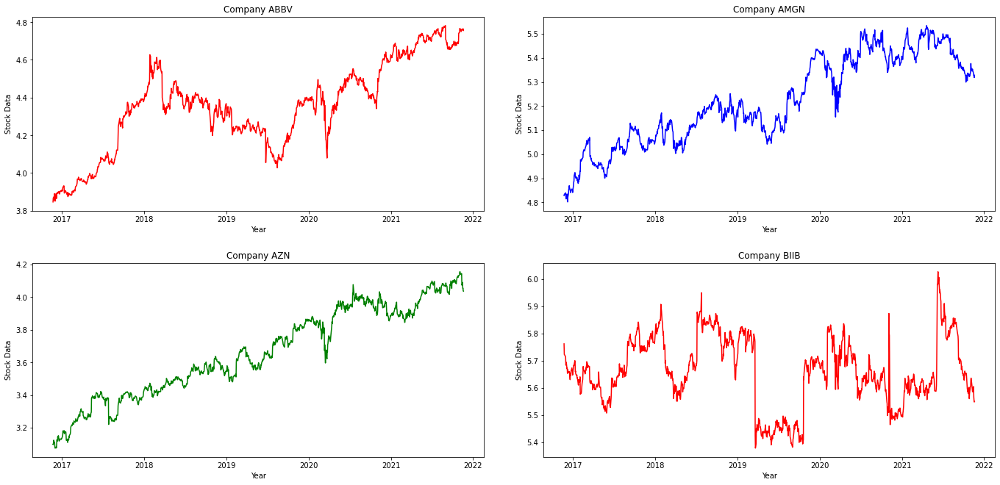

In [13]:
import matplotlib.pyplot as plt
# Tickers change
def test(to_plot,ax, r_count, c_count, c,s):
    #fig,ax = plt.subplots(1,2)
    #plt.subplot(1,2,2)
    #plt.plot(month, customer1, color="red", label="Customer 1", marker="o")
    ax[r_count,c_count].plot(p.index, p.values, color=c)
    ax[r_count,c_count].set_xlabel("Year")
    # ax[r_count,c_count].xticks(rotation=90)
    ax[r_count,c_count].set_ylabel("Stock Data")
    ax[r_count,c_count].set_title(f"Company {s}")
    #plt.show()

rows= 2
cols= 2    
fig,ax = plt.subplots(rows,cols, constrained_layout=True, figsize=(20,10))
fig.tight_layout(pad=5)
#fig.autofmt_xdate(rotation=90)
colors= ["red", "blue", "green"]
r_count=0
c_count=0

for i, s in enumerate(stk_tickers[:4]):
    p= np.log(stk_data.loc[:, ('Adj Close', s)])
    test(p, ax, r_count, c_count, colors[i%len(colors)], s)
    if c_count >= cols-1:
        c_count=0
        r_count+=1
    else:
        c_count+=1
#     print(i,s,p)
#     print(p.values)

#plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right')
plt.show()

<ipython-input-14-2c9713371a8b>:17: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.tight_layout(pad=5)


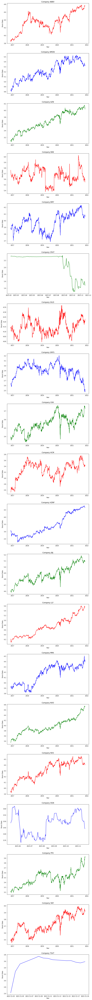

In [14]:
import matplotlib.pyplot as plt
# Tickers change
def test(to_plot,ax, i, c,s):
    #fig,ax = plt.subplots(1,2)
    #plt.subplot(1,2,2)
    #plt.plot(month, customer1, color="red", label="Customer 1", marker="o")
    ax[i].plot(p.index, p.values, color=c)
    ax[i].set_xlabel("Year")
    # ax[r_count,c_count].xticks(rotation=90)
    ax[i].set_ylabel("Stock Data")
    ax[i].set_title(f"Company {s}")
    #plt.show()

# rows= 2
# cols= 2    
fig,ax = plt.subplots(len(stk_tickers), 1, constrained_layout=True, figsize=(10,100))
fig.tight_layout(pad=5)
#fig.autofmt_xdate(rotation=90)
colors= ["red", "blue", "green"]
# r_count=0
# c_count=0

for i, s in enumerate(stk_tickers):
    p= np.log(stk_data.loc[:, ('Adj Close', s)])
    test(p, ax, i, colors[i%len(colors)], s)
#     if c_count >= cols-1:
#         c_count=0
#         r_count+=1
#     else:
#         c_count+=1
#     print(i,s,p)
#     print(p.values)

#plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right')
plt.show()

In [15]:
np.log(stk_data.loc[:, ('Adj Close', 'PFE')]).diff(5).shift(-5)
# Generate variable Y: is the weekly performance in t+1
#Shift -5: Gives the data plus 5 periods. The base for lower to higher times
# To make it supervised, shify -5 gives the data t+5 in t

Date
2016-11-22    0.025525
2016-11-23    0.001272
2016-11-25   -0.001895
2016-11-28    0.001584
2016-11-29   -0.011342
                ...   
2021-11-15         NaN
2021-11-16         NaN
2021-11-17         NaN
2021-11-18         NaN
2021-11-19         NaN
Name: (Adj Close, PFE), Length: 1258, dtype: float64

In [16]:
# This is for every ticker period

for i in stk_data:
     print(np.log(stk_data.loc[:, ('Adj Close', i)]).diff(5).shift(-5))

Attributes Adj Close
Symbols         ABBV
Date                
2016-11-22  0.031240
2016-11-23 -0.017095
2016-11-25 -0.018010
2016-11-28  0.023272
2016-11-29  0.000487
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols         AMGN
Date                
2016-11-22 -0.001803
2016-11-23 -0.018371
2016-11-25 -0.009812
2016-11-28  0.001515
2016-11-29 -0.006115
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols          AZN
Date                
2016-11-22 -0.011033
2016-11-23 -0.021465
2016-11-25 -0.045677
2016-11-28 -0.034637
2016-11-29 -0.026557
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols         BIIB
D

Attributes Adj Close
Symbols          SNY
Date                
2016-11-22  0.008494
2016-11-23  0.007074
2016-11-25  0.004508
2016-11-28  0.029268
2016-11-29  0.005425
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols         TSVT
Date                
2016-11-22       NaN
2016-11-23       NaN
2016-11-25       NaN
2016-11-28       NaN
2016-11-29       NaN
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols         ABBV
Date                
2016-11-22  0.031240
2016-11-23 -0.017095
2016-11-25 -0.018010
2016-11-28  0.023272
2016-11-29  0.000487
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols         AMGN
D

Attributes Adj Close
Symbols          PFE
Date                
2016-11-22  0.025525
2016-11-23  0.001272
2016-11-25 -0.001895
2016-11-28  0.001584
2016-11-29 -0.011342
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols          SNY
Date                
2016-11-22  0.008494
2016-11-23  0.007074
2016-11-25  0.004508
2016-11-28  0.029268
2016-11-29  0.005425
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols         TSVT
Date                
2016-11-22       NaN
2016-11-23       NaN
2016-11-25       NaN
2016-11-28       NaN
2016-11-29       NaN
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1258 rows x 1 columns]
Attributes Adj Close
Symbols         ABBV
D

Attributes Adj Close
Symbols         TSVT
Date                
2016-11-22       NaN
2016-11-23       NaN
2016-11-25       NaN
2016-11-28       NaN
2016-11-29       NaN
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1258 rows x 1 columns]


<AxesSubplot:xlabel='Date'>

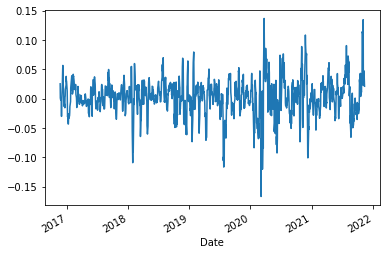

In [17]:
np.log(stk_data.loc[:, ('Adj Close', 'PFE')]).diff(5).shift(-5).plot()

<ipython-input-18-abf24140dc9a>:11: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.tight_layout(pad=5)


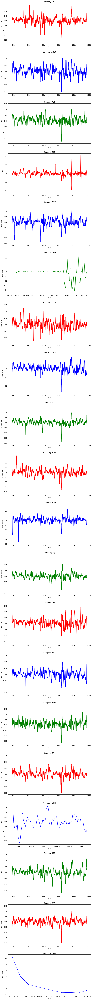

In [18]:
import matplotlib.pyplot as plt
# Tickers change
def test2(to_plot,ax, i, c,s):
    ax[i].plot(p.index, p.values, color=c)
    ax[i].set_xlabel("Year")
    ax[i].set_ylabel("Stock Data")
    ax[i].set_title(f"Company {s}")
    

fig,ax = plt.subplots(len(stk_tickers), 1, constrained_layout=True, figsize=(10,100))
fig.tight_layout(pad=5)
colors= ["red", "blue", "green"]

for i, s in enumerate(stk_tickers):
    p= np.log(stk_data.loc[:, ('Adj Close', s)]).diff(5).shift(-5)
    test2(p, ax, i, colors[i%len(colors)], s)
plt.show()

In [19]:
# All stocks stk_tickers
Y = np.log(stk_data.loc[:, ('Adj Close', stk_tickers)]).diff(return_period).shift(-return_period)

In [20]:
Y

Attributes Adj Close                                                         \
Symbols         ABBV      AMGN       AZN      BIIB       BMY CRXT      GILD   
Date                                                                          
2016-11-22  0.031240 -0.001803 -0.011033 -0.078579 -0.001947  NaN -0.010259   
2016-11-23 -0.017095 -0.018371 -0.021465 -0.033740 -0.016882  NaN -0.033215   
2016-11-25 -0.018010 -0.009812 -0.045677 -0.026596 -0.018063  NaN -0.040855   
2016-11-28  0.023272  0.001515 -0.034637 -0.045664 -0.017134  NaN -0.029682   
2016-11-29  0.000487 -0.006115 -0.026557 -0.039100 -0.005873  NaN -0.032580   
...              ...       ...       ...       ...       ...  ...       ...   
2021-11-15       NaN       NaN       NaN       NaN       NaN  NaN       NaN   
2021-11-16       NaN       NaN       NaN       NaN       NaN  NaN       NaN   
2021-11-17       NaN       NaN       NaN       NaN       NaN  NaN       NaN   
2021-11-18       NaN       NaN       NaN       NaN       NaN  NaN       NaN   
2021-11-19       NaN       NaN       NaN       NaN       NaN  NaN       NaN   

Attributes                                                              \
Symbols         GRFS       GSK       HCM      HZNP       JNJ       LLY   
Date                                                                     
2016-11-22  0.012231 -0.006594  0.097842 -0.068319 -0.012855 -0.124120   
2016-11-23 -0.001945 -0.017742  0.080226 -0.110494 -0.015059 -0.030307   
2016-11-25 -0.024129 -0.030305  0.133134 -0.076868 -0.019196 -0.020611   
2016-11-28 -0.045901 -0.016325  0.134396 -0.073963 -0.010575  0.000893   
2016-11-29 -0.059077 -0.015272  0.139093 -0.040723 -0.003741  0.009634   
...              ...       ...       ...       ...       ...       ...   
2021-11-15       NaN       NaN       NaN       NaN       NaN       NaN   
2021-11-16       NaN       NaN       NaN       NaN       NaN       NaN   
2021-11-17       NaN       NaN       NaN       NaN       NaN       NaN   
2021-11-18       NaN       NaN       NaN       NaN       NaN       NaN   
2021-11-19       NaN       NaN       NaN       NaN       NaN       NaN   

Attributes                                                             
Symbols          MRK       NVO       NVS OGN       PFE       SNY TSVT  
Date                                                                   
2016-11-22 -0.008300  0.055689  0.009792 NaN  0.025525  0.008494  NaN  
2016-11-23 -0.014379  0.060830 -0.015525 NaN  0.001272  0.007074  NaN  
2016-11-25 -0.017513  0.056067 -0.020473 NaN -0.001895  0.004508  NaN  
2016-11-28 -0.025401  0.056167 -0.001594 NaN  0.001584  0.029268  NaN  
2016-11-29 -0.031194  0.074762  0.000000 NaN -0.011342  0.005425  NaN  
...              ...       ...       ...  ..       ...       ...  ...  
2021-11-15       NaN       NaN       NaN NaN       NaN       NaN  NaN  
2021-11-16       NaN       NaN       NaN NaN       NaN       NaN  NaN  
2021-11-17       NaN       NaN       NaN NaN       NaN       NaN  NaN  
2021-11-18       NaN       NaN       NaN NaN       NaN       NaN  NaN  
2021-11-19       NaN       NaN       NaN NaN       NaN       NaN  NaN  

[1258 rows x 20 columns]

In [21]:
# Y.columns = Y.columns[-1]+'_pred'
#X = X.set_axis(X_colnames, axis=1, inplace=False)
list_names=[]
for i in range(0,len(Y.columns)):
    list_names.append(stk_tickers[i]+'_pred')
list_names

['ABBV_pred',
 'AMGN_pred',
 'AZN_pred',
 'BIIB_pred',
 'BMY_pred',
 'CRXT_pred',
 'GILD_pred',
 'GRFS_pred',
 'GSK_pred',
 'HCM_pred',
 'HZNP_pred',
 'JNJ_pred',
 'LLY_pred',
 'MRK_pred',
 'NVO_pred',
 'NVS_pred',
 'OGN_pred',
 'PFE_pred',
 'SNY_pred',
 'TSVT_pred']

In [22]:
Y = Y.set_axis(list_names, axis=1, inplace=False)
Y

,ABBV_pred,AMGN_pred,AZN_pred,BIIB_pred,BMY_pred,CRXT_pred,GILD_pred,GRFS_pred,GSK_pred,HCM_pred,HZNP_pred,JNJ_pred,LLY_pred,MRK_pred,NVO_pred,NVS_pred,OGN_pred,PFE_pred,SNY_pred,TSVT_pred
Date,,,,,,,,,,,,,,,,,,,,
2016-11-22,0.031240,-0.001803,-0.011033,-0.078579,-0.001947,NaN,-0.010259,0.012231,-0.006594,0.097842,-0.068319,-0.012855,-0.124120,-0.008300,0.055689,0.009792,NaN,0.025525,0.008494,NaN
2016-11-23,-0.017095,-0.018371,-0.021465,-0.033740,-0.016882,NaN,-0.033215,-0.001945,-0.017742,0.080226,-0.110494,-0.015059,-0.030307,-0.014379,0.060830,-0.015525,NaN,0.001272,0.007074,NaN
2016-11-25,-0.018010,-0.009812,-0.045677,-0.026596,-0.018063,NaN,-0.040855,-0.024129,-0.030305,0.133134,-0.076868,-0.019196,-0.020611,-0.017513,0.056067,-0.020473,NaN,-0.001895,0.004508,NaN
2016-11-28,0.023272,0.001515,-0.034637,-0.045664,-0.017134,NaN,-0.029682,-0.045901,-0.016325,0.134396,-0.073963,-0.010575,0.000893,-0.025401,0.056167,-0.001594,NaN,0.001584,0.029268,NaN
2016-11-29,0.000487,-0.006115,-0.026557,-0.039100,-0.005873,NaN,-0.032580,-0.059077,-0.015272,0.139093,-0.040723,-0.003741,0.009634,-0.031194,0.074762,0.000000,NaN,-0.011342,0.005425,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
Y

,ABBV_pred,AMGN_pred,AZN_pred,BIIB_pred,BMY_pred,CRXT_pred,GILD_pred,GRFS_pred,GSK_pred,HCM_pred,HZNP_pred,JNJ_pred,LLY_pred,MRK_pred,NVO_pred,NVS_pred,OGN_pred,PFE_pred,SNY_pred,TSVT_pred
Date,,,,,,,,,,,,,,,,,,,,
2016-11-22,0.031240,-0.001803,-0.011033,-0.078579,-0.001947,NaN,-0.010259,0.012231,-0.006594,0.097842,-0.068319,-0.012855,-0.124120,-0.008300,0.055689,0.009792,NaN,0.025525,0.008494,NaN
2016-11-23,-0.017095,-0.018371,-0.021465,-0.033740,-0.016882,NaN,-0.033215,-0.001945,-0.017742,0.080226,-0.110494,-0.015059,-0.030307,-0.014379,0.060830,-0.015525,NaN,0.001272,0.007074,NaN
2016-11-25,-0.018010,-0.009812,-0.045677,-0.026596,-0.018063,NaN,-0.040855,-0.024129,-0.030305,0.133134,-0.076868,-0.019196,-0.020611,-0.017513,0.056067,-0.020473,NaN,-0.001895,0.004508,NaN
2016-11-28,0.023272,0.001515,-0.034637,-0.045664,-0.017134,NaN,-0.029682,-0.045901,-0.016325,0.134396,-0.073963,-0.010575,0.000893,-0.025401,0.056167,-0.001594,NaN,0.001584,0.029268,NaN
2016-11-29,0.000487,-0.006115,-0.026557,-0.039100,-0.005873,NaN,-0.032580,-0.059077,-0.015272,0.139093,-0.040723,-0.003741,0.009634,-0.031194,0.074762,0.000000,NaN,-0.011342,0.005425,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
X1 = np.log(stk_data.loc[:, ('Adj Close', stk_tickers)]).diff(return_period)
X1.columns = X1.columns.droplevel()

In [25]:
X1

Symbols,ABBV,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,HZNP,JNJ,LLY,MRK,NVO,NVS,OGN,PFE,SNY,TSVT
Date,,,,,,,,,,,,,,,,,,,,
2016-11-22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-15,0.006698,-0.010600,-0.052305,-0.003232,0.003529,-0.163079,0.018473,-0.055090,0.009309,0.035975,0.012127,0.003983,-0.004851,0.012142,-0.010605,-0.011360,-0.102691,0.026946,-0.000196,-0.071228
2021-11-16,0.006982,-0.021946,-0.084318,-0.031908,-0.006073,-0.065958,0.011125,-0.015568,-0.006574,0.042023,-0.000279,0.000984,-0.013305,0.016664,-0.001140,-0.014303,-0.088402,0.047481,-0.006851,-0.132726
2021-11-17,0.005126,-0.026915,-0.089578,-0.032555,0.000842,-0.008065,0.002077,0.020121,-0.014698,0.038234,-0.001017,-0.006045,-0.009957,-0.016926,0.014970,-0.015388,-0.105876,0.037045,-0.006449,-0.128452


In [26]:
X2 = np.log(ccy_data).diff(return_period)

In [27]:
X2

,DEXJPUS,DEXUSUK
DATE,,
2016-11-22,NaN,NaN
2016-11-23,NaN,NaN
2016-11-24,NaN,NaN
2016-11-25,NaN,NaN
2016-11-28,NaN,NaN
...,...,...
2021-11-08,-0.009149,-0.008516
2021-11-09,-0.008030,-0.004491
2021-11-10,-0.001492,-0.013934


In [28]:
X3 = np.log(idx_data).diff(return_period)

In [29]:
X3

,SP500,DJIA,VIXCLS
DATE,,,
2016-11-22,NaN,NaN,NaN
2016-11-23,NaN,NaN,NaN
2016-11-24,NaN,NaN,NaN
2016-11-25,NaN,NaN,NaN
2016-11-28,NaN,NaN,NaN
...,...,...,...
2021-11-15,-0.004028,-0.009508,-0.043317
2021-11-16,0.003335,-0.004906,-0.082624
2021-11-17,0.008990,-0.004135,-0.090463


In [30]:
# Generates lags by a week, 3 weeks, 6 weeks, and 12 weeks 
X4=[]
for i in stk_tickers:
    temp = pd.concat([np.log(stk_data.loc[:, ('Adj Close', i)]).diff(j)
               for j in [return_period, return_period*3,return_period*6, return_period*12]], axis=1).dropna()
    X4.append(temp)

In [31]:
# Rename columns
for i in range(0,len(X4)):
    X4[i].columns= X4[i].columns.droplevel()
    X4[i].index.name = None
    X4[i].columns = [f'{stk_tickers[i]}_DT', f'{stk_tickers[i]}_3DT', f'{stk_tickers[i]}_6DT', f'{stk_tickers[i]}_12DT']

In [32]:
X4[0].head()

,ABBV_DT,ABBV_3DT,ABBV_6DT,ABBV_12DT
2017-02-21,0.021580,0.022903,-0.021168,0.058078
2017-02-22,0.008839,0.004083,-0.035362,0.029457
2017-02-23,0.004693,0.017097,-0.023771,0.033397
2017-02-24,0.009873,0.019516,0.015419,0.053321
2017-02-27,0.007259,0.025227,0.015223,0.020216


In [33]:
temp2 = X4[0]
temp2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1198 entries, 2017-02-21 to 2021-11-19
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ABBV_DT    1198 non-null   float64
 1   ABBV_3DT   1198 non-null   float64
 2   ABBV_6DT   1198 non-null   float64
 3   ABBV_12DT  1198 non-null   float64
dtypes: float64(4)
memory usage: 46.8 KB


In [34]:
# TEST 2
temp3= pd.DataFrame()
temp2= pd.DataFrame()
for i in range(0,len(X4)):
    temp2= X4[i]
    temp3= pd.concat([temp3,temp2], axis=1)
#     temp2 = pd.concat(temp2, X4[i], axis=1)


In [35]:
X4 = temp3
X4.head()

,ABBV_DT,ABBV_3DT,ABBV_6DT,ABBV_12DT,AMGN_DT,AMGN_3DT,AMGN_6DT,AMGN_12DT,AZN_DT,AZN_3DT,...,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT,TSVT_DT,TSVT_3DT,TSVT_6DT,TSVT_12DT
2017-02-21,0.021580,0.022903,-0.021168,0.058078,0.032162,0.121233,0.106130,0.188871,0.011148,0.101108,...,0.014309,0.080681,0.005158,0.066724,0.058755,0.070230,NaN,NaN,NaN,NaN
2017-02-22,0.008839,0.004083,-0.035362,0.029457,0.026773,0.103703,0.090011,0.180967,0.009729,0.092846,...,0.013715,0.076920,-0.005629,0.041783,0.037379,0.075194,NaN,NaN,NaN,NaN
2017-02-23,0.004693,0.017097,-0.023771,0.033397,0.012840,0.092877,0.098593,0.186291,0.022966,0.093765,...,0.028507,0.082259,-0.019567,0.039098,0.034949,0.064868,NaN,NaN,NaN,NaN
2017-02-24,0.009873,0.019516,0.015419,0.053321,0.014135,0.096596,0.115319,0.191925,0.020307,0.095559,...,0.052772,0.092858,-0.019481,0.052650,0.045762,0.072092,NaN,NaN,NaN,NaN
2017-02-27,0.007259,0.025227,0.015223,0.020216,0.016256,0.056933,0.132351,0.194489,0.007176,0.083263,...,0.060386,0.081466,-0.005576,0.054831,0.055077,0.059519,NaN,NaN,NaN,NaN


In [36]:
X4

,ABBV_DT,ABBV_3DT,ABBV_6DT,ABBV_12DT,AMGN_DT,AMGN_3DT,AMGN_6DT,AMGN_12DT,AZN_DT,AZN_3DT,...,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT,TSVT_DT,TSVT_3DT,TSVT_6DT,TSVT_12DT
2017-02-21,0.021580,0.022903,-0.021168,0.058078,0.032162,0.121233,0.106130,0.188871,0.011148,0.101108,...,0.014309,0.080681,0.005158,0.066724,0.058755,0.070230,NaN,NaN,NaN,NaN
2017-02-22,0.008839,0.004083,-0.035362,0.029457,0.026773,0.103703,0.090011,0.180967,0.009729,0.092846,...,0.013715,0.076920,-0.005629,0.041783,0.037379,0.075194,NaN,NaN,NaN,NaN
2017-02-23,0.004693,0.017097,-0.023771,0.033397,0.012840,0.092877,0.098593,0.186291,0.022966,0.093765,...,0.028507,0.082259,-0.019567,0.039098,0.034949,0.064868,NaN,NaN,NaN,NaN
2017-02-24,0.009873,0.019516,0.015419,0.053321,0.014135,0.096596,0.115319,0.191925,0.020307,0.095559,...,0.052772,0.092858,-0.019481,0.052650,0.045762,0.072092,NaN,NaN,NaN,NaN
2017-02-27,0.007259,0.025227,0.015223,0.020216,0.016256,0.056933,0.132351,0.194489,0.007176,0.083263,...,0.060386,0.081466,-0.005576,0.054831,0.055077,0.059519,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-15,0.006698,0.074055,0.083988,-0.004754,-0.010600,0.007252,-0.010931,-0.066536,-0.052305,-0.032747,...,0.166118,0.027648,-0.000196,0.025970,0.054905,-0.038769,NaN,NaN,NaN,NaN
2021-11-16,0.006982,0.061371,0.073239,-0.012889,-0.021946,-0.007531,-0.022654,-0.085670,-0.084318,-0.077276,...,0.167471,0.002108,-0.006851,0.018837,0.052214,-0.029229,NaN,NaN,NaN,NaN
2021-11-17,0.005126,0.079333,0.082932,-0.007610,-0.026915,0.004675,-0.011650,-0.077978,-0.089578,-0.067641,...,0.199867,0.058926,-0.006449,0.028636,0.056663,-0.021335,NaN,NaN,NaN,NaN
2021-11-18,0.003766,0.065296,0.066464,-0.015997,-0.027930,-0.006961,-0.016330,-0.074250,-0.103914,-0.092244,...,0.193437,0.087632,-0.027135,0.000598,0.031794,-0.031587,NaN,NaN,NaN,NaN


In [37]:
X = pd.concat([X1, X2, X3, X4], axis=1)

In [38]:
len(X)

1304

In [39]:
X=X.dropna(axis=1, how='all')

In [40]:
X

,ABBV,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2016-11-22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-15,0.006698,-0.010600,-0.052305,-0.003232,0.003529,-0.163079,0.018473,-0.055090,0.009309,0.035975,...,0.013269,0.004805,0.026946,0.149056,0.166118,0.027648,-0.000196,0.025970,0.054905,-0.038769
2021-11-16,0.006982,-0.021946,-0.084318,-0.031908,-0.006073,-0.065958,0.011125,-0.015568,-0.006574,0.042023,...,0.030576,0.008985,0.047481,0.138591,0.167471,0.002108,-0.006851,0.018837,0.052214,-0.029229
2021-11-17,0.005126,-0.026915,-0.089578,-0.032555,0.000842,-0.008065,0.002077,0.020121,-0.014698,0.038234,...,-0.003635,-0.006353,0.037045,0.177511,0.199867,0.058926,-0.006449,0.028636,0.056663,-0.021335
2021-11-18,0.003766,-0.027930,-0.103914,-0.037378,-0.002537,-0.006403,0.005325,0.000830,-0.028474,-0.014180,...,-0.038490,-0.052400,0.024216,0.183195,0.193437,0.087632,-0.027135,0.000598,0.031794,-0.031587


In [41]:
X_colnames=X.columns
X_colnames

Index(['ABBV', 'AMGN', 'AZN', 'BIIB', 'BMY', 'CRXT', 'GILD', 'GRFS', 'GSK',
       'HCM',
       ...
       'OGN_6DT', 'OGN_12DT', 'PFE_DT', 'PFE_3DT', 'PFE_6DT', 'PFE_12DT',
       'SNY_DT', 'SNY_3DT', 'SNY_6DT', 'SNY_12DT'],
      dtype='object', length=101)

In [42]:
X_rows= X.axes[0].tolist()
X_rows

[Timestamp('2016-11-22 00:00:00', freq='B'),
 Timestamp('2016-11-23 00:00:00', freq='B'),
 Timestamp('2016-11-24 00:00:00', freq='B'),
 Timestamp('2016-11-25 00:00:00', freq='B'),
 Timestamp('2016-11-28 00:00:00', freq='B'),
 Timestamp('2016-11-29 00:00:00', freq='B'),
 Timestamp('2016-11-30 00:00:00', freq='B'),
 Timestamp('2016-12-01 00:00:00', freq='B'),
 Timestamp('2016-12-02 00:00:00', freq='B'),
 Timestamp('2016-12-05 00:00:00', freq='B'),
 Timestamp('2016-12-06 00:00:00', freq='B'),
 Timestamp('2016-12-07 00:00:00', freq='B'),
 Timestamp('2016-12-08 00:00:00', freq='B'),
 Timestamp('2016-12-09 00:00:00', freq='B'),
 Timestamp('2016-12-12 00:00:00', freq='B'),
 Timestamp('2016-12-13 00:00:00', freq='B'),
 Timestamp('2016-12-14 00:00:00', freq='B'),
 Timestamp('2016-12-15 00:00:00', freq='B'),
 Timestamp('2016-12-16 00:00:00', freq='B'),
 Timestamp('2016-12-19 00:00:00', freq='B'),
 Timestamp('2016-12-20 00:00:00', freq='B'),
 Timestamp('2016-12-21 00:00:00', freq='B'),
 Timestamp

In [43]:
Y_colnames=Y.columns
Y_colnames

Index(['ABBV_pred', 'AMGN_pred', 'AZN_pred', 'BIIB_pred', 'BMY_pred',
       'CRXT_pred', 'GILD_pred', 'GRFS_pred', 'GSK_pred', 'HCM_pred',
       'HZNP_pred', 'JNJ_pred', 'LLY_pred', 'MRK_pred', 'NVO_pred', 'NVS_pred',
       'OGN_pred', 'PFE_pred', 'SNY_pred', 'TSVT_pred'],
      dtype='object')

In [44]:
Y_rows= Y.axes[0].tolist()
Y_rows

[Timestamp('2016-11-22 00:00:00'),
 Timestamp('2016-11-23 00:00:00'),
 Timestamp('2016-11-25 00:00:00'),
 Timestamp('2016-11-28 00:00:00'),
 Timestamp('2016-11-29 00:00:00'),
 Timestamp('2016-11-30 00:00:00'),
 Timestamp('2016-12-01 00:00:00'),
 Timestamp('2016-12-02 00:00:00'),
 Timestamp('2016-12-05 00:00:00'),
 Timestamp('2016-12-06 00:00:00'),
 Timestamp('2016-12-07 00:00:00'),
 Timestamp('2016-12-08 00:00:00'),
 Timestamp('2016-12-09 00:00:00'),
 Timestamp('2016-12-12 00:00:00'),
 Timestamp('2016-12-13 00:00:00'),
 Timestamp('2016-12-14 00:00:00'),
 Timestamp('2016-12-15 00:00:00'),
 Timestamp('2016-12-16 00:00:00'),
 Timestamp('2016-12-19 00:00:00'),
 Timestamp('2016-12-20 00:00:00'),
 Timestamp('2016-12-21 00:00:00'),
 Timestamp('2016-12-22 00:00:00'),
 Timestamp('2016-12-23 00:00:00'),
 Timestamp('2016-12-27 00:00:00'),
 Timestamp('2016-12-28 00:00:00'),
 Timestamp('2016-12-29 00:00:00'),
 Timestamp('2016-12-30 00:00:00'),
 Timestamp('2017-01-03 00:00:00'),
 Timestamp('2017-01-

In [45]:
# Missing data
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy="mean")
imputer.fit(X)
X= imputer.transform(X)
Y= imputer.fit_transform(Y)

# X_imputed_df = pd.DataFrame(X_imputed, columns = X_train.columns)

In [46]:
X= pd.DataFrame(X)

In [47]:
X

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,100
0,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
1,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
3,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
4,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1299,0.006698,-0.010600,-0.052305,-0.003232,0.003529,-0.163079,0.018473,-0.055090,0.009309,0.035975,...,0.013269,0.004805,0.026946,0.149056,0.166118,0.027648,-0.000196,0.025970,0.054905,-0.038769
1300,0.006982,-0.021946,-0.084318,-0.031908,-0.006073,-0.065958,0.011125,-0.015568,-0.006574,0.042023,...,0.030576,0.008985,0.047481,0.138591,0.167471,0.002108,-0.006851,0.018837,0.052214,-0.029229
1301,0.005126,-0.026915,-0.089578,-0.032555,0.000842,-0.008065,0.002077,0.020121,-0.014698,0.038234,...,-0.003635,-0.006353,0.037045,0.177511,0.199867,0.058926,-0.006449,0.028636,0.056663,-0.021335
1302,0.003766,-0.027930,-0.103914,-0.037378,-0.002537,-0.006403,0.005325,0.000830,-0.028474,-0.014180,...,-0.038490,-0.052400,0.024216,0.183195,0.193437,0.087632,-0.027135,0.000598,0.031794,-0.031587


In [48]:
Y= pd.DataFrame(Y)

In [49]:
Y

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.031240,-0.001803,-0.011033,-0.078579,-0.001947,-0.020242,-0.010259,0.012231,-0.006594,0.097842,-0.068319,-0.012855,-0.124120,-0.008300,0.055689,0.009792,-0.003531,0.025525,0.008494,0.135236
1,-0.017095,-0.018371,-0.021465,-0.033740,-0.016882,-0.020242,-0.033215,-0.001945,-0.017742,0.080226,-0.110494,-0.015059,-0.030307,-0.014379,0.060830,-0.015525,-0.003531,0.001272,0.007074,0.135236
2,-0.018010,-0.009812,-0.045677,-0.026596,-0.018063,-0.020242,-0.040855,-0.024129,-0.030305,0.133134,-0.076868,-0.019196,-0.020611,-0.017513,0.056067,-0.020473,-0.003531,-0.001895,0.004508,0.135236
3,0.023272,0.001515,-0.034637,-0.045664,-0.017134,-0.020242,-0.029682,-0.045901,-0.016325,0.134396,-0.073963,-0.010575,0.000893,-0.025401,0.056167,-0.001594,-0.003531,0.001584,0.029268,0.135236
4,0.000487,-0.006115,-0.026557,-0.039100,-0.005873,-0.020242,-0.032580,-0.059077,-0.015272,0.139093,-0.040723,-0.003741,0.009634,-0.031194,0.074762,0.000000,-0.003531,-0.011342,0.005425,0.135236
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1253,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,0.006471,0.001957,0.005698,0.001957,0.005478,0.001842,-0.003531,0.002833,0.001747,0.135236
1254,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,0.006471,0.001957,0.005698,0.001957,0.005478,0.001842,-0.003531,0.002833,0.001747,0.135236
1255,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,0.006471,0.001957,0.005698,0.001957,0.005478,0.001842,-0.003531,0.002833,0.001747,0.135236
1256,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,0.006471,0.001957,0.005698,0.001957,0.005478,0.001842,-0.003531,0.002833,0.001747,0.135236


In [50]:
# test = pd.DataFrame(X, index=X_rows, columns=X_colnames)

X = X.set_axis(X_colnames, axis=1, inplace=False)
X = X.set_axis(X_rows, axis=0, inplace=False)
X

,ABBV,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2016-11-22,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-11-23,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-11-24,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-11-25,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-11-28,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-15,0.006698,-0.010600,-0.052305,-0.003232,0.003529,-0.163079,0.018473,-0.055090,0.009309,0.035975,...,0.013269,0.004805,0.026946,0.149056,0.166118,0.027648,-0.000196,0.025970,0.054905,-0.038769
2021-11-16,0.006982,-0.021946,-0.084318,-0.031908,-0.006073,-0.065958,0.011125,-0.015568,-0.006574,0.042023,...,0.030576,0.008985,0.047481,0.138591,0.167471,0.002108,-0.006851,0.018837,0.052214,-0.029229
2021-11-17,0.005126,-0.026915,-0.089578,-0.032555,0.000842,-0.008065,0.002077,0.020121,-0.014698,0.038234,...,-0.003635,-0.006353,0.037045,0.177511,0.199867,0.058926,-0.006449,0.028636,0.056663,-0.021335
2021-11-18,0.003766,-0.027930,-0.103914,-0.037378,-0.002537,-0.006403,0.005325,0.000830,-0.028474,-0.014180,...,-0.038490,-0.052400,0.024216,0.183195,0.193437,0.087632,-0.027135,0.000598,0.031794,-0.031587


In [51]:
Y = Y.set_axis(Y_colnames, axis=1, inplace=False)
Y = Y.set_axis(Y_rows, axis=0, inplace=False)
Y

,ABBV_pred,AMGN_pred,AZN_pred,BIIB_pred,BMY_pred,CRXT_pred,GILD_pred,GRFS_pred,GSK_pred,HCM_pred,HZNP_pred,JNJ_pred,LLY_pred,MRK_pred,NVO_pred,NVS_pred,OGN_pred,PFE_pred,SNY_pred,TSVT_pred
2016-11-22,0.031240,-0.001803,-0.011033,-0.078579,-0.001947,-0.020242,-0.010259,0.012231,-0.006594,0.097842,-0.068319,-0.012855,-0.124120,-0.008300,0.055689,0.009792,-0.003531,0.025525,0.008494,0.135236
2016-11-23,-0.017095,-0.018371,-0.021465,-0.033740,-0.016882,-0.020242,-0.033215,-0.001945,-0.017742,0.080226,-0.110494,-0.015059,-0.030307,-0.014379,0.060830,-0.015525,-0.003531,0.001272,0.007074,0.135236
2016-11-25,-0.018010,-0.009812,-0.045677,-0.026596,-0.018063,-0.020242,-0.040855,-0.024129,-0.030305,0.133134,-0.076868,-0.019196,-0.020611,-0.017513,0.056067,-0.020473,-0.003531,-0.001895,0.004508,0.135236
2016-11-28,0.023272,0.001515,-0.034637,-0.045664,-0.017134,-0.020242,-0.029682,-0.045901,-0.016325,0.134396,-0.073963,-0.010575,0.000893,-0.025401,0.056167,-0.001594,-0.003531,0.001584,0.029268,0.135236
2016-11-29,0.000487,-0.006115,-0.026557,-0.039100,-0.005873,-0.020242,-0.032580,-0.059077,-0.015272,0.139093,-0.040723,-0.003741,0.009634,-0.031194,0.074762,0.000000,-0.003531,-0.011342,0.005425,0.135236
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-15,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,0.006471,0.001957,0.005698,0.001957,0.005478,0.001842,-0.003531,0.002833,0.001747,0.135236
2021-11-16,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,0.006471,0.001957,0.005698,0.001957,0.005478,0.001842,-0.003531,0.002833,0.001747,0.135236
2021-11-17,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,0.006471,0.001957,0.005698,0.001957,0.005478,0.001842,-0.003531,0.002833,0.001747,0.135236
2021-11-18,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,0.006471,0.001957,0.005698,0.001957,0.005478,0.001842,-0.003531,0.002833,0.001747,0.135236


In [52]:
# "Starts:finishes:leaps" 
# This will leave just weeks
dataset = pd.concat([Y, X], axis=1).dropna().iloc[::return_period, :]

In [53]:
dataset
# Now only 225 observations (just weeks)

,ABBV_pred,AMGN_pred,AZN_pred,BIIB_pred,BMY_pred,CRXT_pred,GILD_pred,GRFS_pred,GSK_pred,HCM_pred,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2016-11-22,0.031240,-0.001803,-0.011033,-0.078579,-0.001947,-0.020242,-0.010259,0.012231,-0.006594,0.097842,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-11-30,-0.013412,-0.020193,-0.011156,-0.030277,-0.021491,-0.020242,-0.012562,-0.058227,-0.006371,0.066388,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-12-07,0.027620,0.051757,0.054210,0.003324,0.057340,-0.020242,0.045887,0.002058,0.010859,-0.002030,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-12-14,-0.003574,-0.017093,-0.008464,-0.011030,0.003243,-0.020242,-0.023386,0.074597,0.004468,-0.052864,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-12-21,0.020616,0.010954,0.011026,0.013751,0.003572,-0.020242,-0.025055,0.008866,0.008097,-0.020932,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-20,-0.000092,-0.014799,0.018628,-0.025148,-0.027586,-0.157876,-0.001347,-0.037601,0.024037,-0.045058,...,0.022339,0.213650,0.032774,-0.016912,-0.083129,0.025507,0.017066,0.013960,-0.021580,-0.050681
2021-10-27,0.081206,0.054403,0.032806,0.072835,0.049557,0.066615,0.009540,-0.028965,0.074126,0.014180,...,0.057620,0.199227,0.003964,0.022357,-0.041036,-0.061158,0.010546,0.028027,0.031977,-0.038196
2021-11-03,-0.006999,-0.022814,-0.010869,-0.046338,0.000505,0.101352,-0.001336,-0.049951,-0.008073,-0.040156,...,0.120196,0.201490,0.042152,0.078891,0.019602,-0.072497,0.054566,0.082178,0.076801,0.028679
2021-11-10,0.005126,-0.026915,-0.089578,-0.032555,0.000842,-0.008065,0.002077,0.020121,-0.014698,0.038234,...,0.075096,0.042966,0.098313,0.144430,0.127518,-0.019420,-0.019482,0.045630,0.059590,-0.023675


In [54]:
Y = dataset.loc[:,Y.columns]

In [55]:
X = dataset.loc[:, X.columns]

In [56]:
dataset.head()

,ABBV_pred,AMGN_pred,AZN_pred,BIIB_pred,BMY_pred,CRXT_pred,GILD_pred,GRFS_pred,GSK_pred,HCM_pred,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2016-11-22,0.031240,-0.001803,-0.011033,-0.078579,-0.001947,-0.020242,-0.010259,0.012231,-0.006594,0.097842,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-11-30,-0.013412,-0.020193,-0.011156,-0.030277,-0.021491,-0.020242,-0.012562,-0.058227,-0.006371,0.066388,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-12-07,0.027620,0.051757,0.054210,0.003324,0.057340,-0.020242,0.045887,0.002058,0.010859,-0.002030,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-12-14,-0.003574,-0.017093,-0.008464,-0.011030,0.003243,-0.020242,-0.023386,0.074597,0.004468,-0.052864,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-12-21,0.020616,0.010954,0.011026,0.013751,0.003572,-0.020242,-0.025055,0.008866,0.008097,-0.020932,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039


In [57]:
# # Correlation matrix with all tickers
# correlation = dataset.corr()
# pyplot.figure(figsize=(15,15))
# pyplot.title('Correlation Matrix')
# sns.heatmap(correlation, vmax=1, square=True,annot=True,cmap='cubehelix')

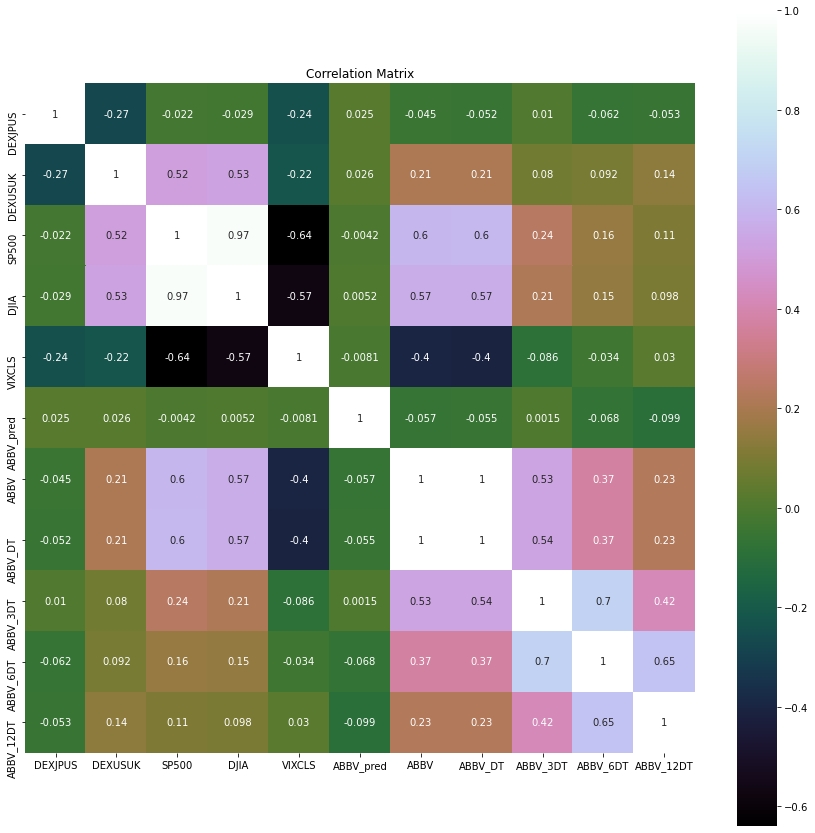

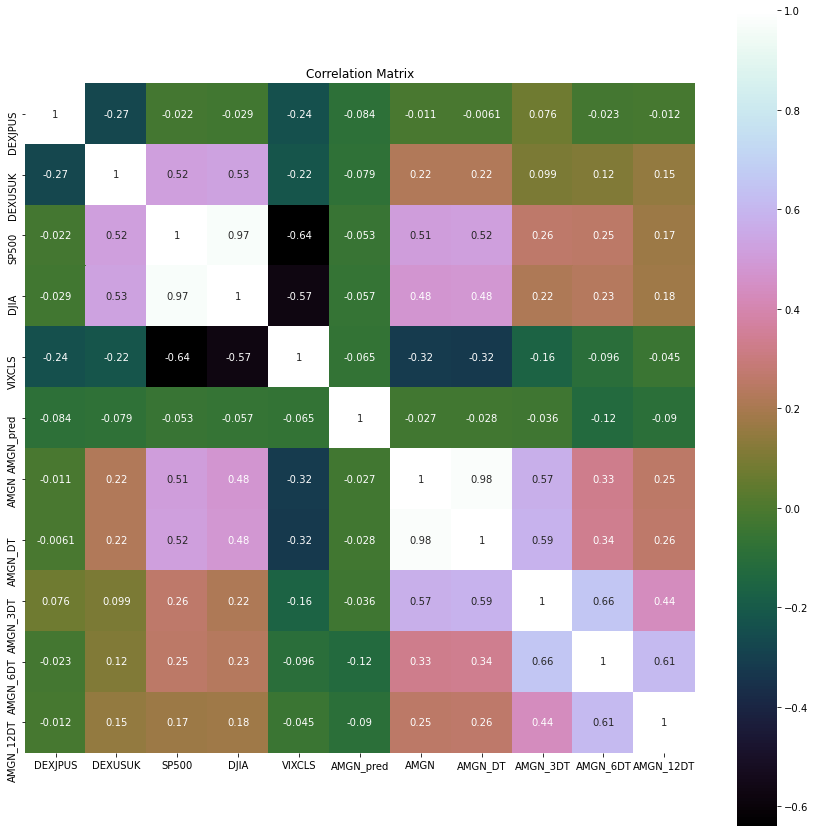

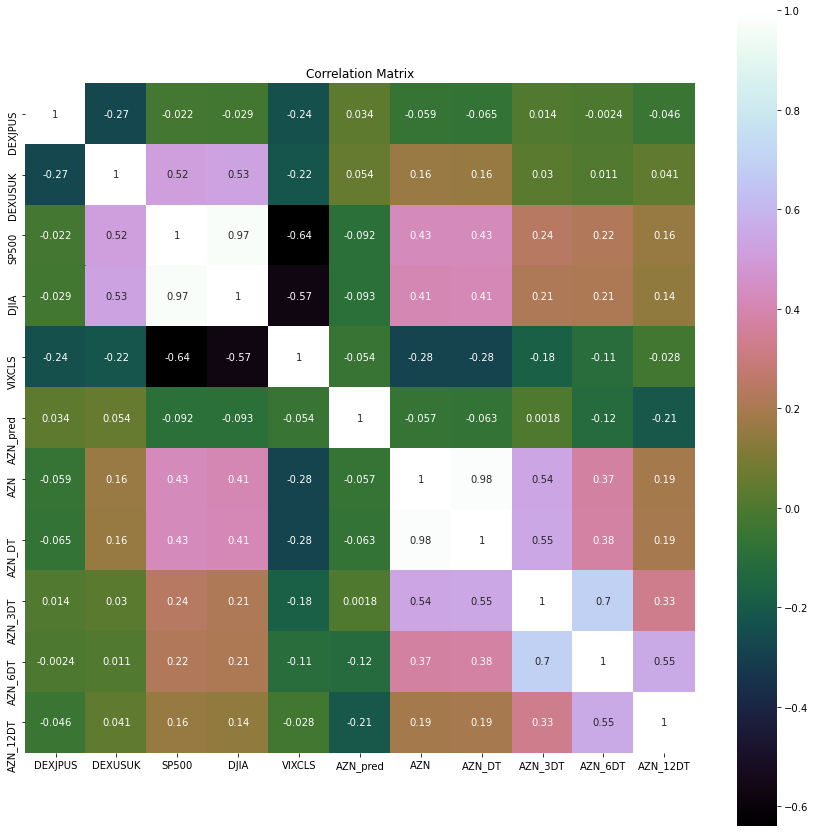

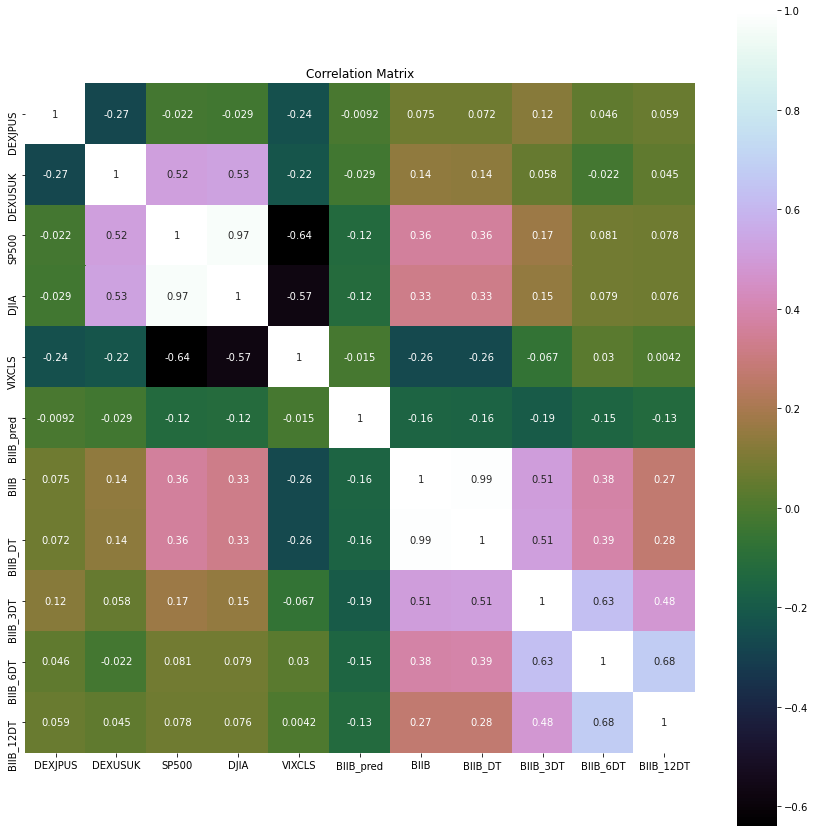

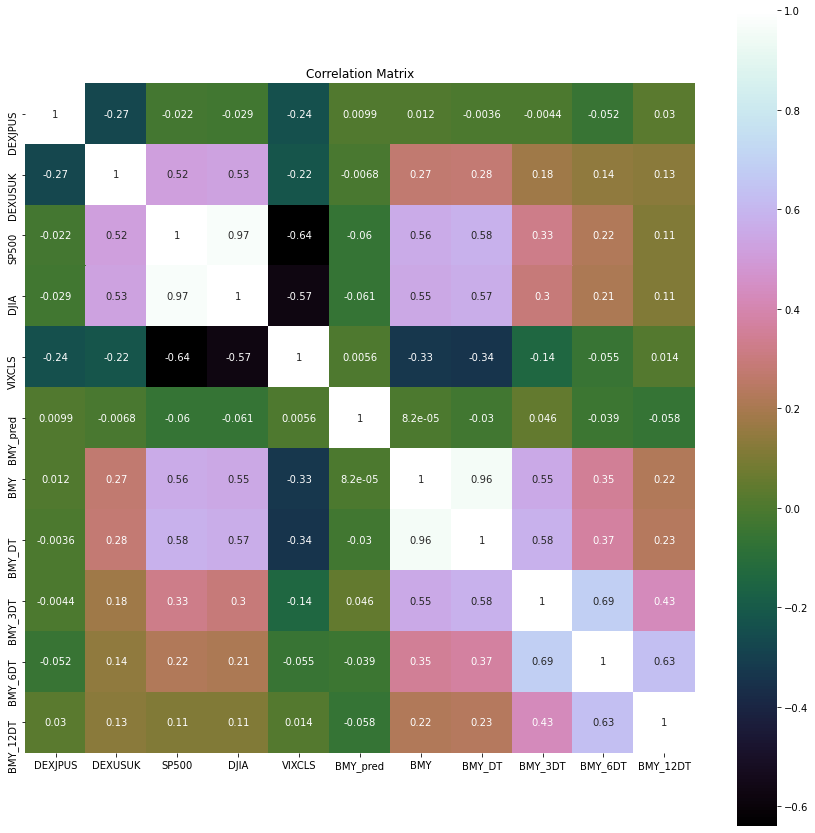

...

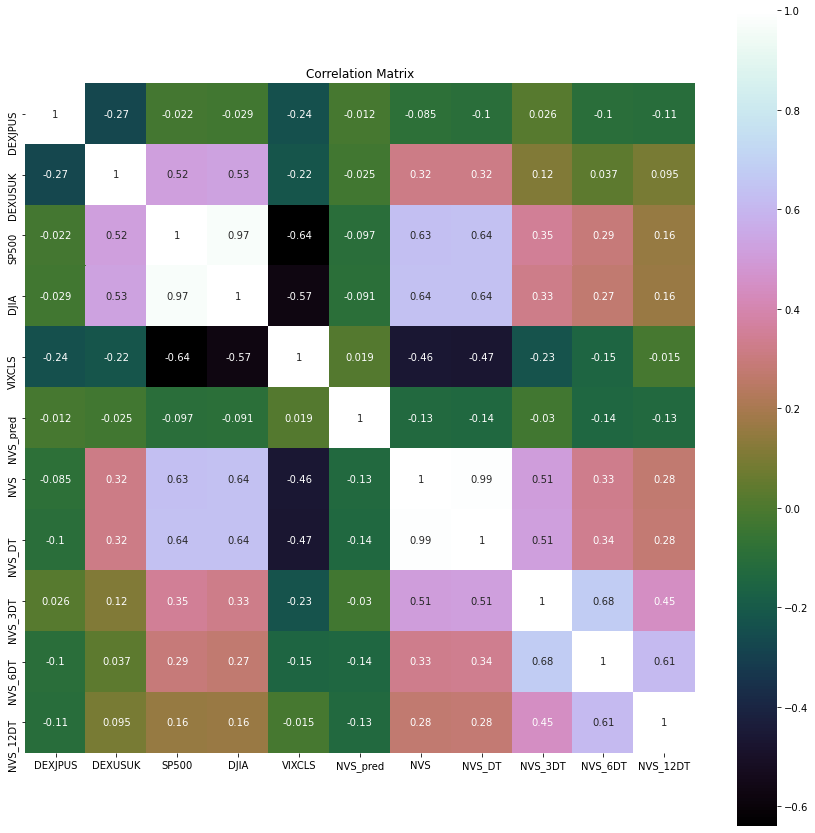

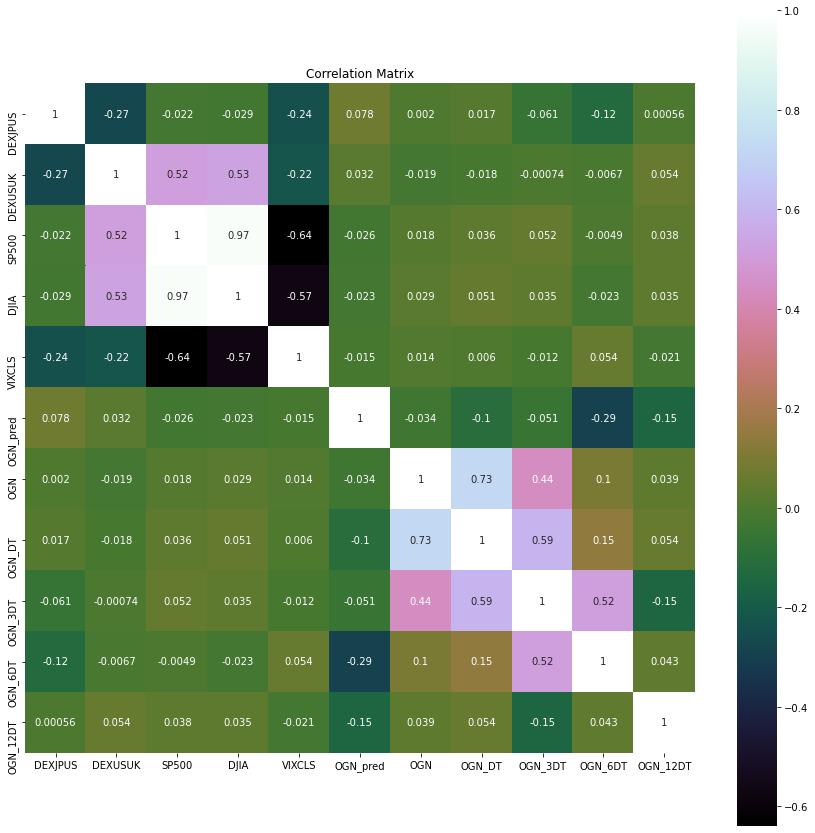

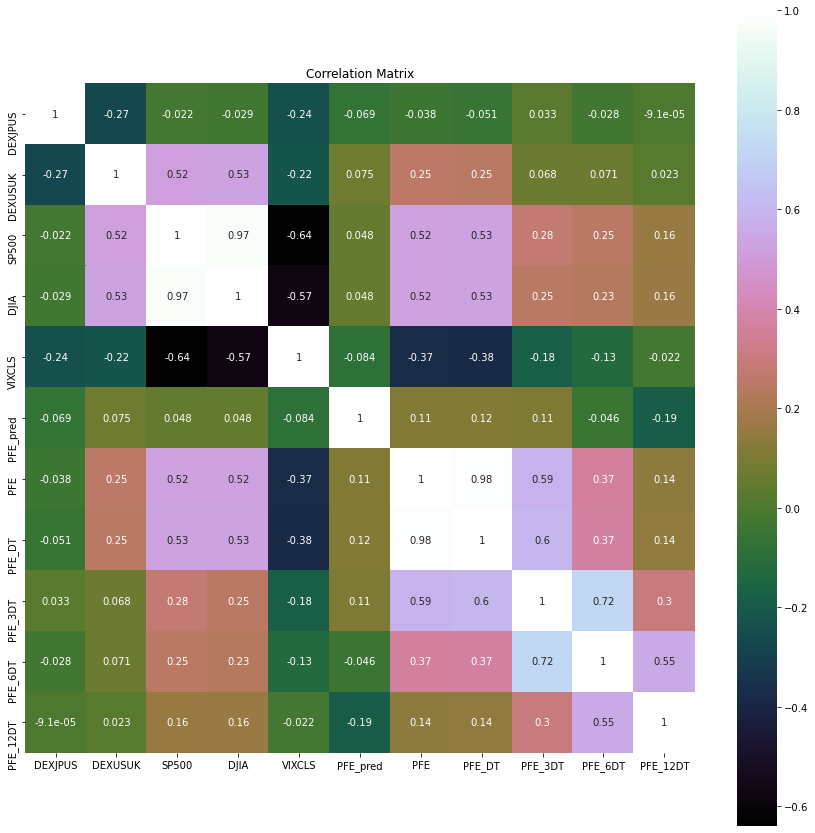

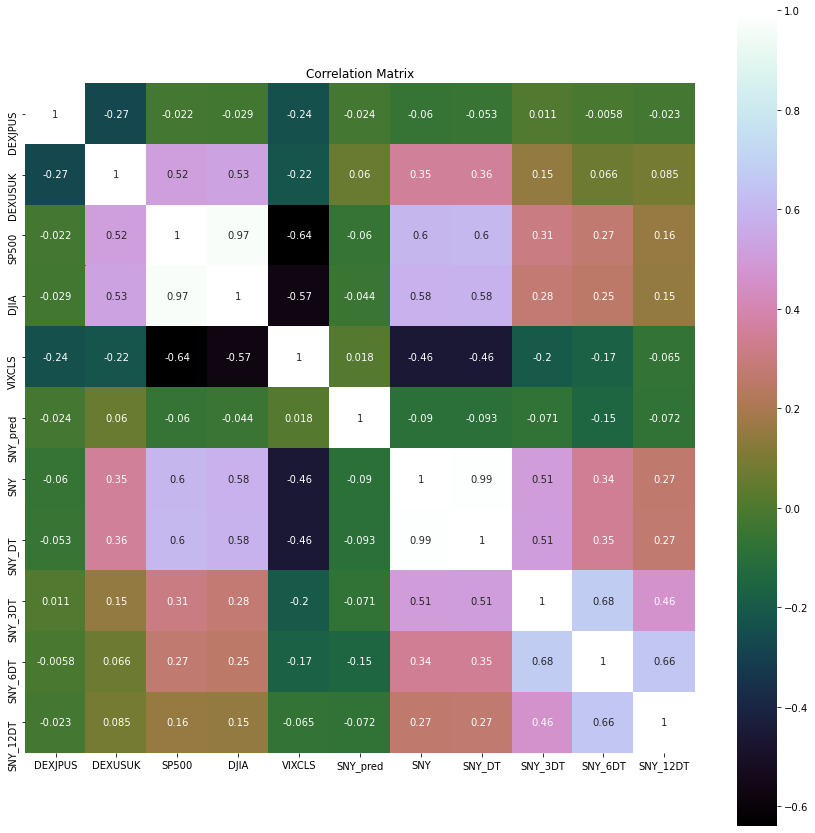

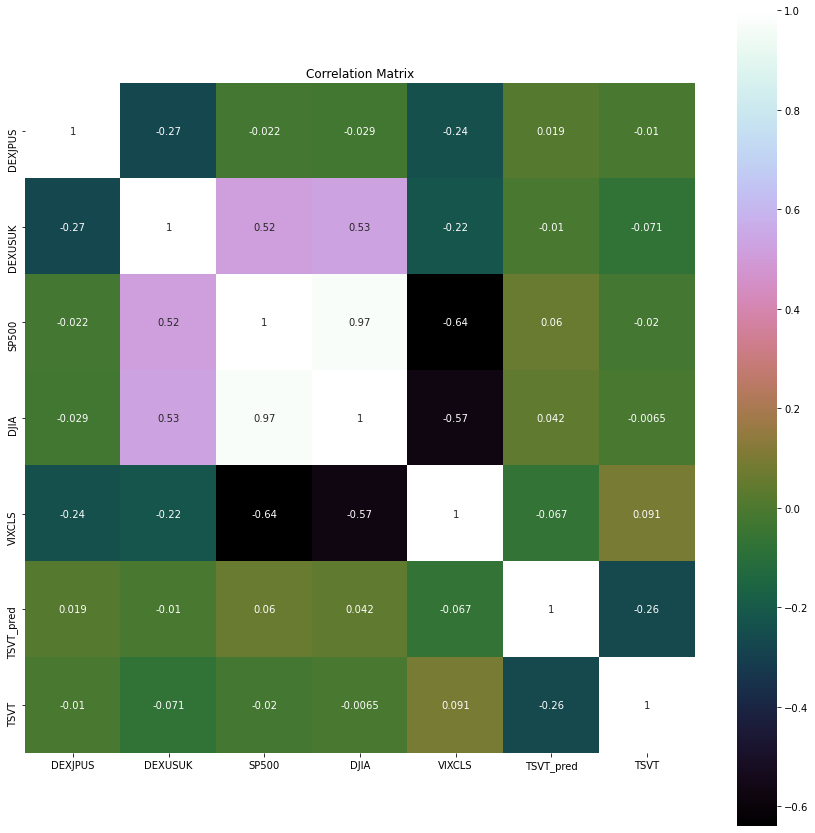

In [58]:
# Plot all tickers
for i in stk_tickers:
    temp = dataset.loc[:,['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
    temp2 = dataset.filter(regex=i, axis=1)
    temp3 = pd.concat([temp, temp2], axis=1)
    
    correlation = temp3.corr()
    pyplot.figure(figsize=(15,15))
    pyplot.title('Correlation Matrix')
    sns.heatmap(correlation, vmax=1, square=True,annot=True,cmap='cubehelix')

<Figure size 1080x1080 with 0 Axes>

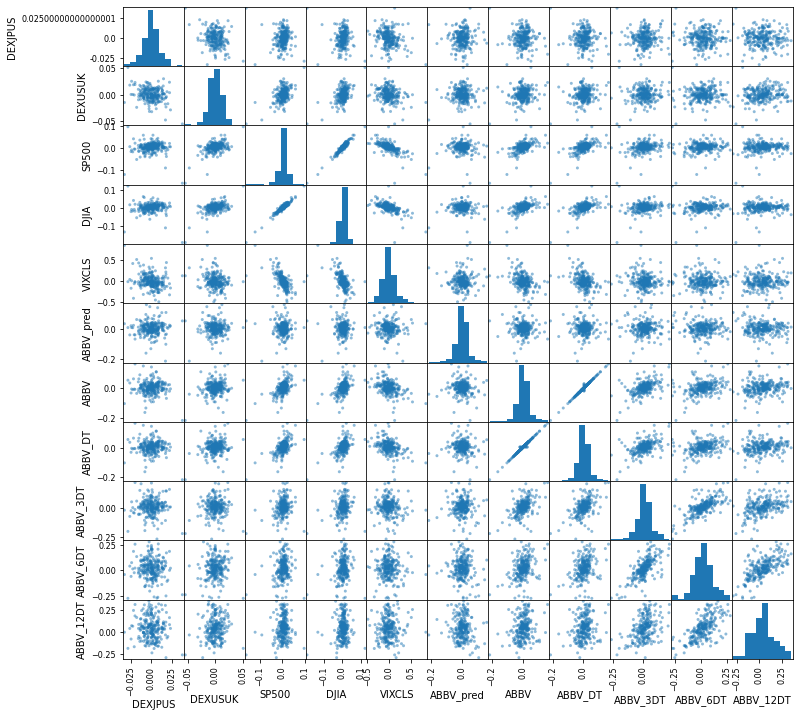

<Figure size 1080x1080 with 0 Axes>

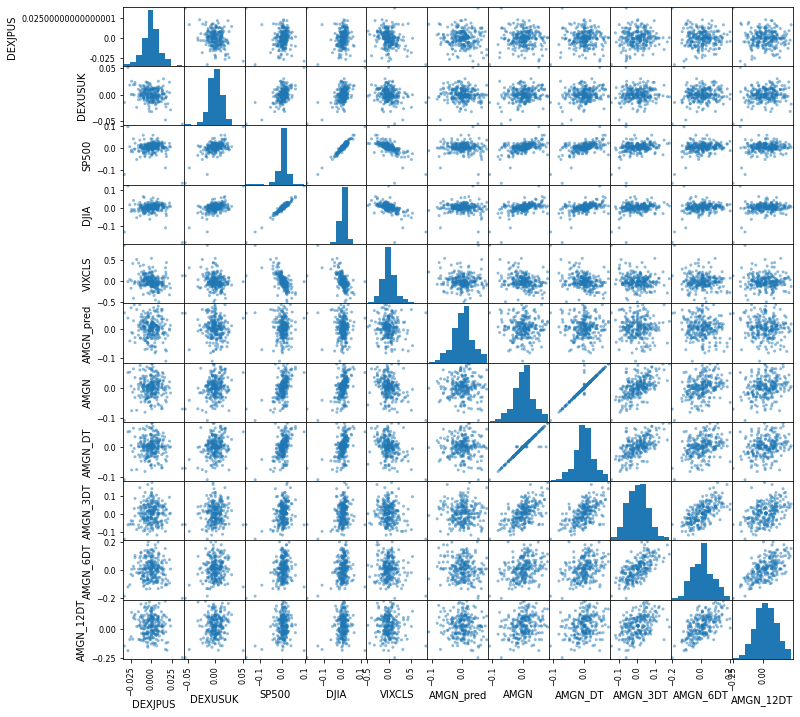

<Figure size 1080x1080 with 0 Axes>

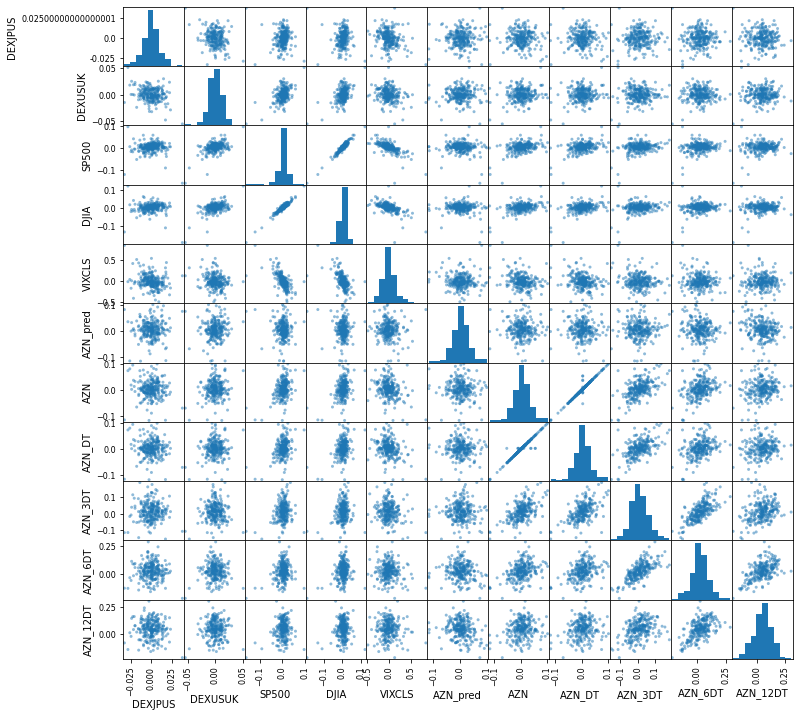

<Figure size 1080x1080 with 0 Axes>

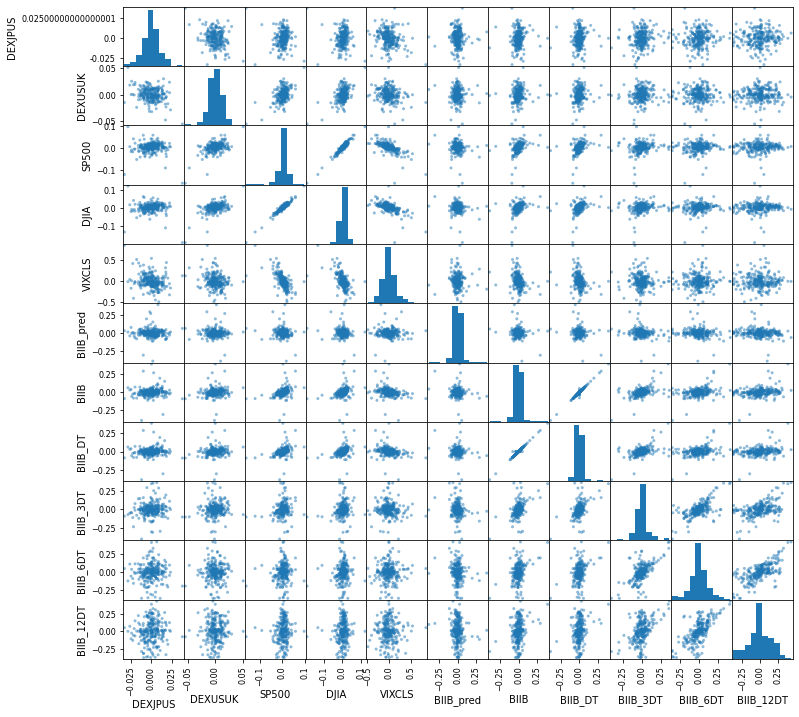

<Figure size 1080x1080 with 0 Axes>

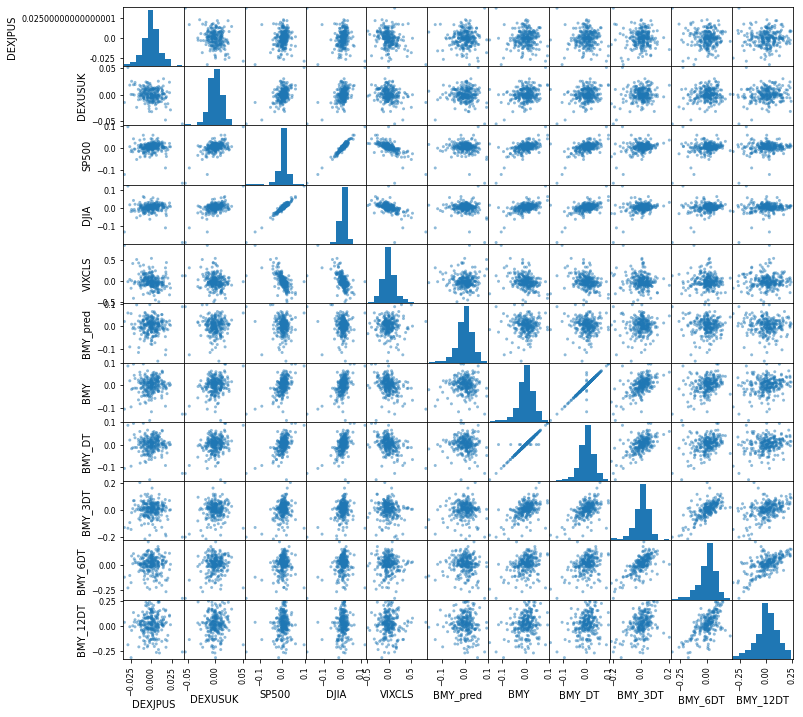

<Figure size 1080x1080 with 0 Axes>

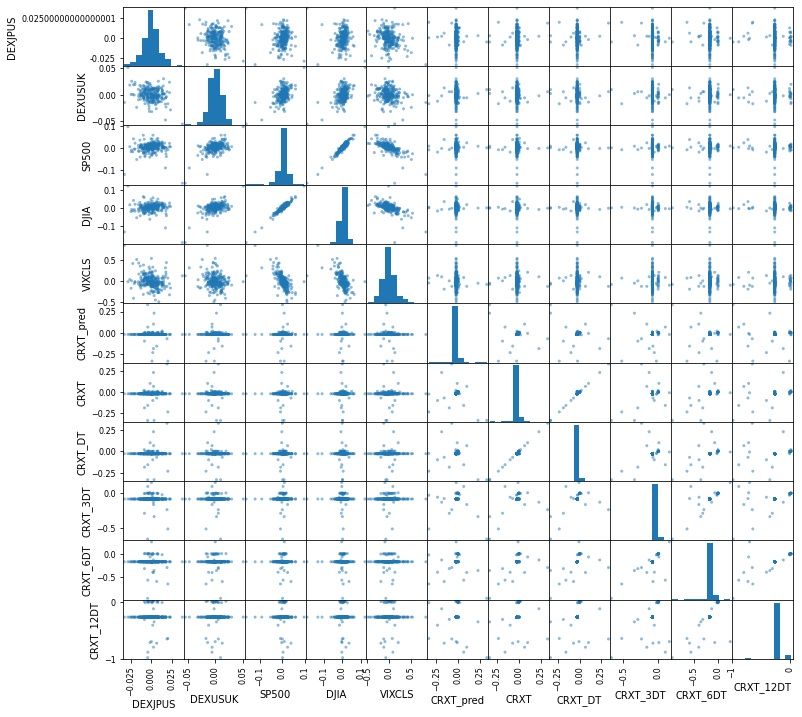

<Figure size 1080x1080 with 0 Axes>

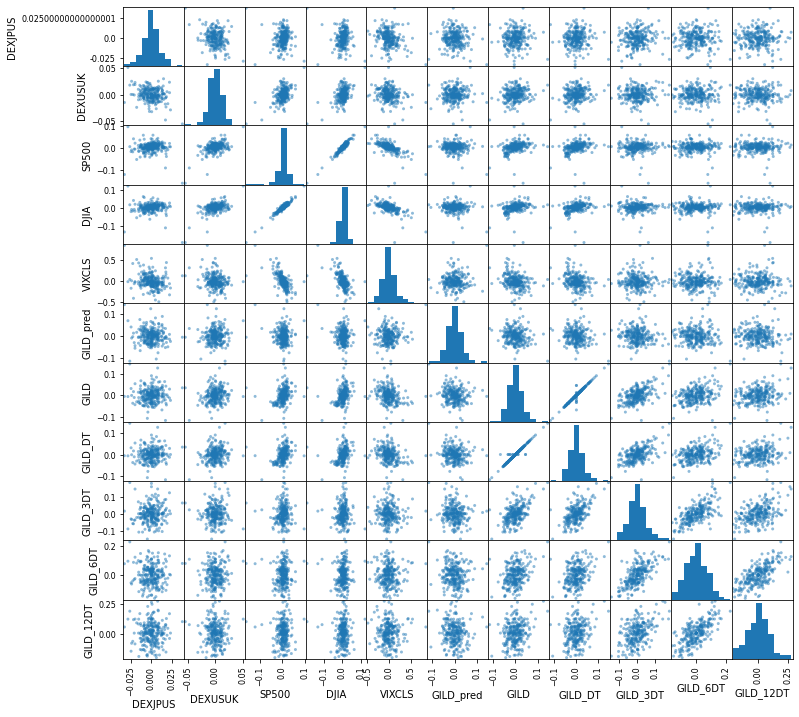

<Figure size 1080x1080 with 0 Axes>

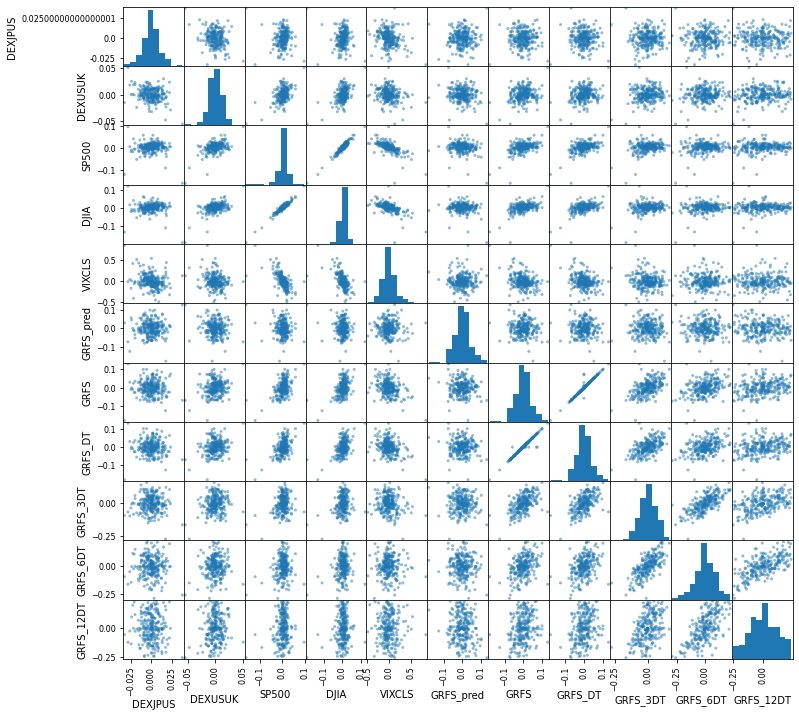

<Figure size 1080x1080 with 0 Axes>

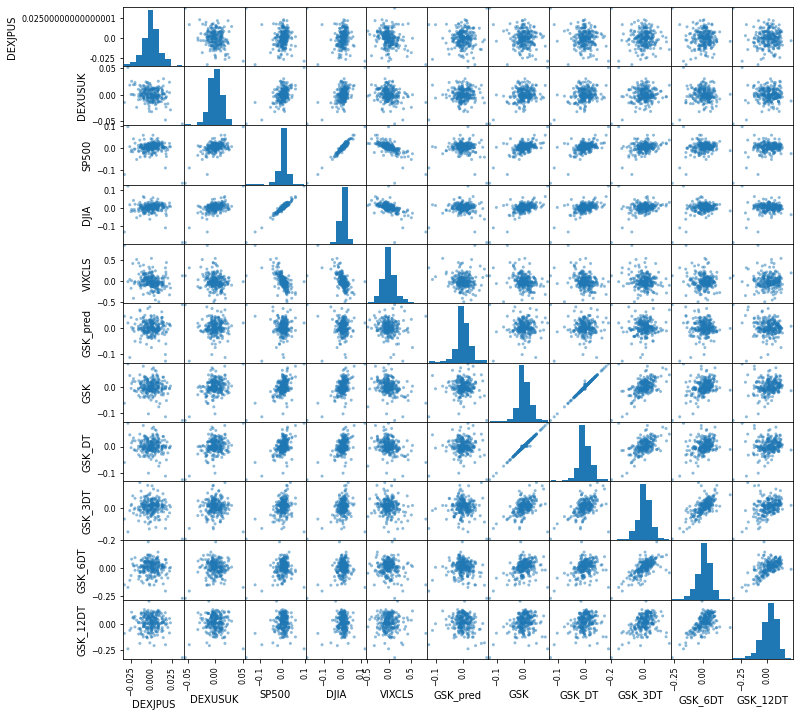

<Figure size 1080x1080 with 0 Axes>

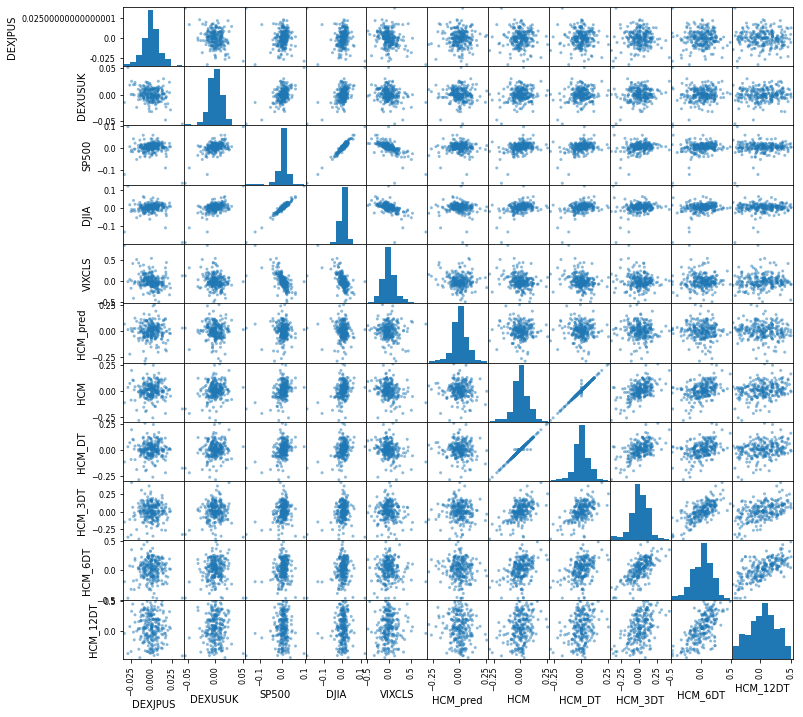

<Figure size 1080x1080 with 0 Axes>

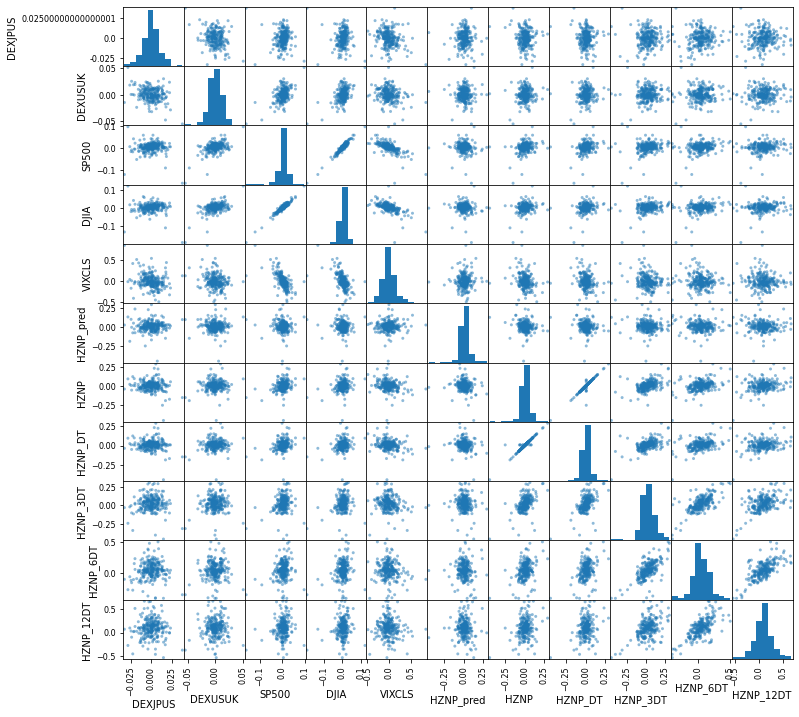

<Figure size 1080x1080 with 0 Axes>

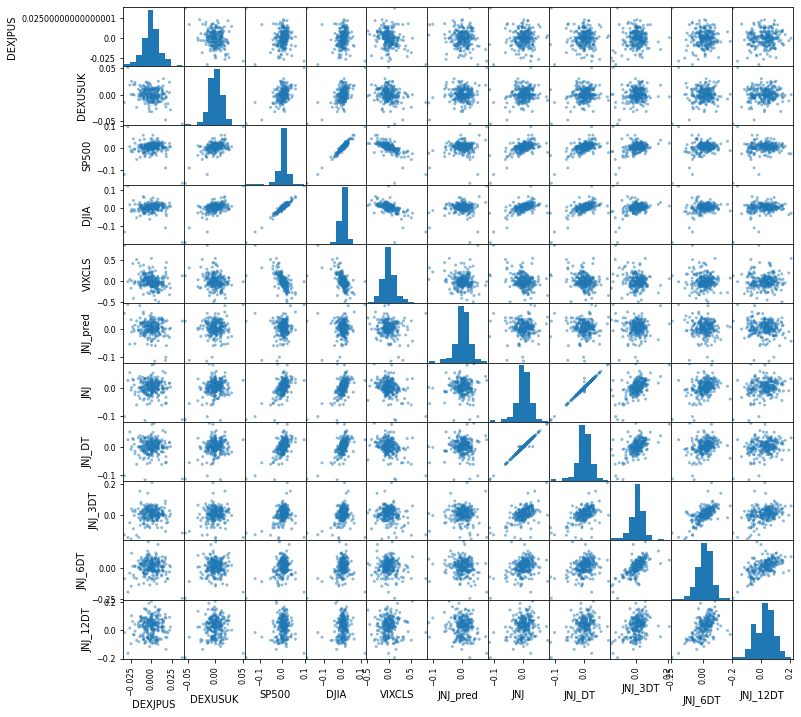

<Figure size 1080x1080 with 0 Axes>

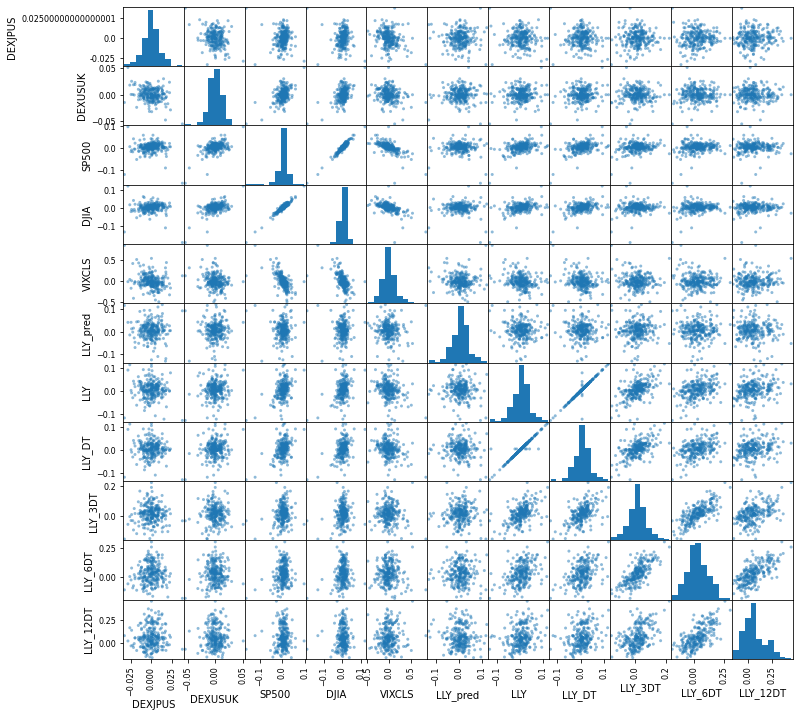

<Figure size 1080x1080 with 0 Axes>

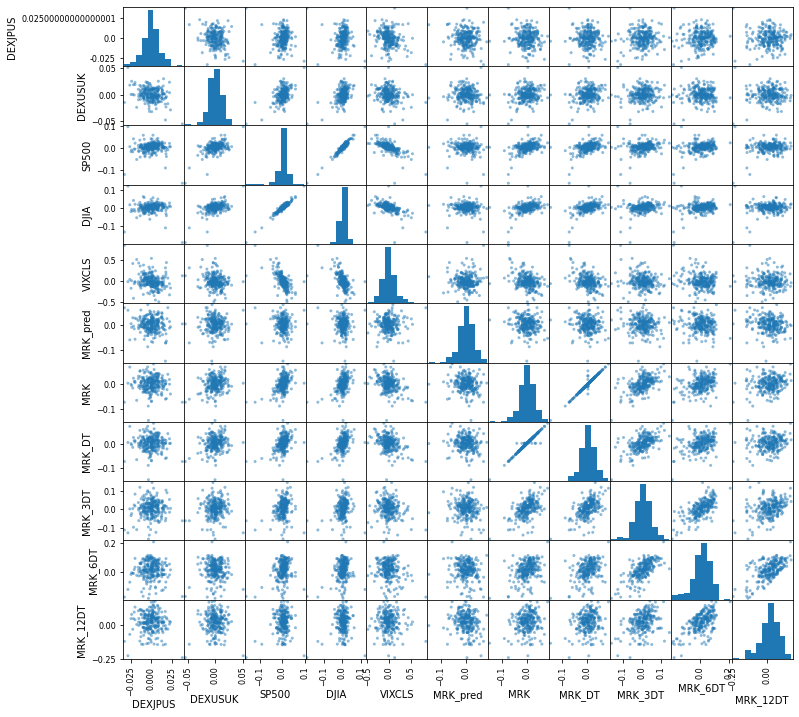

<Figure size 1080x1080 with 0 Axes>

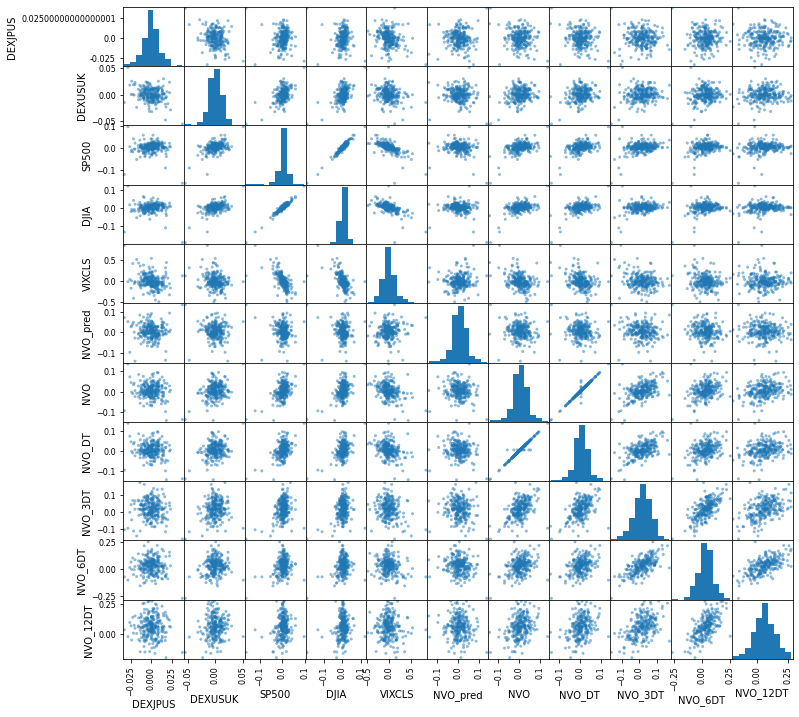

<Figure size 1080x1080 with 0 Axes>

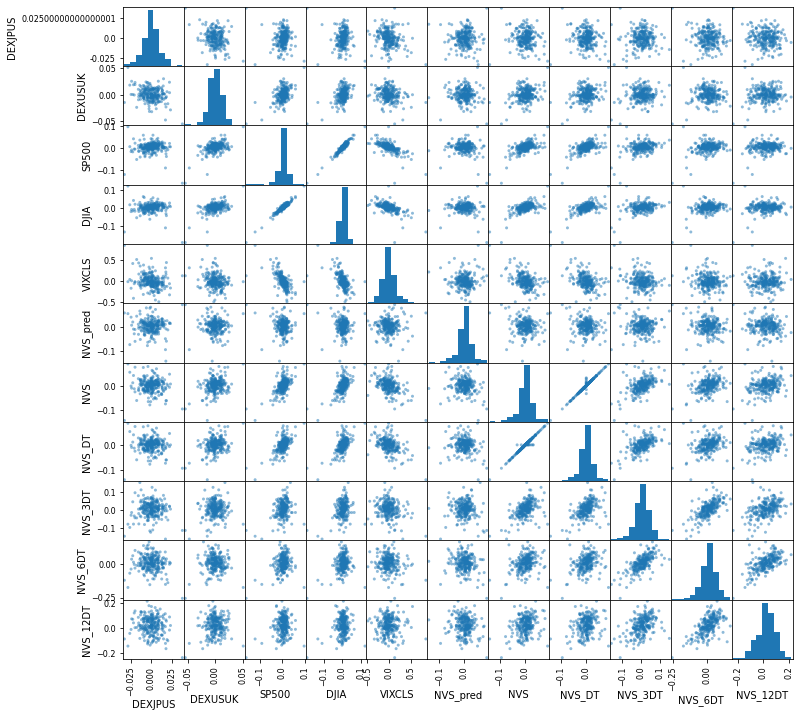

<Figure size 1080x1080 with 0 Axes>

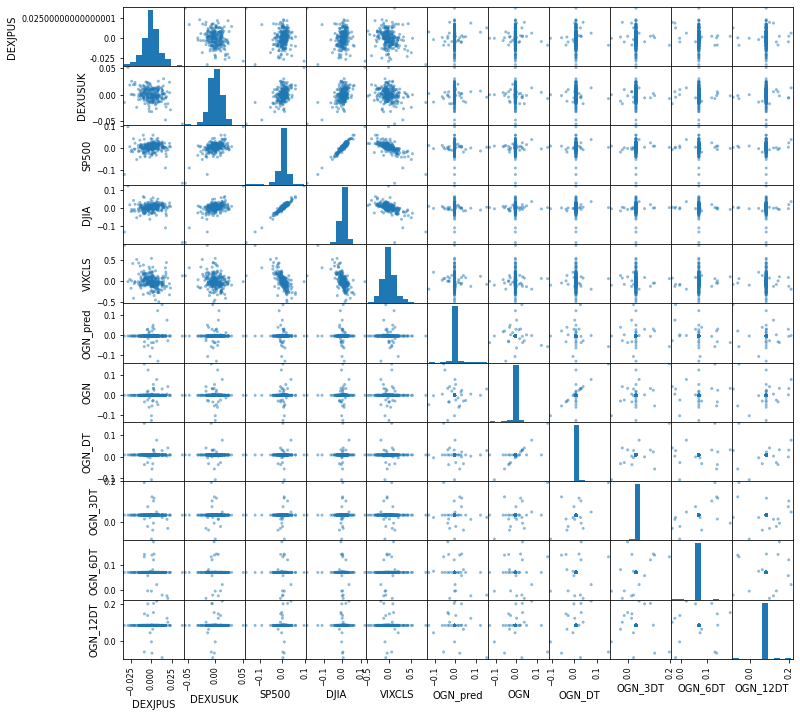

<Figure size 1080x1080 with 0 Axes>

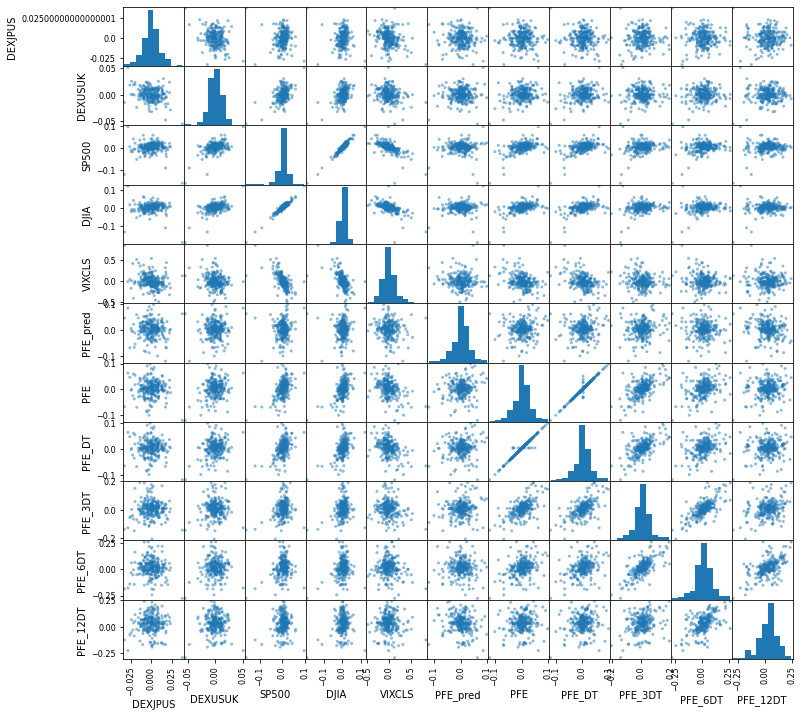

<Figure size 1080x1080 with 0 Axes>

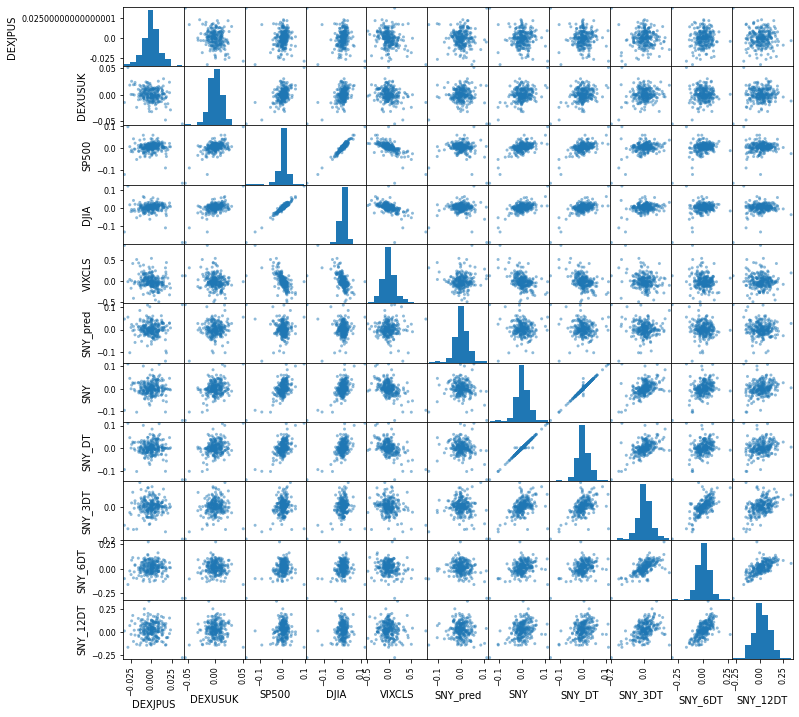

<Figure size 1080x1080 with 0 Axes>

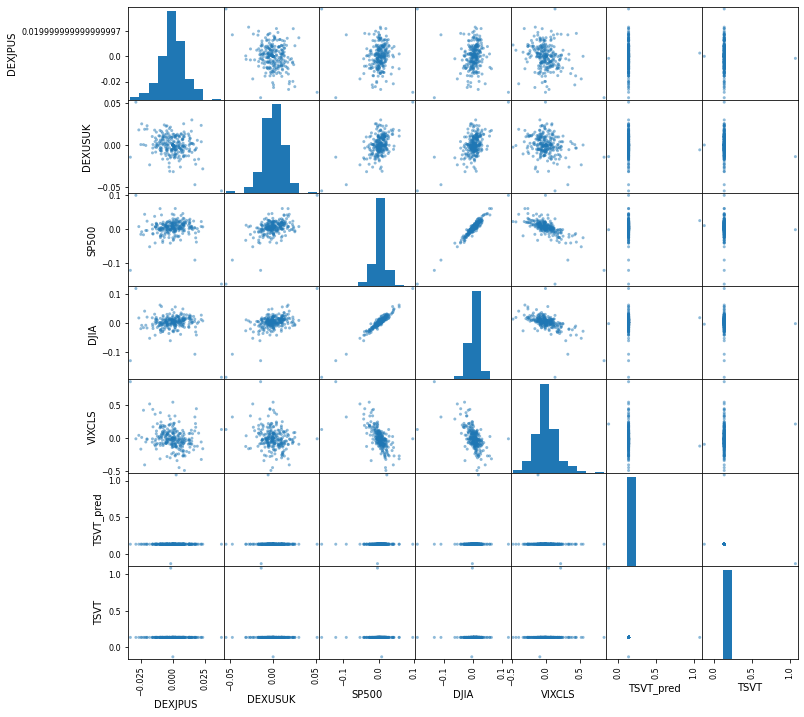

In [59]:
# Plot all tickers
for i in stk_tickers:
    temp = dataset.loc[:,['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
    temp2 = dataset.filter(regex=i, axis=1)
    temp3 = pd.concat([temp, temp2], axis=1)
    
    pyplot.figure(figsize=(15,15))
    scatter_matrix(temp3,figsize=(12,12))
    pyplot.show()

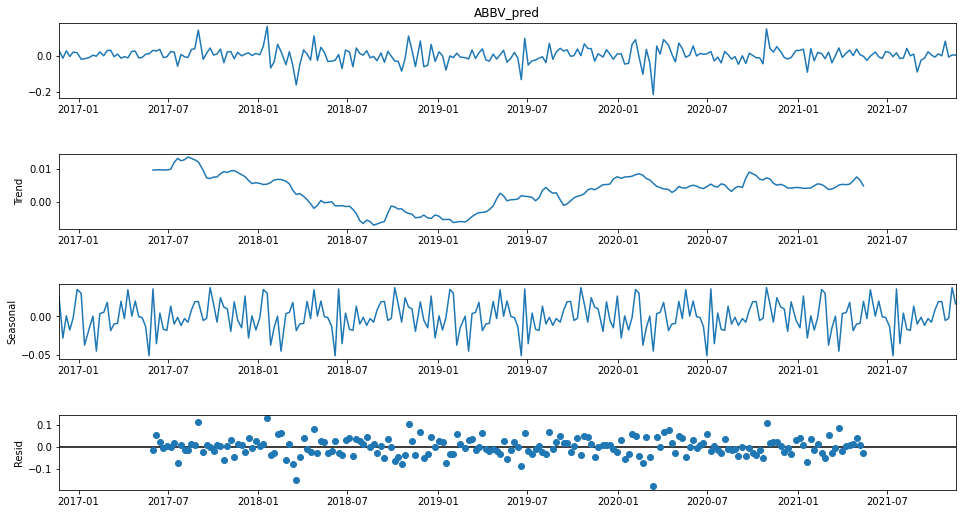

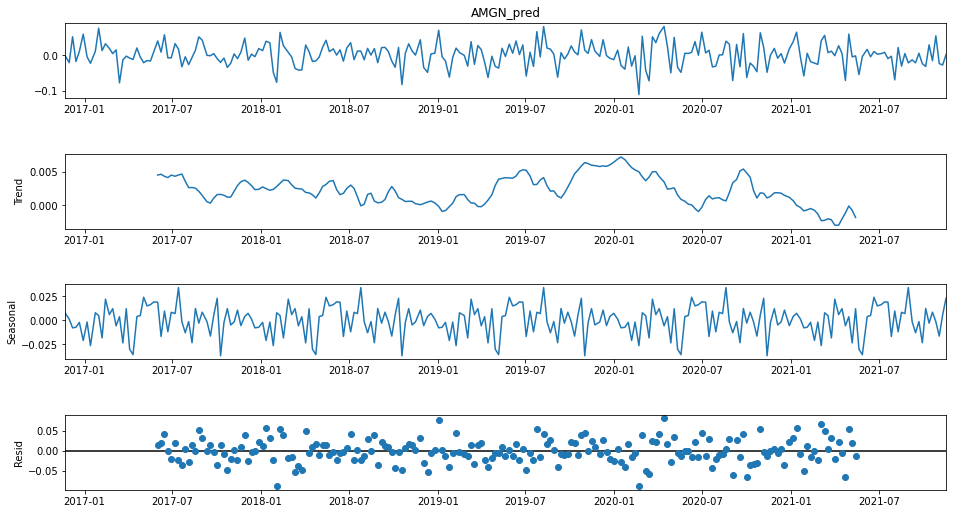

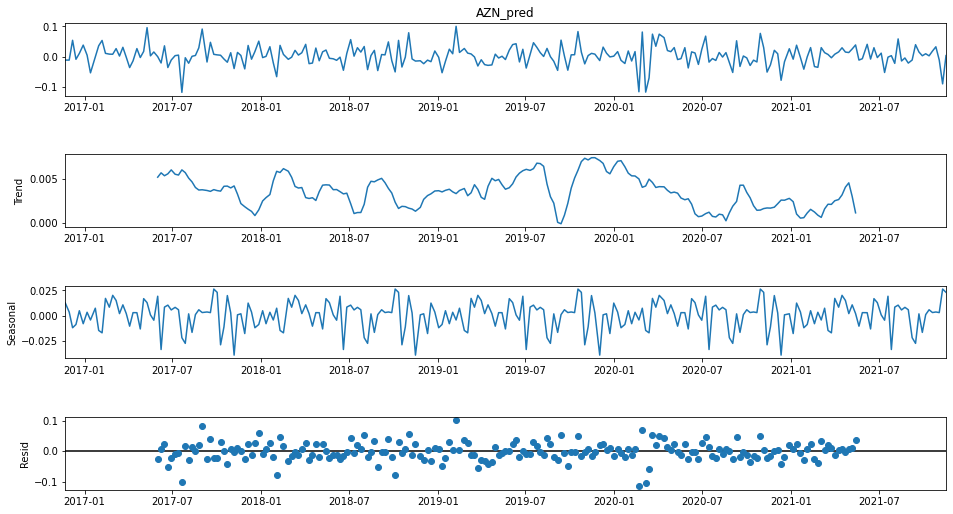

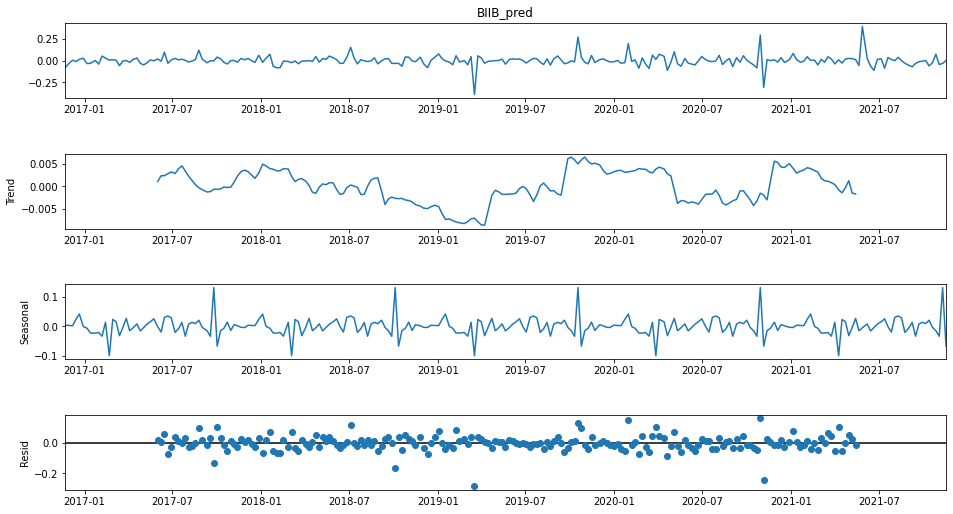

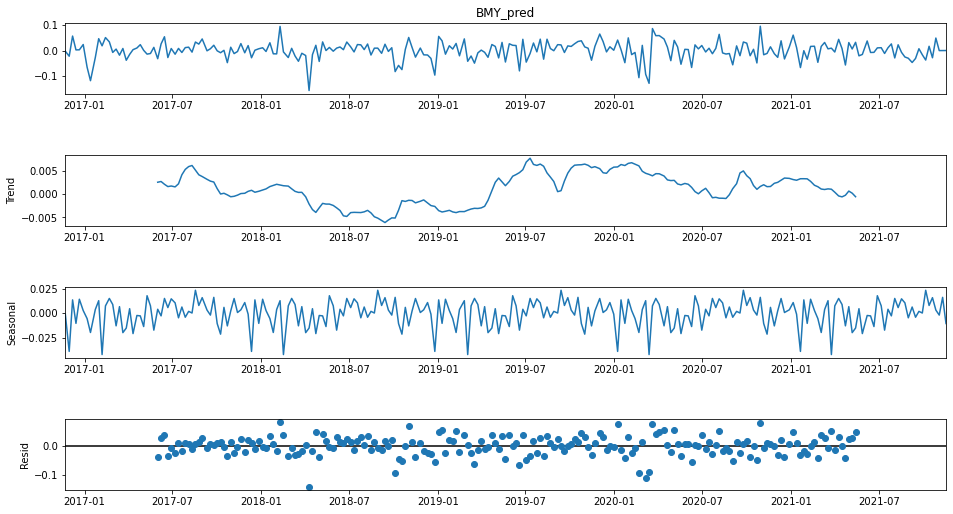

...

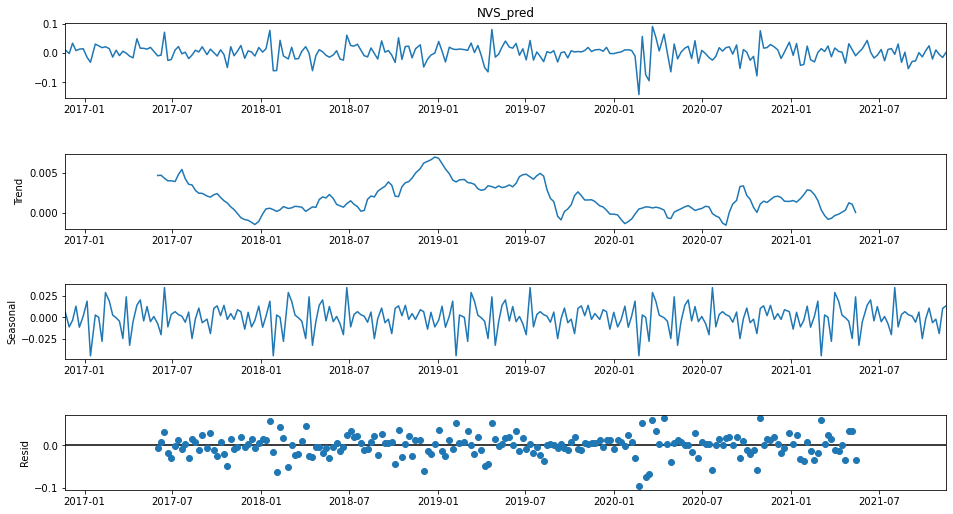

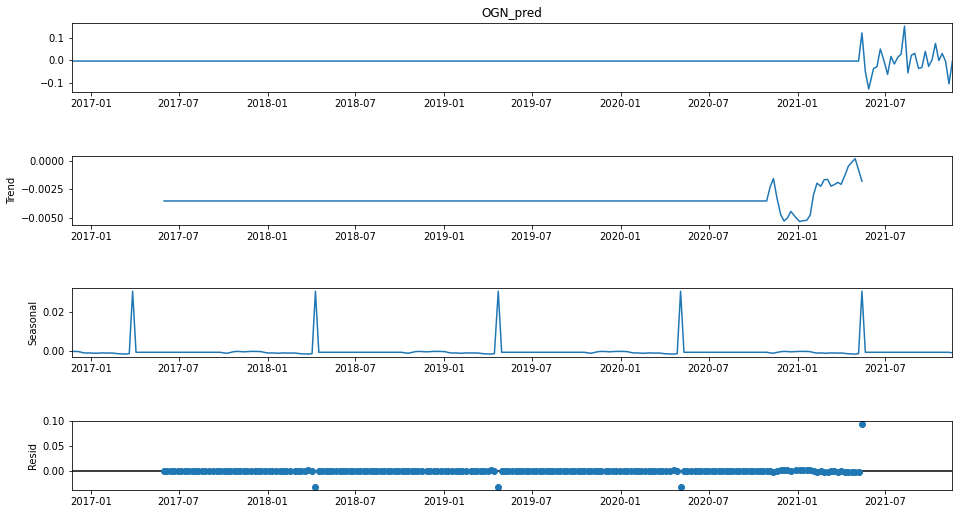

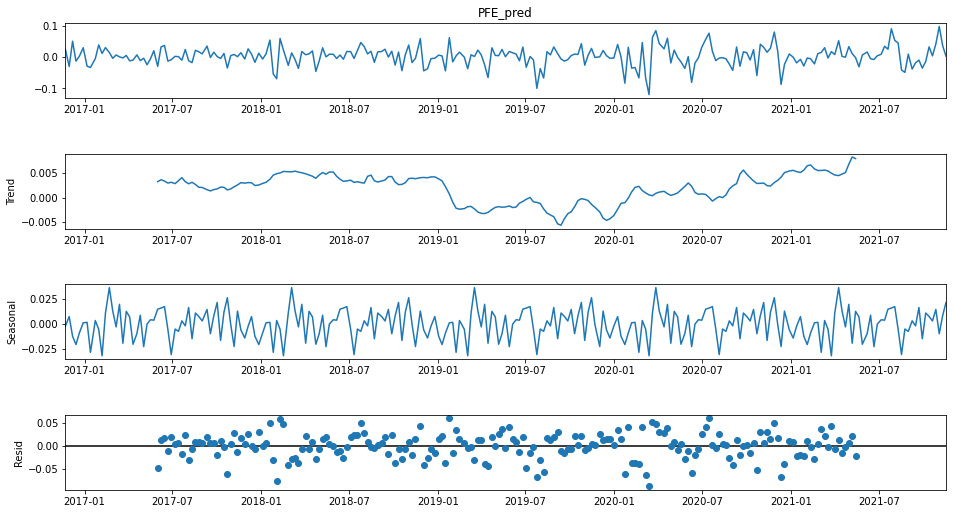

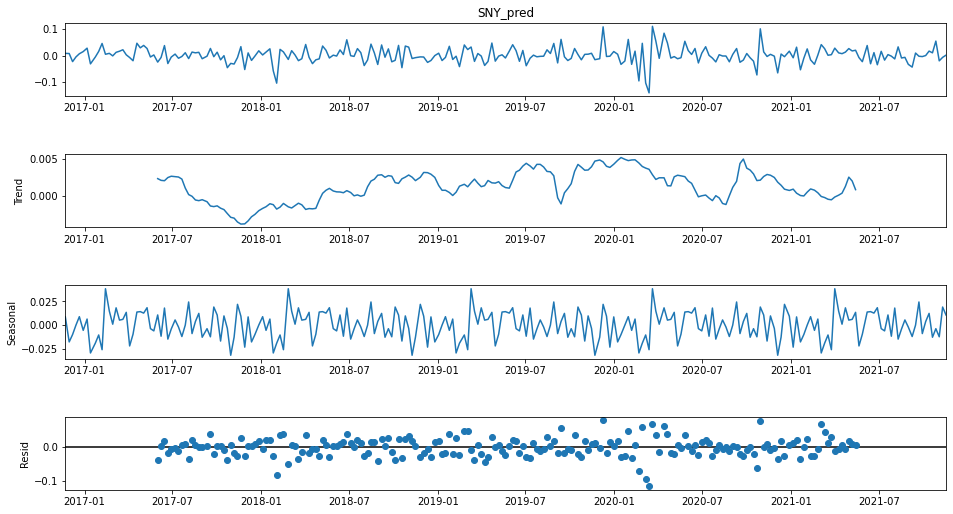

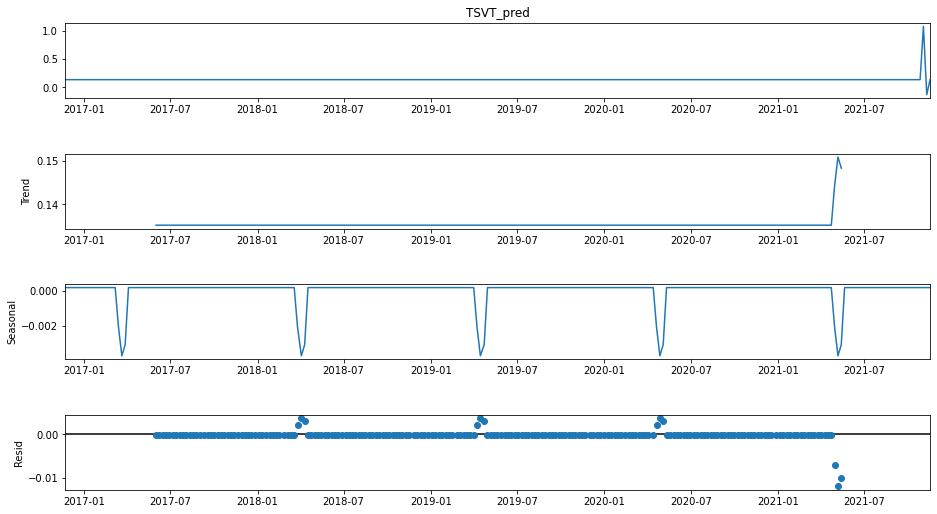

In [60]:
# Seasonality
for i in stk_tickers:
    res = sm.tsa.seasonal_decompose(Y.loc[:,i+'_pred'],period=52)
    fig = res.plot()
    fig.set_figheight(8)
    fig.set_figwidth(15)
    pyplot.show()

In [61]:
validation_size = 0.2
train_size = int(len(X) * (1-validation_size))
X_train, X_test = X[0:train_size], X[train_size:len(X)]
Y_train, Y_test = Y[0:train_size], Y[train_size:len(X)]

In [62]:
num_folds = 10
scoring = 'neg_mean_squared_error'

In [63]:
# Without the tuning hyperparameters
models = []
#models.append(('LR', LinearRegression()))
models.append(('LASSO', Lasso()))
models.append(('EN', ElasticNet()))
models.append(('KNN', KNeighborsRegressor()))
models.append(('CART', DecisionTreeRegressor()))
models.append(('SVR', SVR()))

In [64]:
models.append(('MLP', MLPRegressor()))
# Boosting methods
models.append(('ABR', AdaBoostRegressor()))
models.append(('GBR', GradientBoostingRegressor())) 
# Bagging methods
models.append(('RFR', RandomForestRegressor()))
models.append(('ETR', ExtraTreesRegressor()))

In [65]:
from random import seed

In [66]:
import warnings
warnings.filterwarnings("ignore")

In [67]:
seed(1)

In [68]:
# for i in stk_tickers:
#     X_temp = X_train.filter(regex=i, axis=1)
#     Y_temp = Y_train.filter(regex=i, axis=1)
#     X_temp_test = X_test.filter(regex=i, axis=1)
#     Y_temp_test = Y_test.filter(regex=i, axis=1)
    
#     names = []
    
#     kfold_results = [] 
#     test_results = [] 
#     train_results = []
#     for name, model in models:
#         names.append(name)
#         ## k-fold analysis:
#         kfold = KFold(n_splits=num_folds)
#         #converted mean squared error to positive. The lower the better
#         cv_results = -1* cross_val_score(model, X_temp, Y_temp, cv=kfold, scoring=scoring)
#         kfold_results.append(cv_results)
#         # Full Training period
#         res = model.fit(X_temp, Y_temp)
#         train_result = mean_squared_error(res.predict(X_temp), Y_temp) 
#         train_results.append(train_result)
#         # Test results
#         test_result = mean_squared_error(res.predict(X_temp_test), Y_temp_test) 
#         test_results.append(test_result)
#     for j in range(0,1):
#         fig = pyplot.figure()
#         fig.suptitle(f'Algorithm Comparison: Kfold results {i}')
#         ax = fig.add_subplot(111)
#         pyplot.boxplot(kfold_results)
#         ax.set_xticklabels(names)
#         fig.set_size_inches(15,8)
#         pyplot.show()
#     for k in range(0,1):
#         fig = pyplot.figure()
#         ind = np.arange(len(names)) # the x locations for the groups
#         width = 0.35 # the width of the bars
#         fig.suptitle(f'Algorithm Comparison {i}')
#         ax = fig.add_subplot(111)
#         pyplot.bar(ind - width/2, train_results,  width=width, label='Train Error')
#         pyplot.bar(ind + width/2, test_results, width=width, label='Test Error')
#         fig.set_size_inches(15,8)
#         pyplot.legend()
#         ax.set_xticks(ind)
#         ax.set_xticklabels(names)
#         pyplot.show()
    

In [69]:
#stk_idx_coin_tickers = stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']
#X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
X_test

,ABBV,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2020-11-19,0.020987,-0.047248,-0.050701,0.010133,-0.010574,-0.020242,0.010779,0.016798,-0.016291,-0.020505,...,0.070321,0.082645,0.015702,0.088291,0.043666,0.012706,-0.003140,0.111538,0.010273,-0.015020
2020-11-27,0.051047,0.000623,-0.026633,-0.000943,0.015343,-0.020242,-0.009945,-0.027442,-0.001886,0.041230,...,0.070321,0.082645,0.028332,0.075413,0.081258,0.063630,0.004902,0.015770,0.023149,0.012992
2020-12-04,0.022530,0.019383,0.021251,0.008537,-0.011806,-0.020242,0.025168,0.007994,0.011533,-0.081490,...,0.070321,0.082645,0.080229,0.124263,0.137695,0.186419,-0.001958,-0.000196,0.042023,0.006488
2020-12-11,-0.008801,-0.007928,0.009814,-0.018223,-0.025849,-0.020242,-0.013081,-0.005322,0.002397,-0.036609,...,0.070321,0.082645,0.019151,0.127712,0.216002,0.173278,-0.064761,-0.061817,0.049721,-0.084936
2020-12-18,-0.017933,0.004782,-0.077757,0.033360,0.038764,-0.020242,-0.016784,0.040267,-0.015550,0.009542,...,0.070321,0.082645,-0.087365,0.012014,0.087428,0.115124,0.006045,-0.060674,-0.044903,-0.054002
2020-12-28,-0.009620,-0.021410,-0.016669,-0.022157,-0.032199,-0.020242,-0.037773,-0.056405,-0.019646,-0.006351,...,0.070321,0.082645,-0.023088,-0.091303,0.032960,0.075121,-0.003956,-0.062672,-0.062868,-0.041481
2021-01-05,0.029057,0.018210,0.026380,0.009133,0.014956,-0.020242,0.053225,0.020929,0.037587,0.256767,...,0.070321,0.082645,0.009999,-0.100455,0.027257,0.070923,0.016758,0.018847,-0.042970,-0.032697
2021-01-12,0.030333,0.038036,-0.008120,0.081793,0.061131,-0.020242,0.034079,0.016329,-0.005856,-0.051985,...,0.070321,0.082645,-0.000269,-0.013358,-0.001344,0.079914,-0.008034,0.004768,-0.055905,-0.032756
2021-01-20,0.037169,0.064528,0.038042,0.010750,0.012455,-0.020242,0.090937,0.006769,0.014839,-0.043626,...,0.070321,0.082645,-0.018459,-0.008729,-0.100031,0.037664,0.031755,0.040480,-0.022192,0.019831
2021-01-27,-0.091331,-0.005165,-0.002684,-0.019163,-0.065979,-0.020242,-0.037616,-0.048920,0.004199,-0.056397,...,0.070321,0.082645,-0.007149,-0.025876,-0.126331,0.089671,-0.053077,-0.029356,-0.010509,0.039212


In [70]:
X

,ABBV,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2016-11-22,0.003566,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-11-30,0.031240,-0.001803,-0.011033,-0.078579,-0.001947,-0.020242,-0.010259,0.012231,-0.006594,0.097842,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-12-07,-0.013412,-0.020193,-0.011156,-0.030277,-0.021491,-0.020242,-0.012562,-0.058227,-0.006371,0.066388,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-12-14,0.027620,0.051757,0.054210,0.003324,0.057340,-0.020242,0.045887,0.002058,0.010859,-0.002030,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
2016-12-21,-0.003574,-0.017093,-0.008464,-0.011030,0.003243,-0.020242,-0.023386,0.074597,0.004468,-0.052864,...,0.070321,0.082645,0.002709,0.007855,0.014252,0.028147,0.001504,0.005036,0.009923,0.020039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-20,0.010944,0.029281,0.002973,-0.062104,0.017371,-0.070479,-0.011451,-0.005772,0.016867,0.002485,...,0.022339,0.213650,0.032774,-0.016912,-0.083129,0.025507,0.017066,0.013960,-0.021580,-0.050681
2021-10-27,-0.000092,-0.014799,0.018628,-0.025148,-0.027586,-0.157876,-0.001347,-0.037601,0.024037,-0.045058,...,0.057620,0.199227,0.003964,0.022357,-0.041036,-0.061158,0.010546,0.028027,0.031977,-0.038196
2021-11-03,0.081206,0.054403,0.032806,0.072835,0.049557,0.066615,0.009540,-0.028965,0.074126,0.014180,...,0.120196,0.201490,0.042152,0.078891,0.019602,-0.072497,0.054566,0.082178,0.076801,0.028679
2021-11-10,-0.006999,-0.022814,-0.010869,-0.046338,0.000505,0.101352,-0.001336,-0.049951,-0.008073,-0.040156,...,0.075096,0.042966,0.098313,0.144430,0.127518,-0.019420,-0.019482,0.045630,0.059590,-0.023675


In [71]:
# ARIMA
#ya no es necesario meterle rezagos de MSFT
# X_train_ARIMA=X_train.loc[:, ['GOOGL', 'IBM', 'DEXJPUS', 'SP500', 'DJIA', 'VIXCLS']]
# X_test_ARIMA=X_test.loc[:, ['GOOGL', 'IBM', 'DEXJPUS', 'SP500', 'DJIA', 'VIXCLS']]

# X_train_ARIMA=X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
# X_test_ARIMA=X_test.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]

# tr_len = len(X_train_ARIMA)
# te_len = len(X_test_ARIMA)
# #to_len = len(X)
# to_len = 0

In [72]:
# X_train_ARIMA

In [73]:
# X_train_ARIMA.index=pd.DatetimeIndex(X_train_ARIMA.index).to_period('W')

In [74]:
# stk_tickers[0]

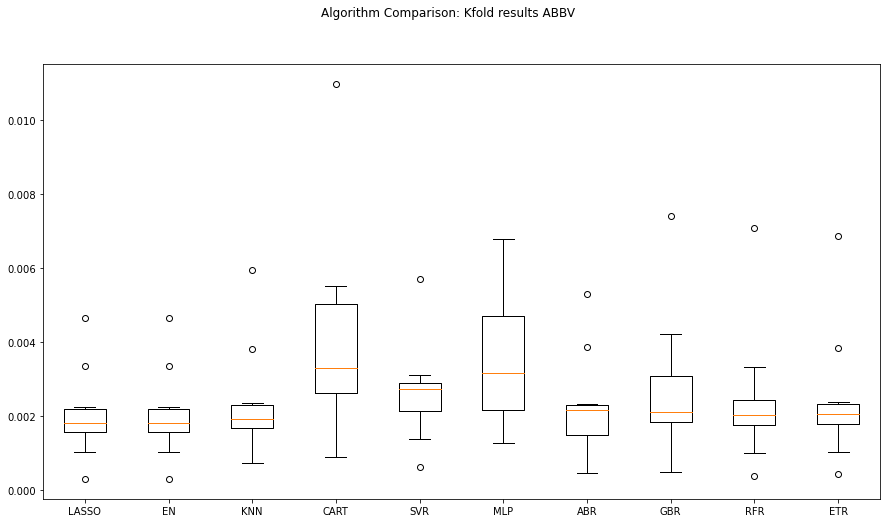

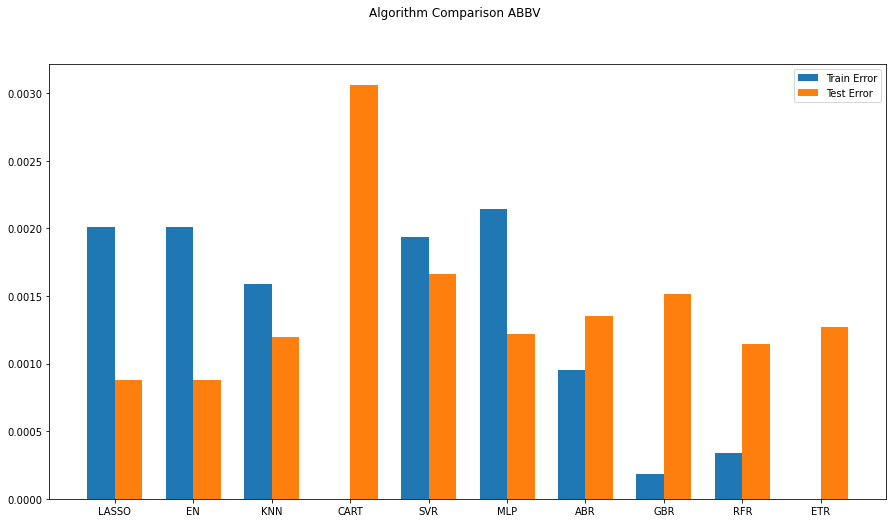

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0009304077335690393
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

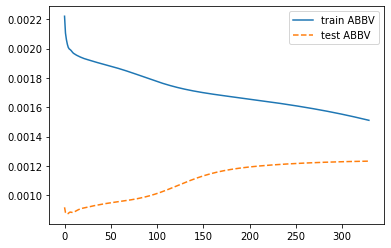

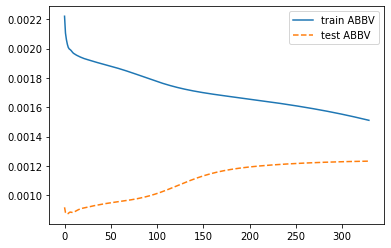

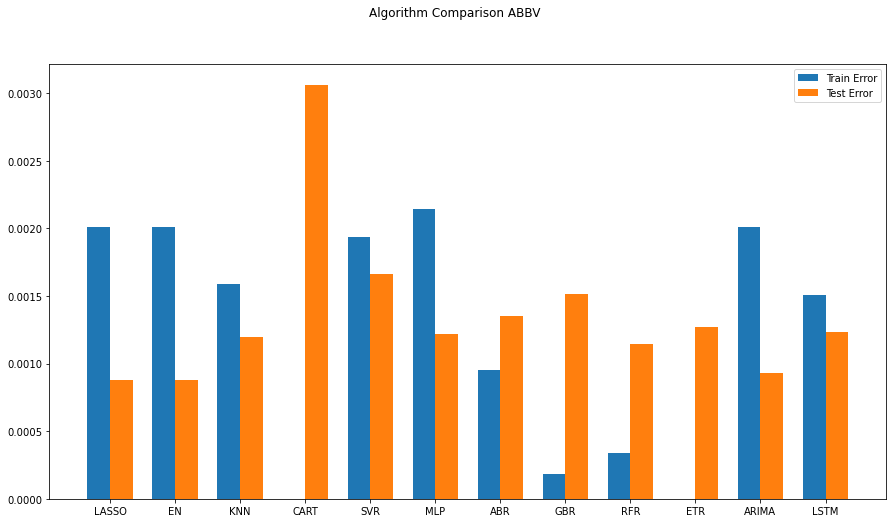

ARIMA(0, 0, 0) MSE=0.0019980
ARIMA(0, 0, 1) MSE=0.0019895
ARIMA(1, 0, 0) MSE=0.0019916
ARIMA(1, 0, 1) MSE=0.0019864
ARIMA(2, 0, 0) MSE=0.0019690
ARIMA(2, 0, 1) MSE=0.0019184
Best ARIMA(2, 0, 1) MSE=0.0019184
0.0009304077335690393


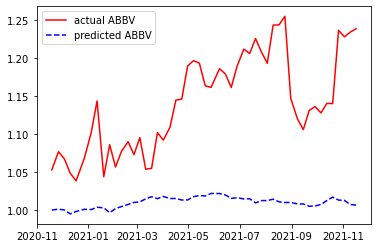

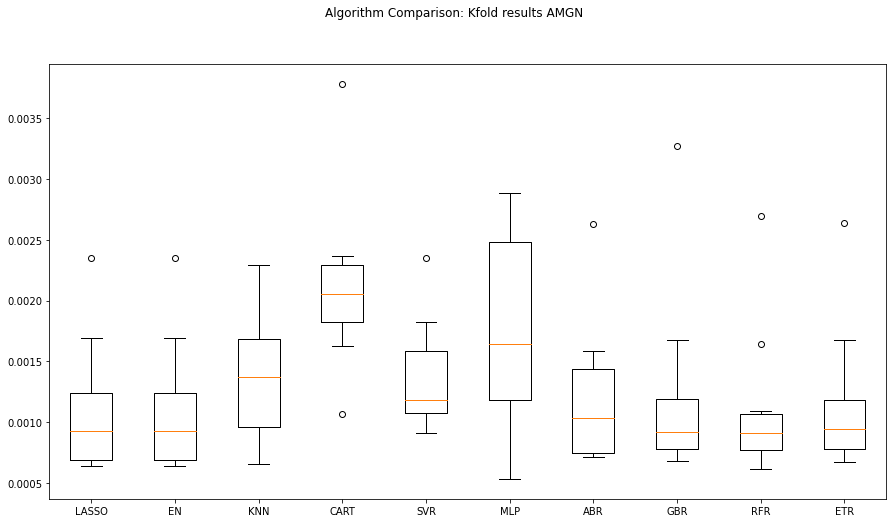

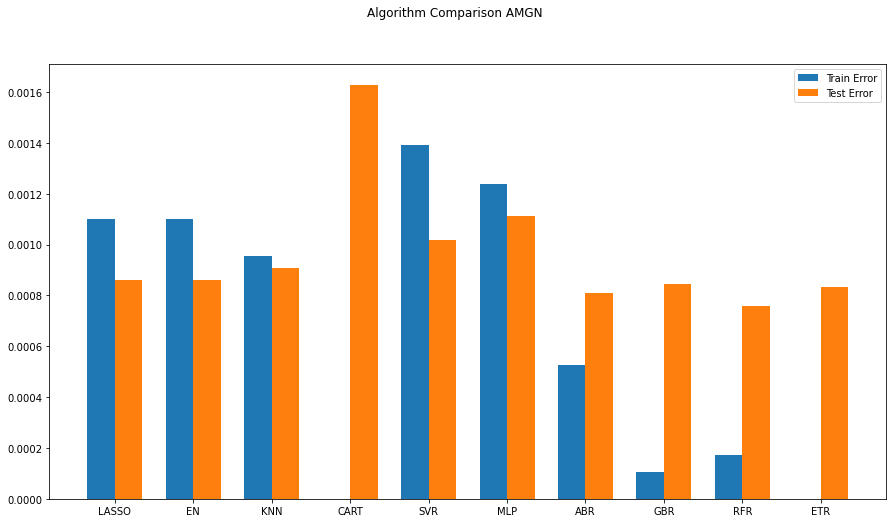

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0009199178409842437
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

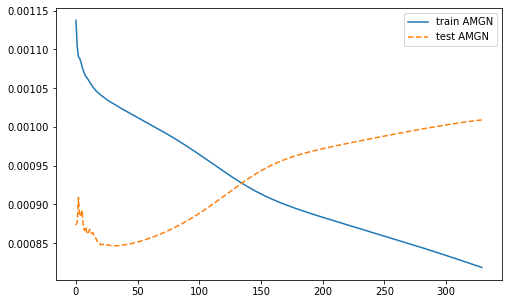

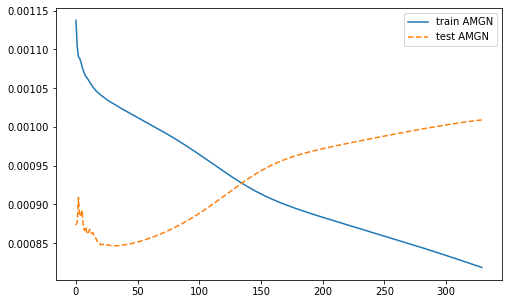

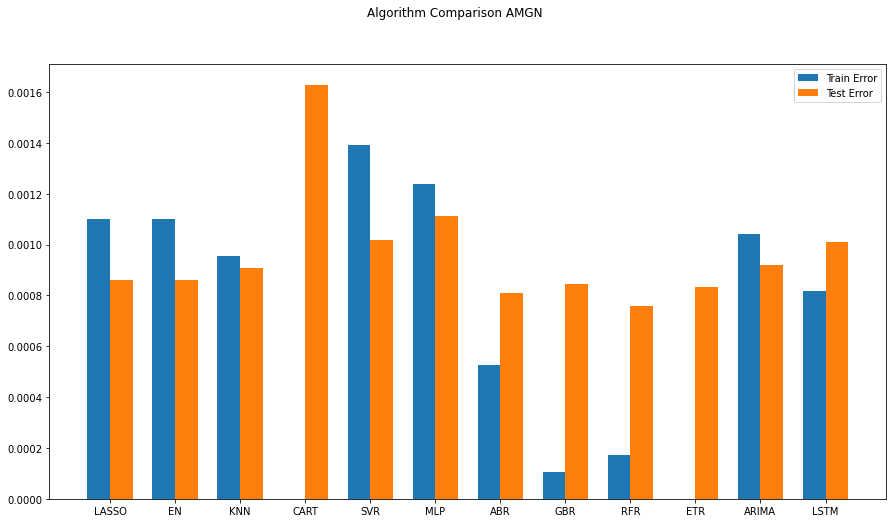

ARIMA(0, 0, 0) MSE=0.0010318
ARIMA(0, 0, 1) MSE=0.0010314
ARIMA(1, 0, 0) MSE=0.0010314
ARIMA(1, 0, 1) MSE=0.0010311
ARIMA(2, 0, 0) MSE=0.0010298
ARIMA(2, 0, 1) MSE=0.0010297
Best ARIMA(2, 0, 1) MSE=0.0010297
0.0009199178409842437


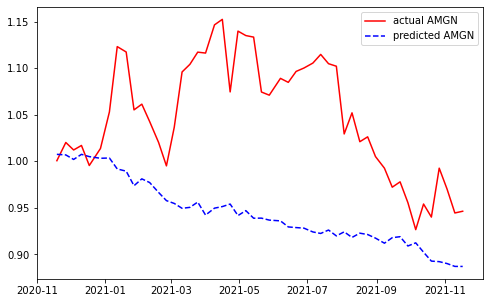

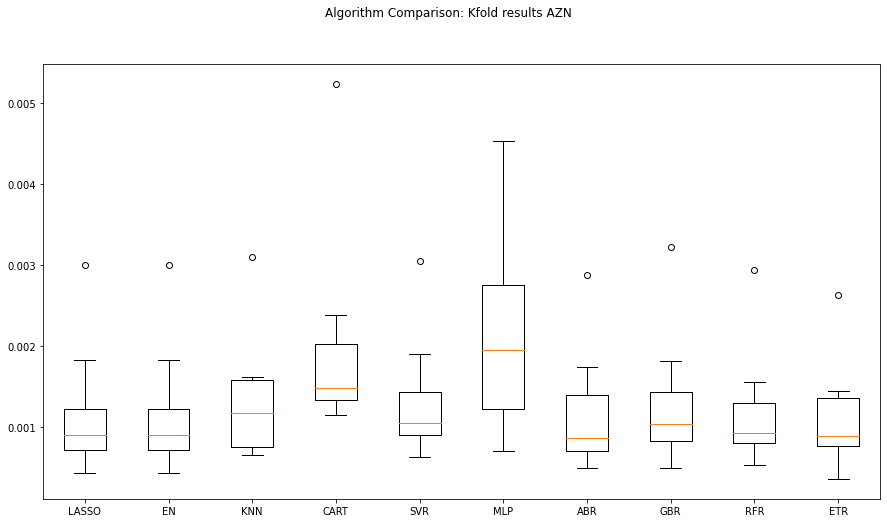

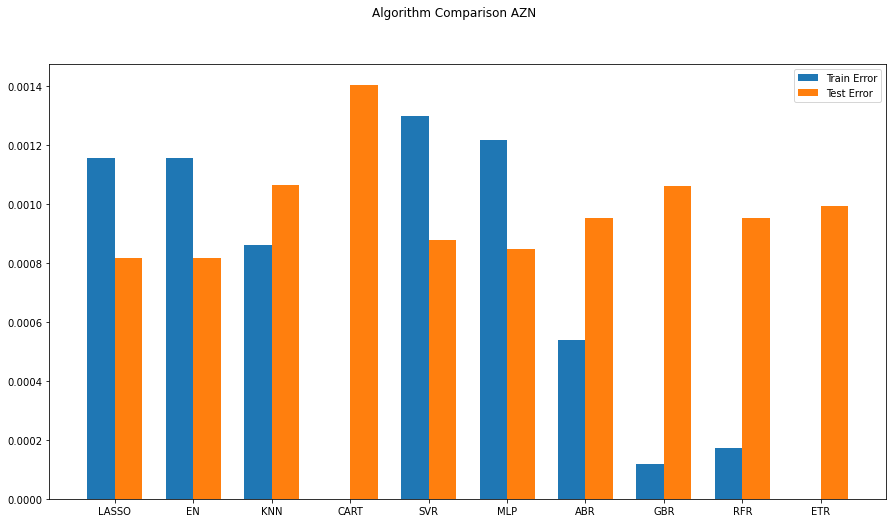

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.000790126473611329
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0

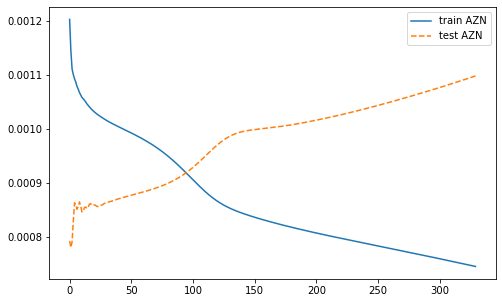

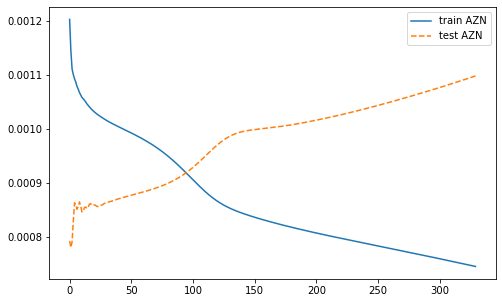

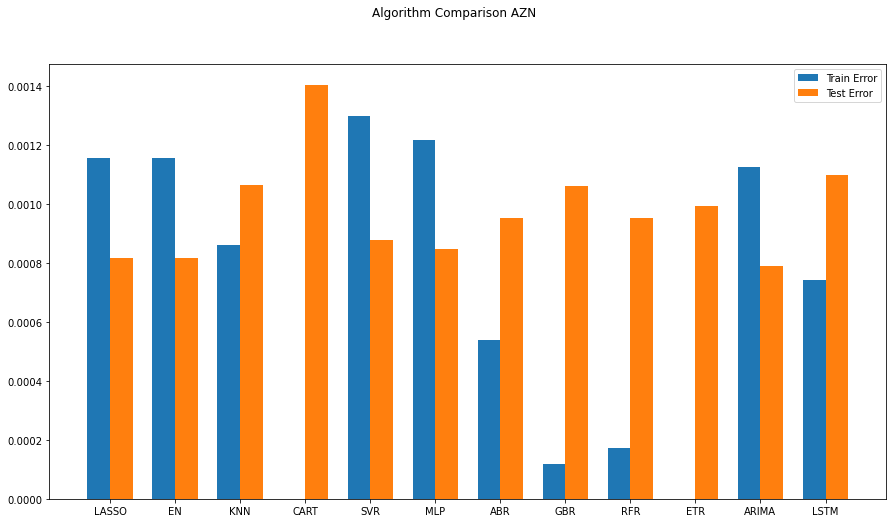

ARIMA(0, 0, 0) MSE=0.0010973
ARIMA(0, 0, 1) MSE=0.0010969
ARIMA(1, 0, 0) MSE=0.0010969
ARIMA(1, 0, 1) MSE=0.0010969
ARIMA(2, 0, 0) MSE=0.0010969
ARIMA(2, 0, 1) MSE=0.0010788
Best ARIMA(2, 0, 1) MSE=0.0010788
0.000790126473611329


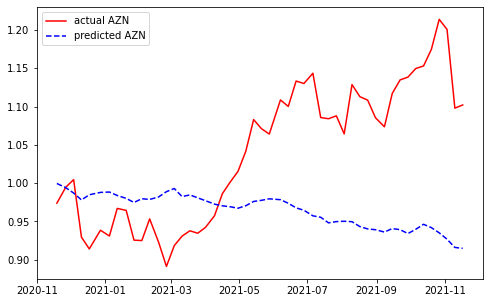

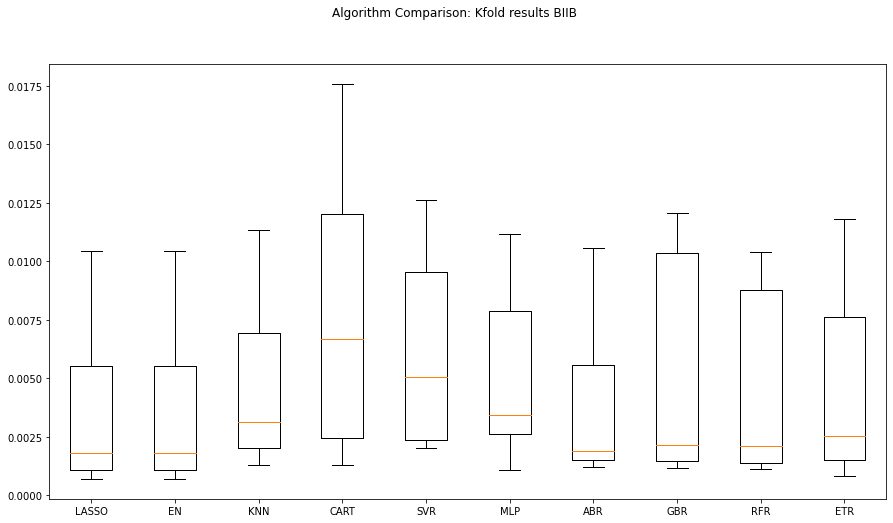

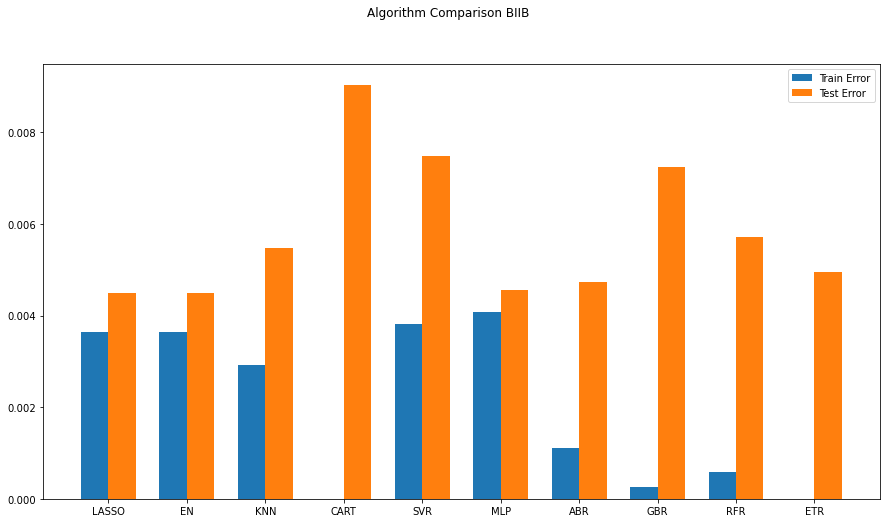

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.004352139606734173
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0

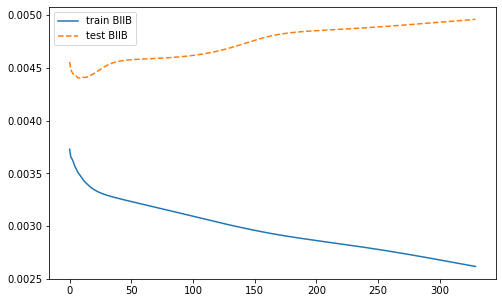

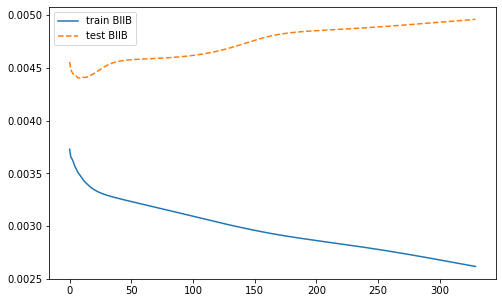

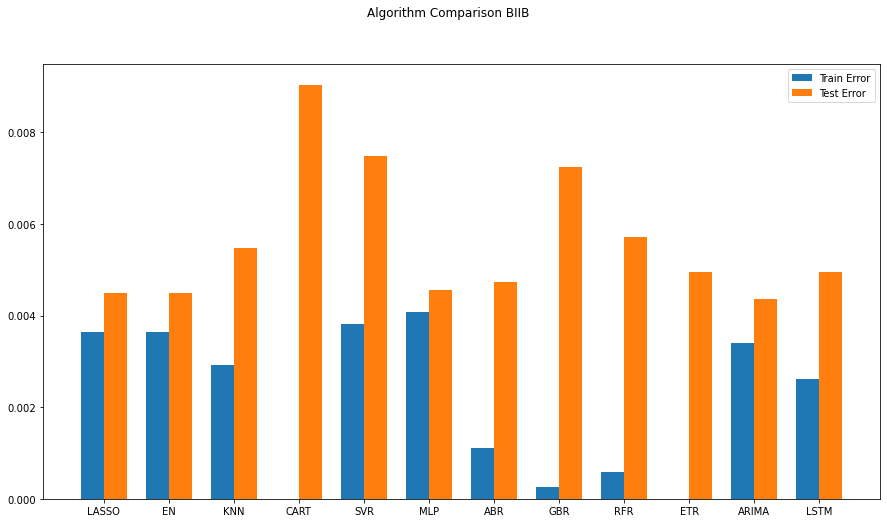

ARIMA(0, 0, 0) MSE=0.0035079
ARIMA(0, 0, 1) MSE=0.0033823
ARIMA(1, 0, 0) MSE=0.0034044
ARIMA(1, 0, 1) MSE=0.0033634
ARIMA(2, 0, 0) MSE=0.0033811
ARIMA(2, 0, 1) MSE=0.0033634
Best ARIMA(2, 0, 1) MSE=0.0033634
0.004352139606734173


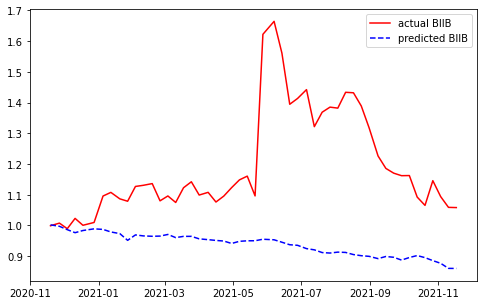

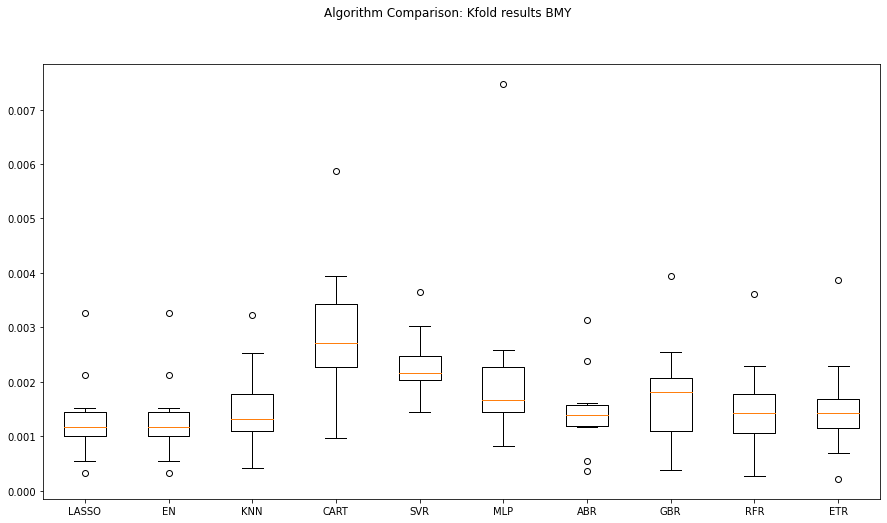

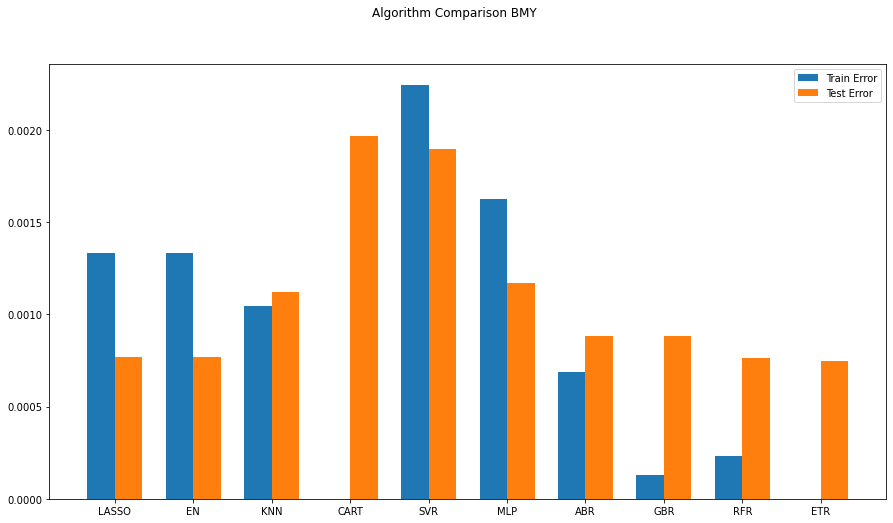

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0008096529342601318
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

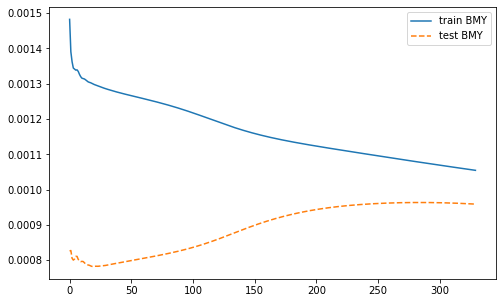

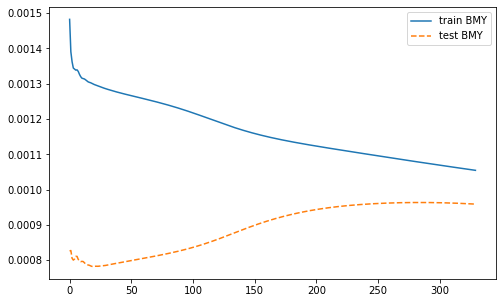

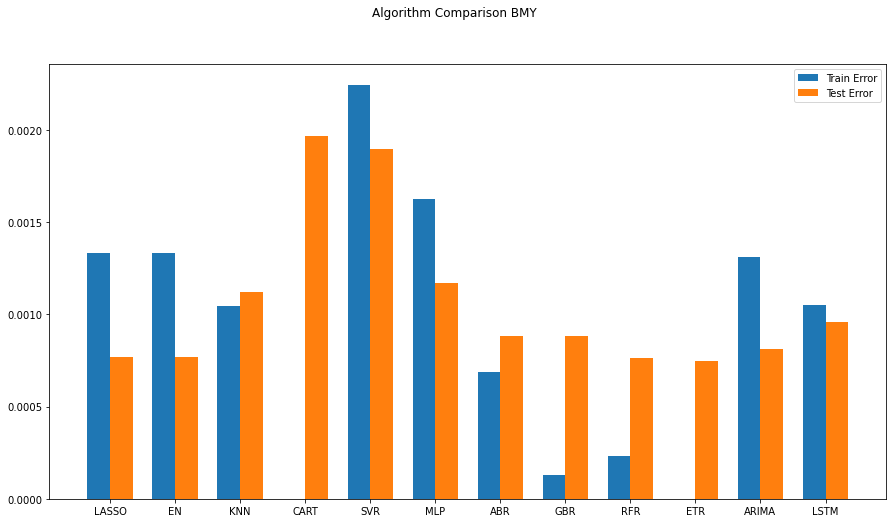

ARIMA(0, 0, 0) MSE=0.0013167
ARIMA(0, 0, 1) MSE=0.0013116
ARIMA(1, 0, 0) MSE=0.0013116
ARIMA(1, 0, 1) MSE=0.0013116
ARIMA(2, 0, 0) MSE=0.0013116
ARIMA(2, 0, 1) MSE=0.0012465
Best ARIMA(2, 0, 1) MSE=0.0012465
0.0008096529342601318


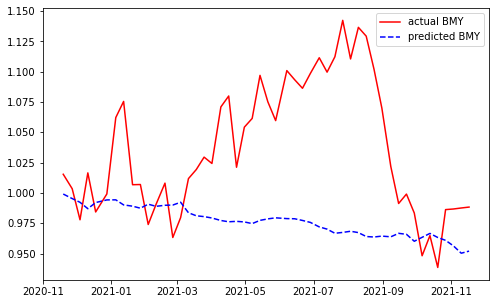

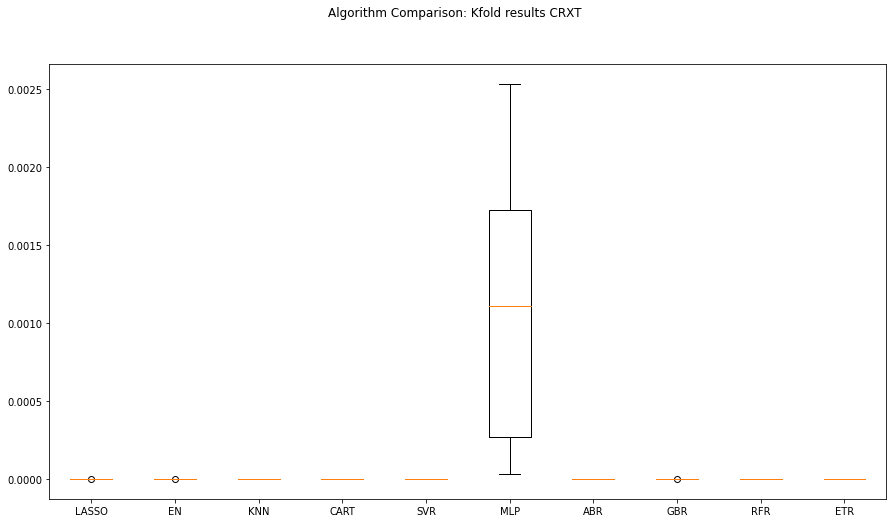

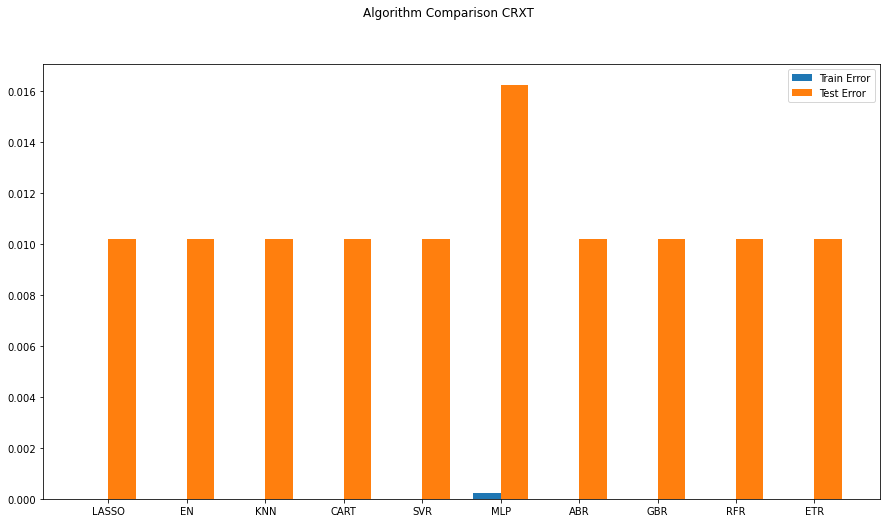

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.010181286984417021
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0

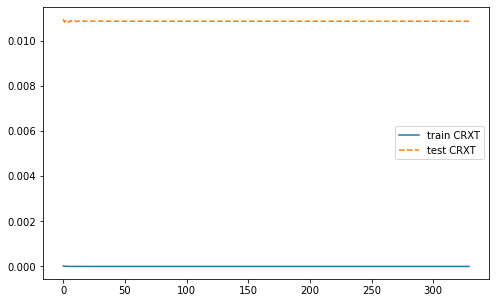

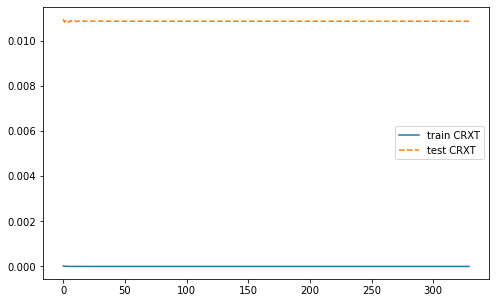

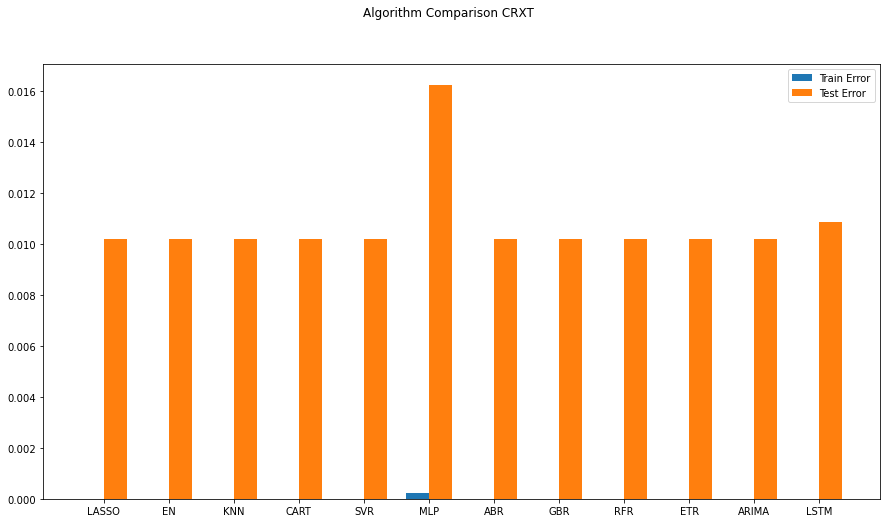

ARIMA(0, 0, 0) MSE=0.0000000
ARIMA(0, 0, 1) MSE=0.0000000
ARIMA(1, 0, 0) MSE=0.0000000
ARIMA(2, 0, 0) MSE=0.0000000
ARIMA(2, 0, 1) MSE=0.0000000
Best ARIMA(2, 0, 1) MSE=0.0000000
0.010181286984417021


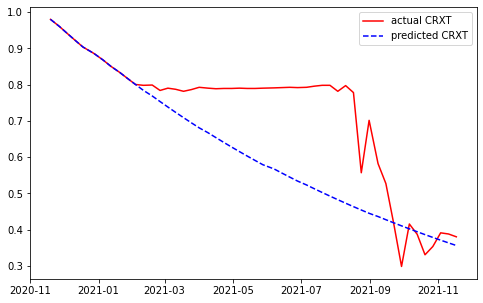

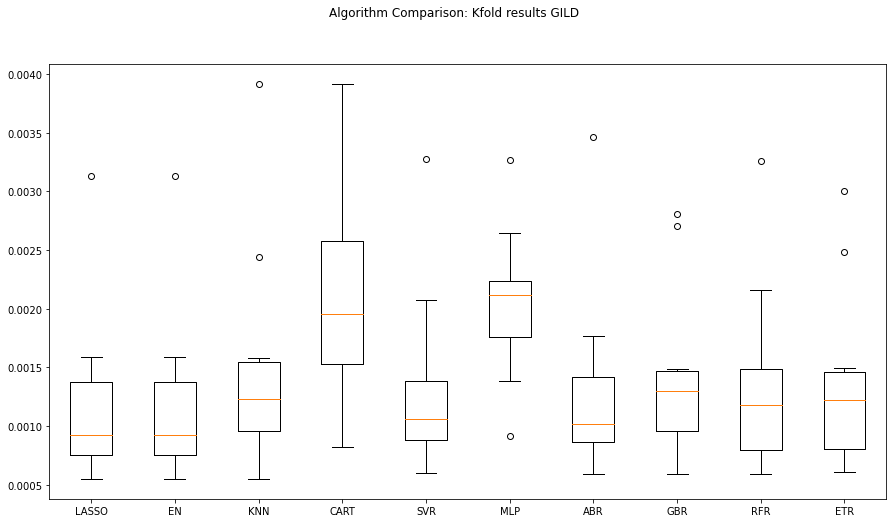

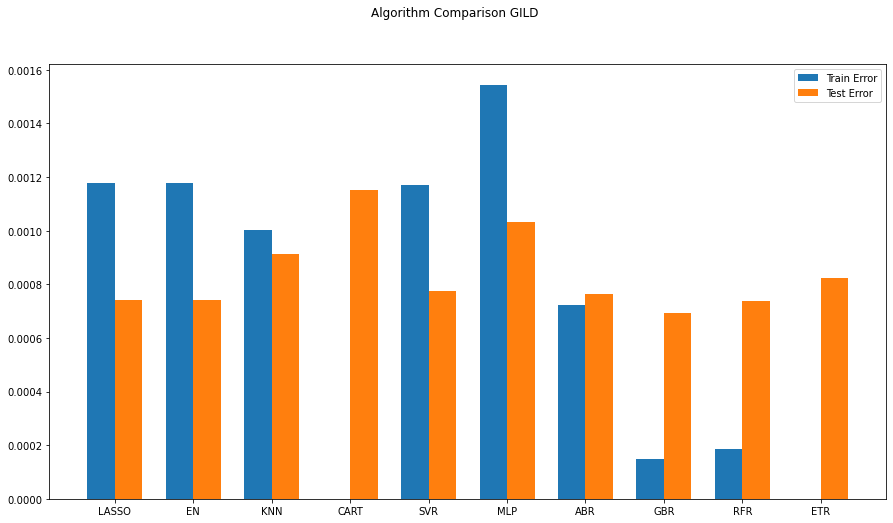

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0008518956253153268
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

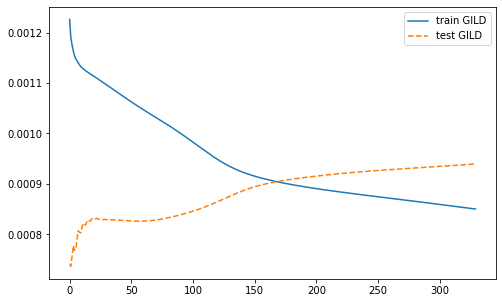

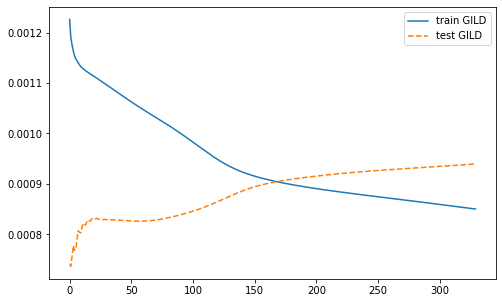

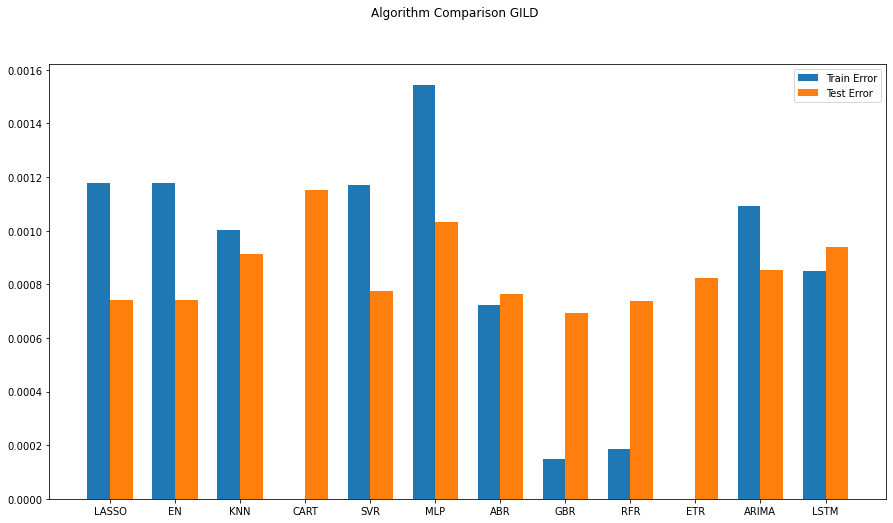

ARIMA(0, 0, 0) MSE=0.0011157
ARIMA(0, 0, 1) MSE=0.0010929
ARIMA(1, 0, 0) MSE=0.0010928
ARIMA(1, 0, 1) MSE=0.0010878
ARIMA(2, 0, 0) MSE=0.0010927
ARIMA(2, 0, 1) MSE=0.0010861
Best ARIMA(2, 0, 1) MSE=0.0010861
0.0008518956253153268


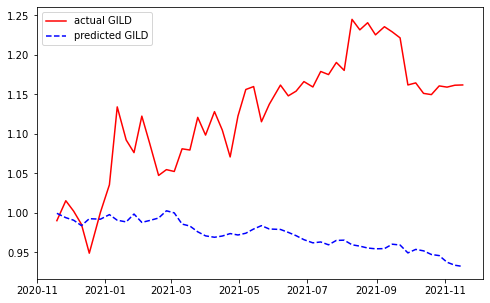

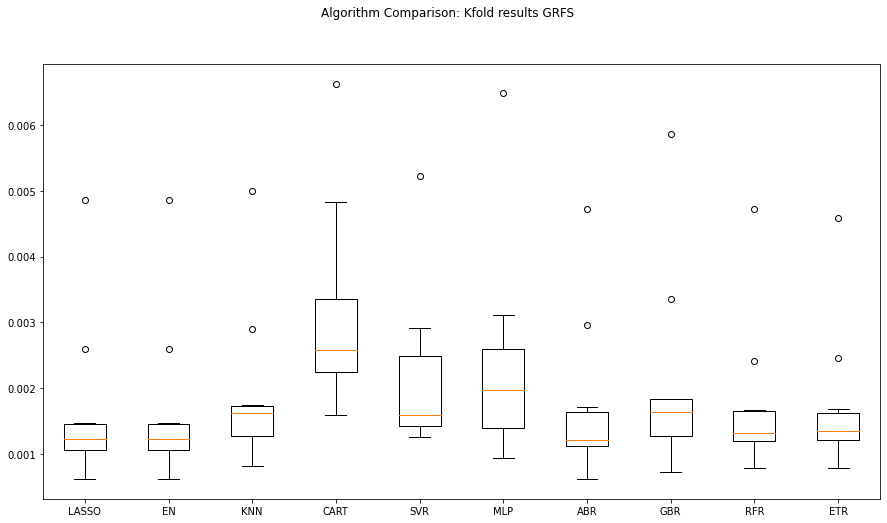

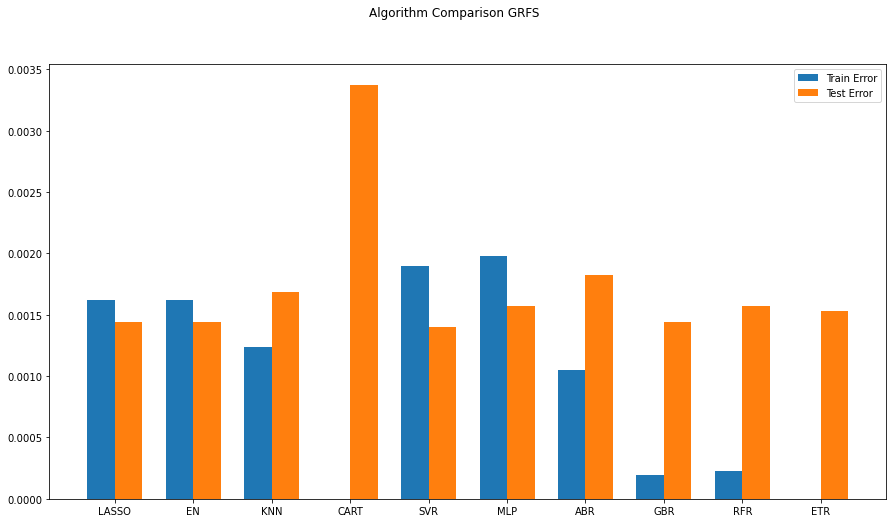

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.001371016252380287
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0

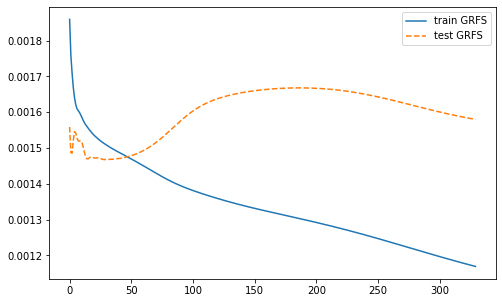

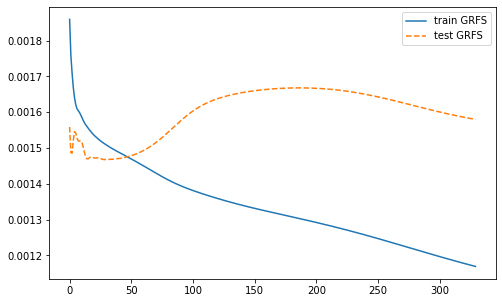

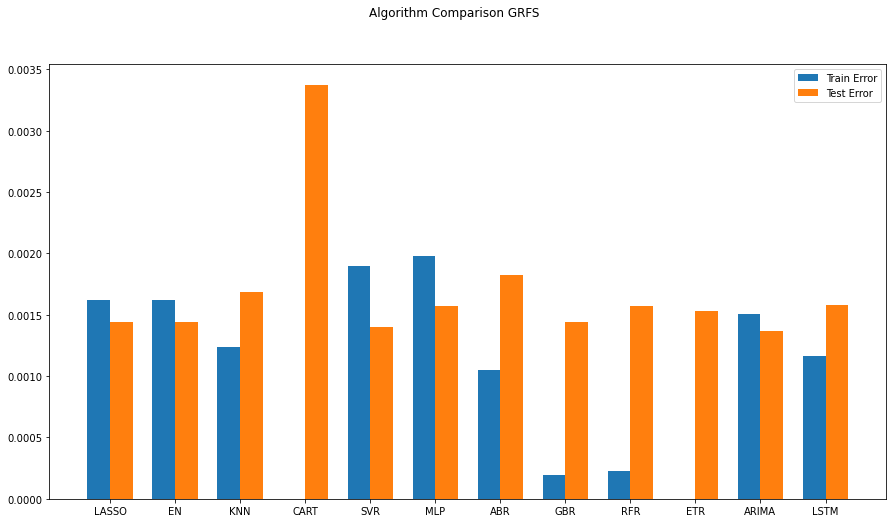

ARIMA(0, 0, 0) MSE=0.0015001
ARIMA(0, 0, 1) MSE=0.0015001
ARIMA(1, 0, 0) MSE=0.0015001
ARIMA(1, 0, 1) MSE=0.0014928
ARIMA(2, 0, 0) MSE=0.0014907
ARIMA(2, 0, 1) MSE=0.0014850
Best ARIMA(2, 0, 1) MSE=0.0014850
0.001371016252380287


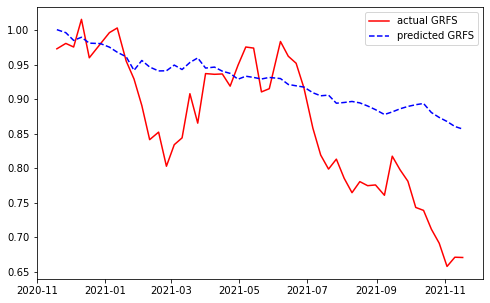

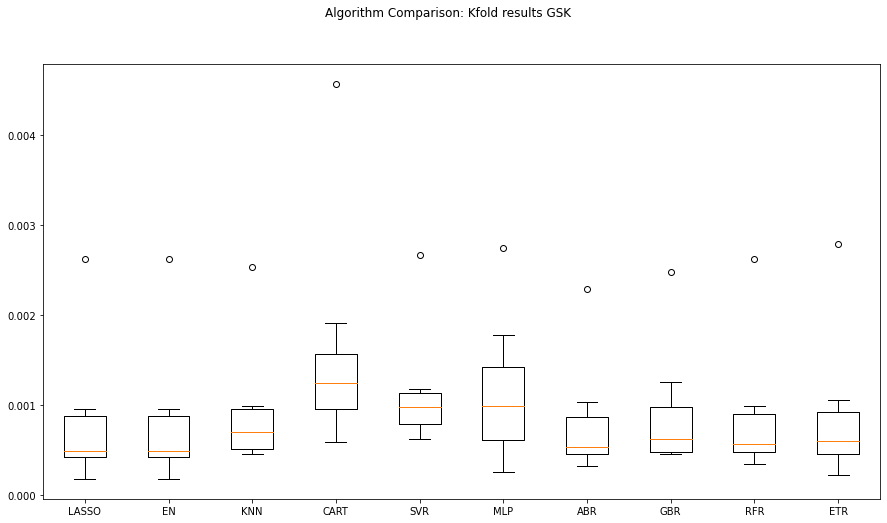

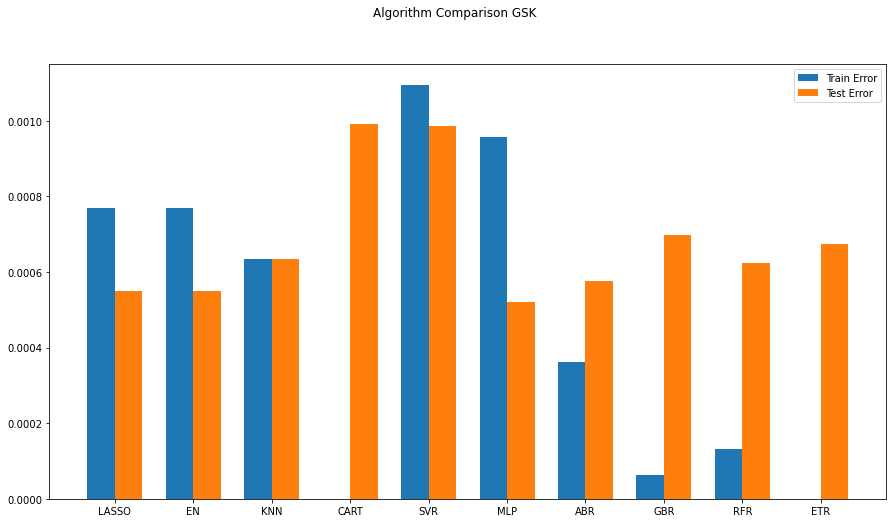

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0005692334915088034
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

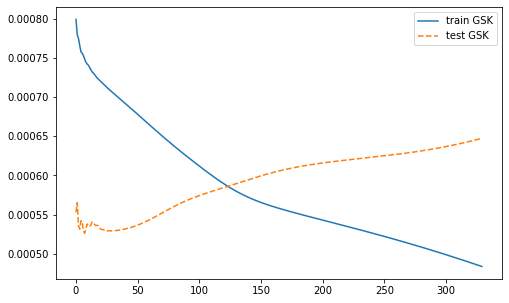

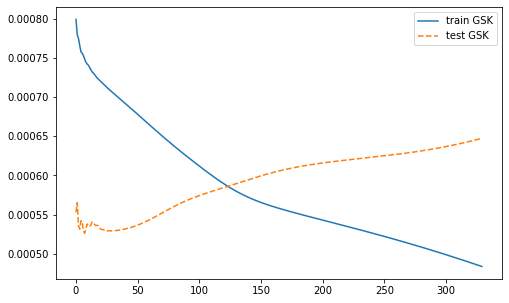

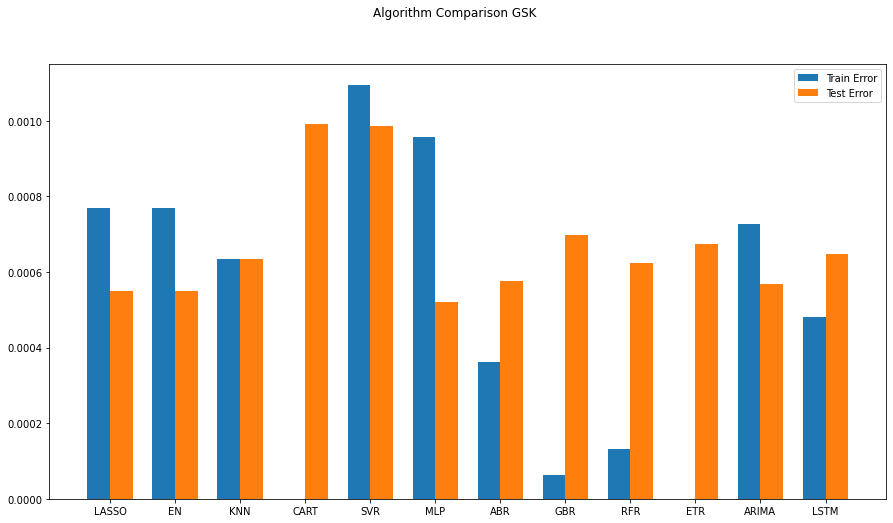

ARIMA(0, 0, 0) MSE=0.0007291
ARIMA(0, 0, 1) MSE=0.0007194
ARIMA(1, 0, 0) MSE=0.0007235
ARIMA(1, 0, 1) MSE=0.0006834
ARIMA(2, 0, 0) MSE=0.0007087
ARIMA(2, 0, 1) MSE=0.0006862
Best ARIMA(1, 0, 1) MSE=0.0006834
0.0005692334915088034


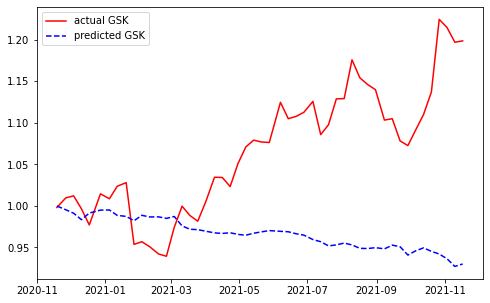

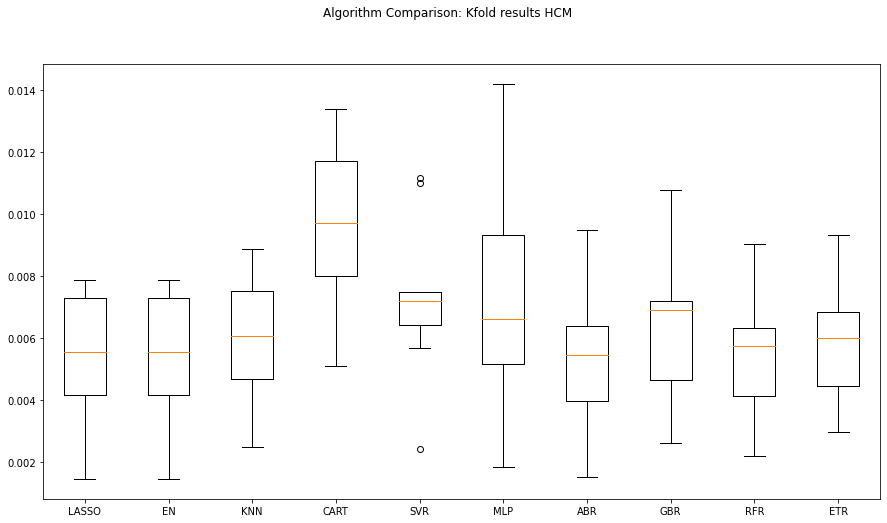

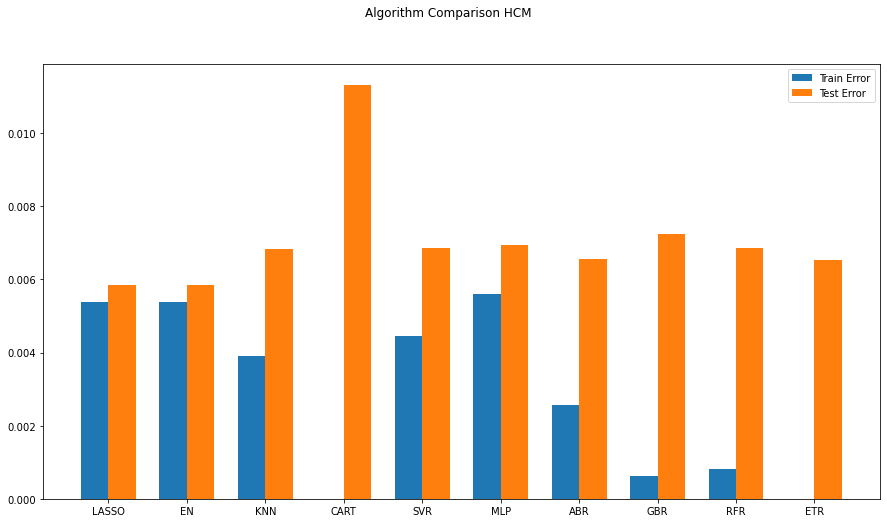

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.005671549247764362
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0

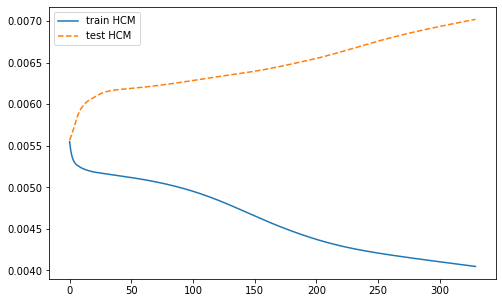

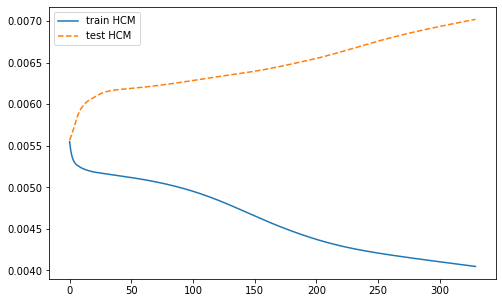

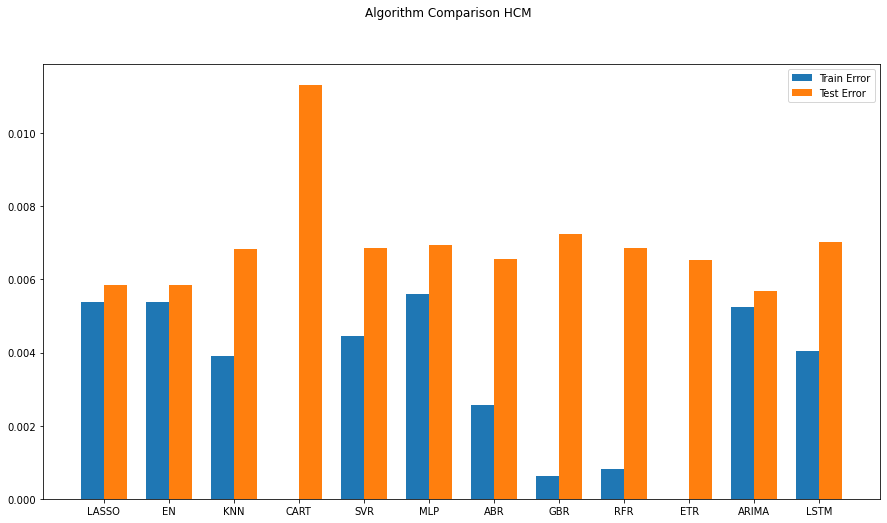

ARIMA(0, 0, 0) MSE=0.0052420
ARIMA(0, 0, 1) MSE=0.0052394
ARIMA(1, 0, 0) MSE=0.0052397
ARIMA(1, 0, 1) MSE=0.0052258
ARIMA(2, 0, 0) MSE=0.0052254
ARIMA(2, 0, 1) MSE=0.0051764
Best ARIMA(2, 0, 1) MSE=0.0051764
0.005671549247764362


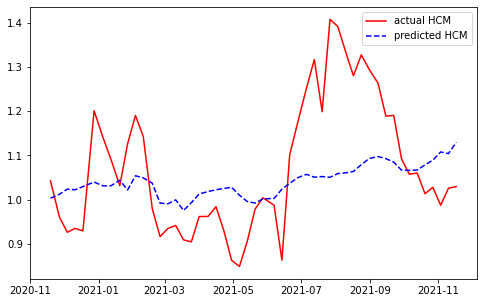

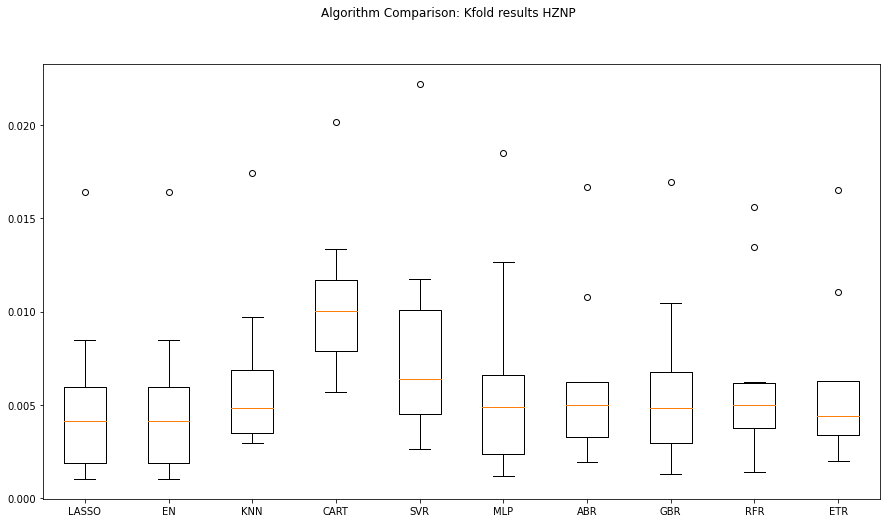

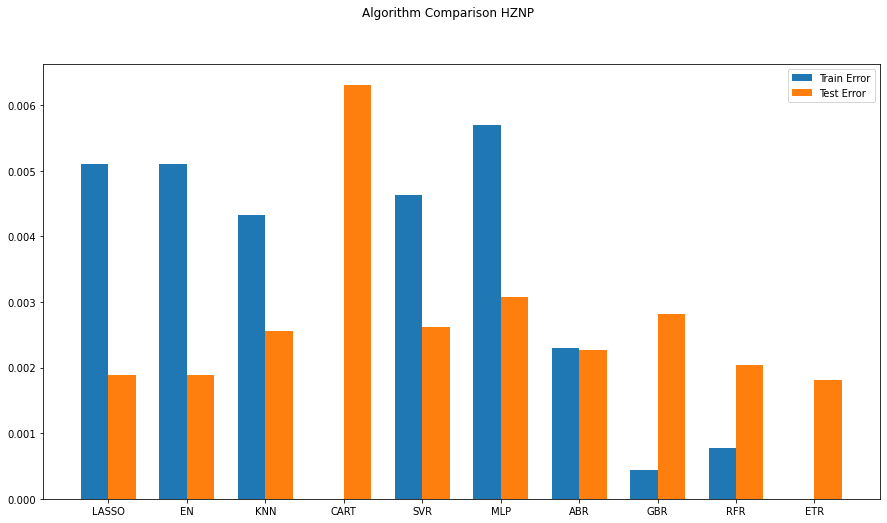

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0019717197902401136
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

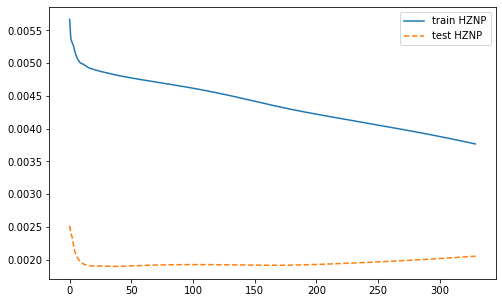

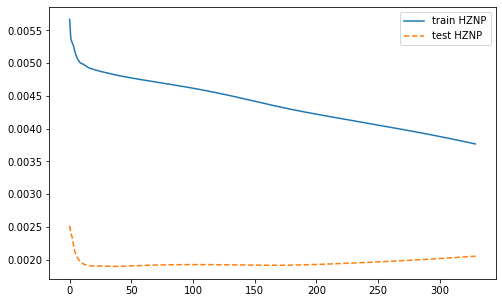

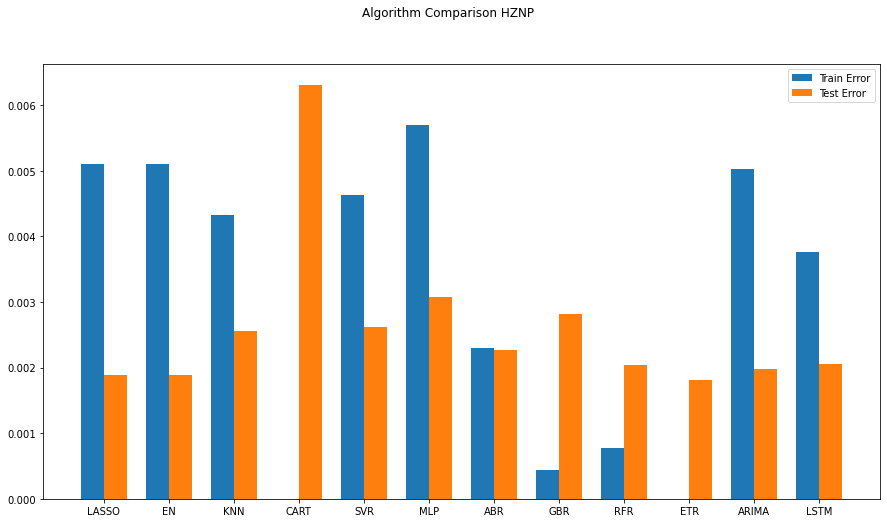

ARIMA(0, 0, 0) MSE=0.0050864
ARIMA(0, 0, 1) MSE=0.0049799
ARIMA(1, 0, 0) MSE=0.0049695
ARIMA(1, 0, 1) MSE=0.0049657
ARIMA(2, 0, 0) MSE=0.0049647
ARIMA(2, 0, 1) MSE=0.0049628
Best ARIMA(2, 0, 1) MSE=0.0049628
0.0019717197902401136


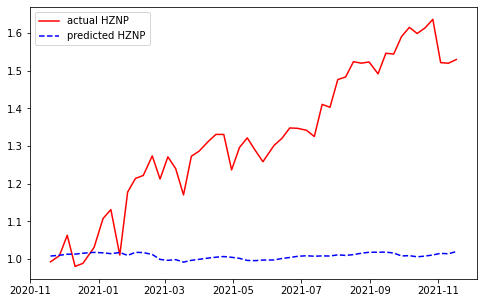

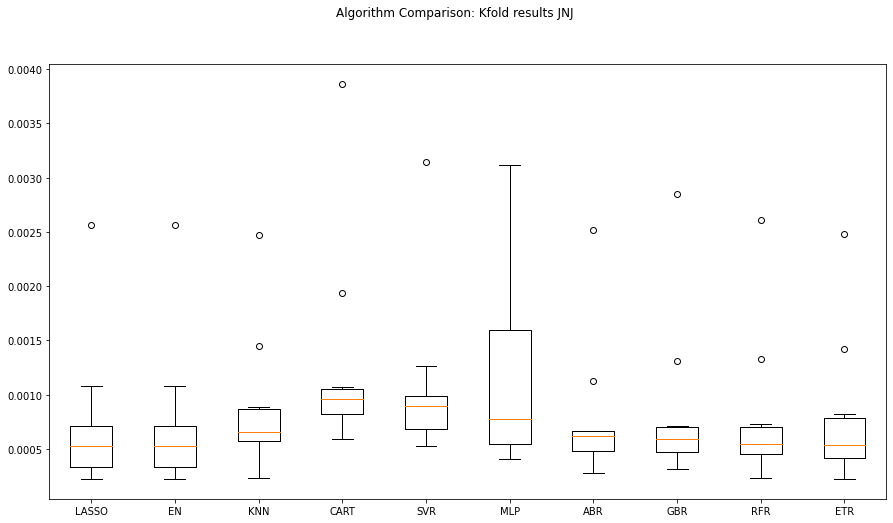

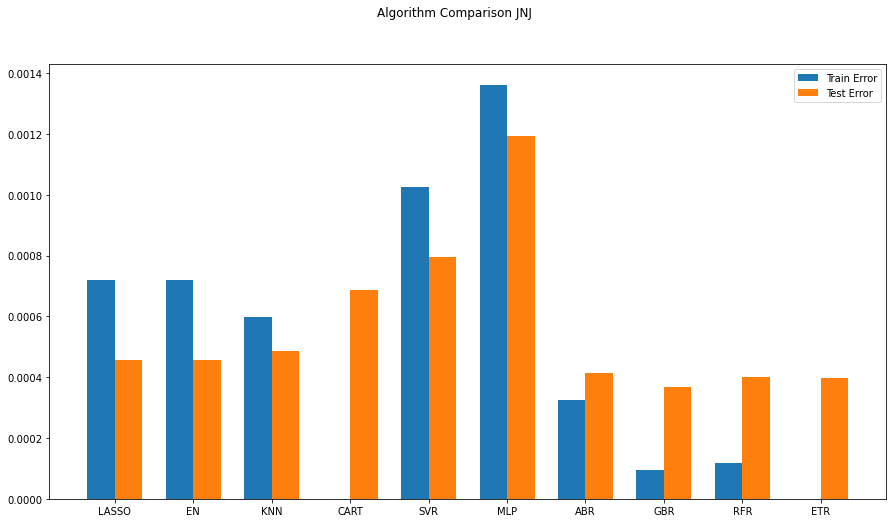

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.00048314645509862784
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ...

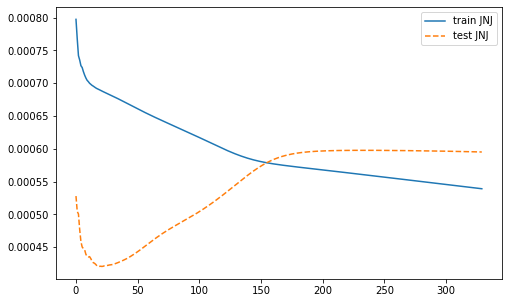

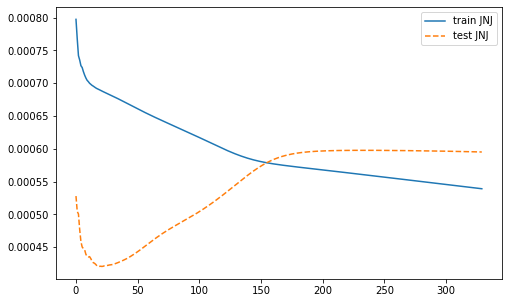

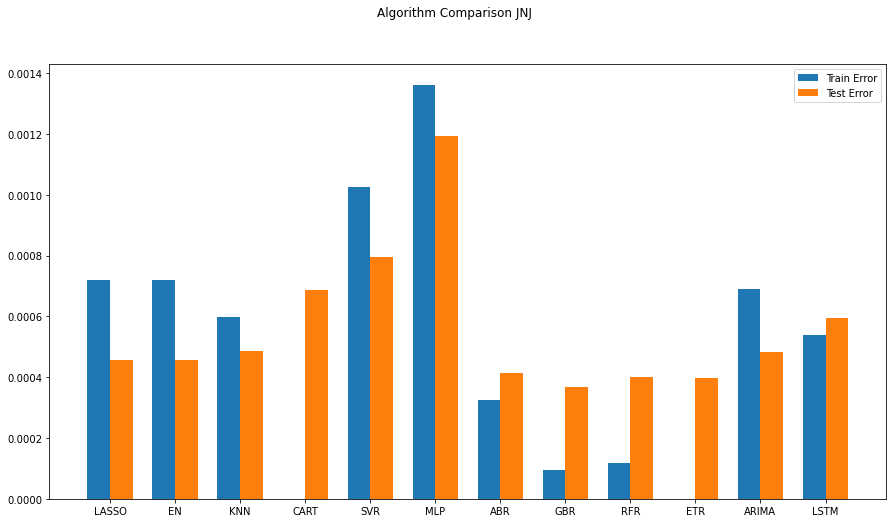

ARIMA(0, 0, 0) MSE=0.0006881
ARIMA(0, 0, 1) MSE=0.0006869
ARIMA(1, 0, 0) MSE=0.0006871
ARIMA(1, 0, 1) MSE=0.0006834
ARIMA(2, 0, 0) MSE=0.0006841
ARIMA(2, 0, 1) MSE=0.0006822
Best ARIMA(2, 0, 1) MSE=0.0006822
0.00048314645509862784


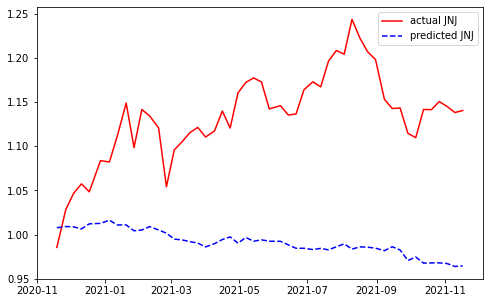

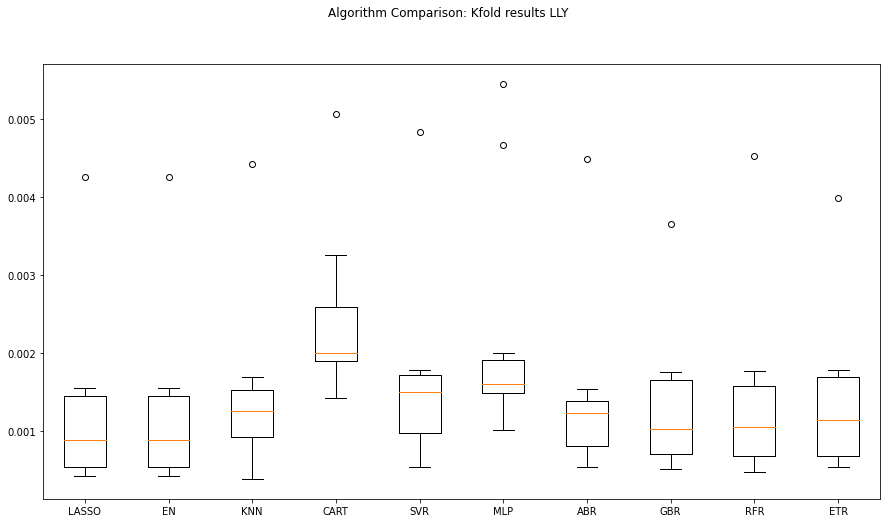

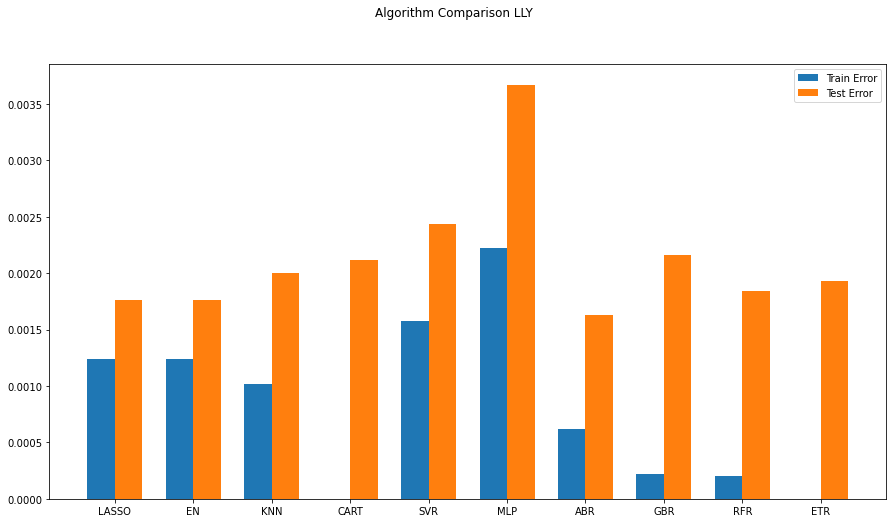

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.00185140630434231
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0.

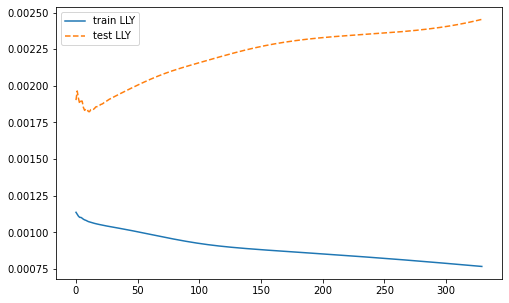

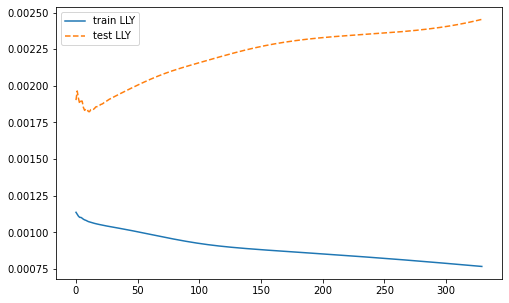

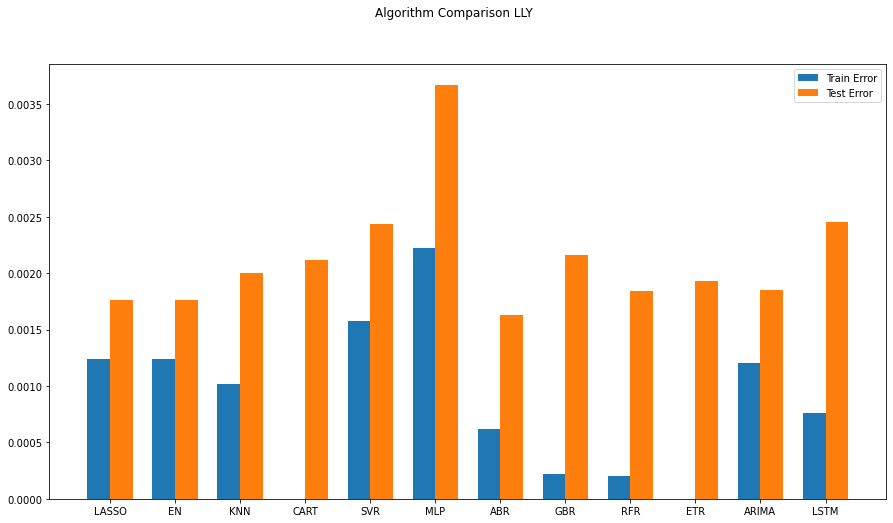

ARIMA(0, 0, 0) MSE=0.0012025
ARIMA(0, 0, 1) MSE=0.0011748
ARIMA(1, 0, 0) MSE=0.0011749
ARIMA(1, 0, 1) MSE=0.0011744
ARIMA(2, 0, 0) MSE=0.0011738
ARIMA(2, 0, 1) MSE=0.0011702
Best ARIMA(2, 0, 1) MSE=0.0011702
0.00185140630434231


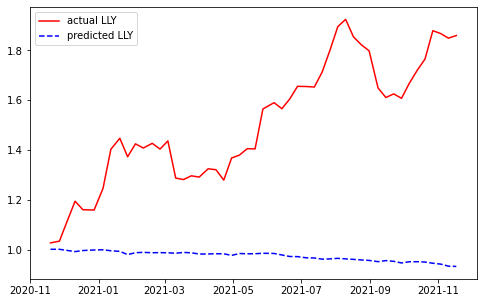

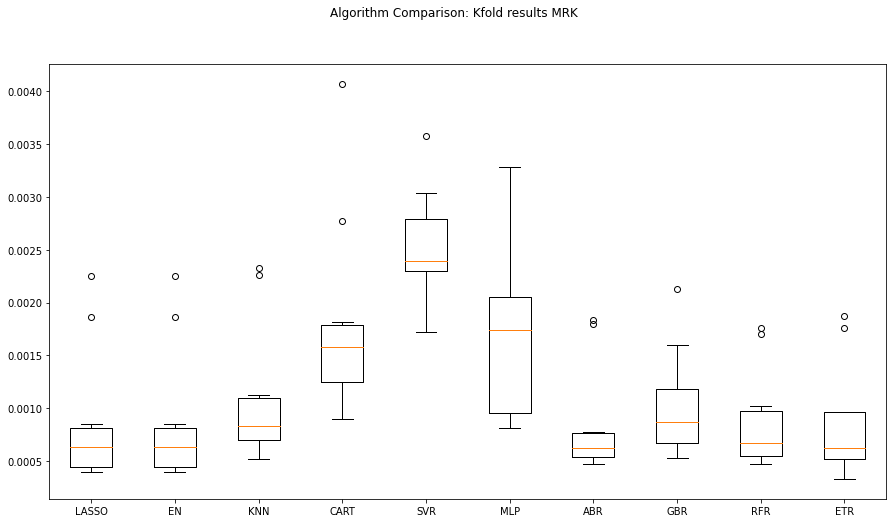

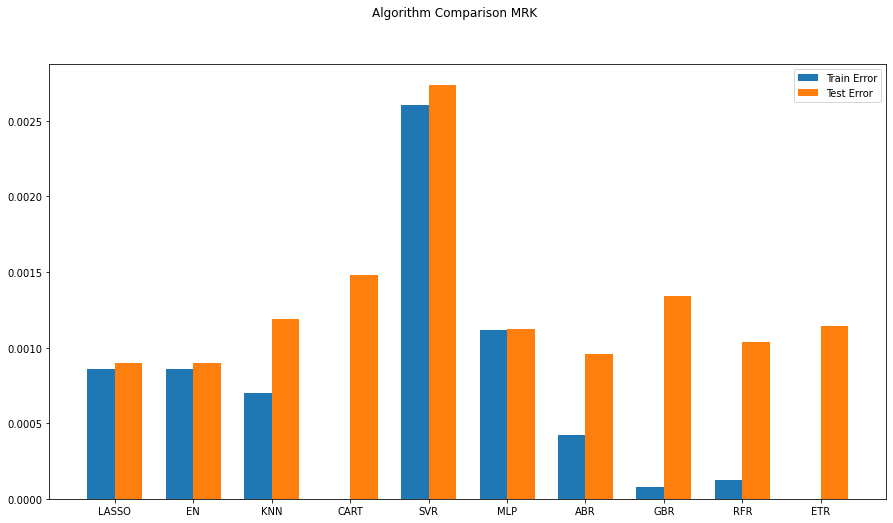

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0010140247305813774
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

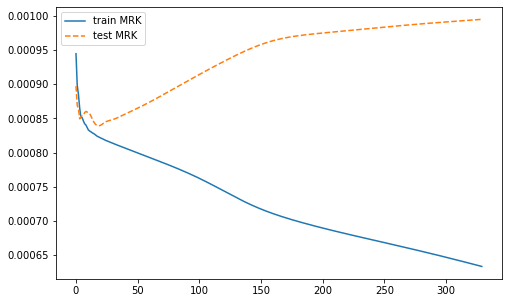

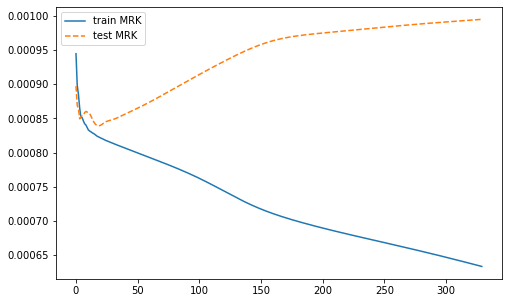

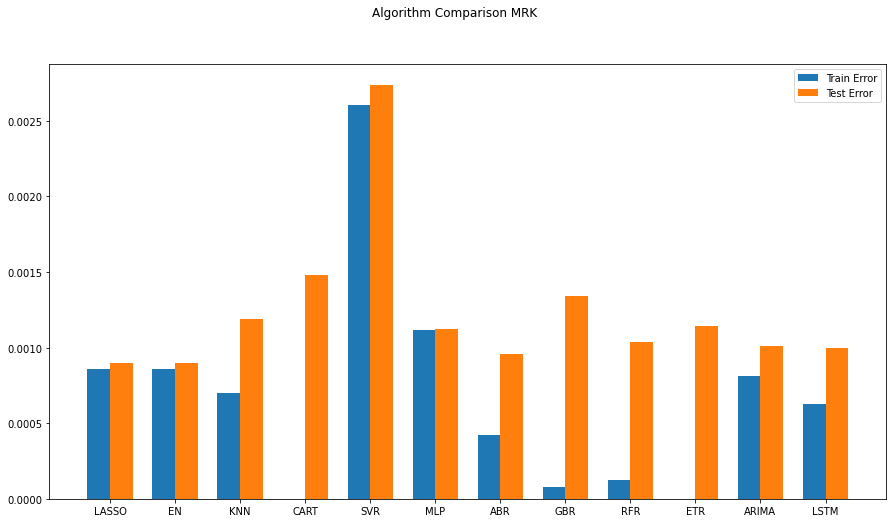

ARIMA(0, 0, 0) MSE=0.0008250
ARIMA(0, 0, 1) MSE=0.0008115
ARIMA(1, 0, 0) MSE=0.0008104
ARIMA(1, 0, 1) MSE=0.0008098
ARIMA(2, 0, 0) MSE=0.0008098
ARIMA(2, 0, 1) MSE=0.0008097
Best ARIMA(2, 0, 1) MSE=0.0008097
0.0010140247305813774


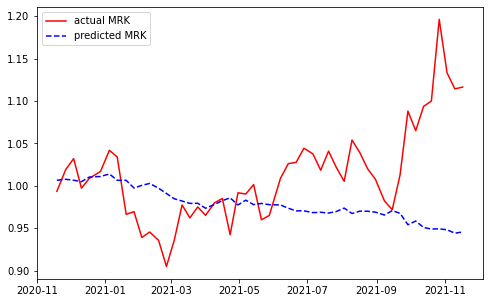

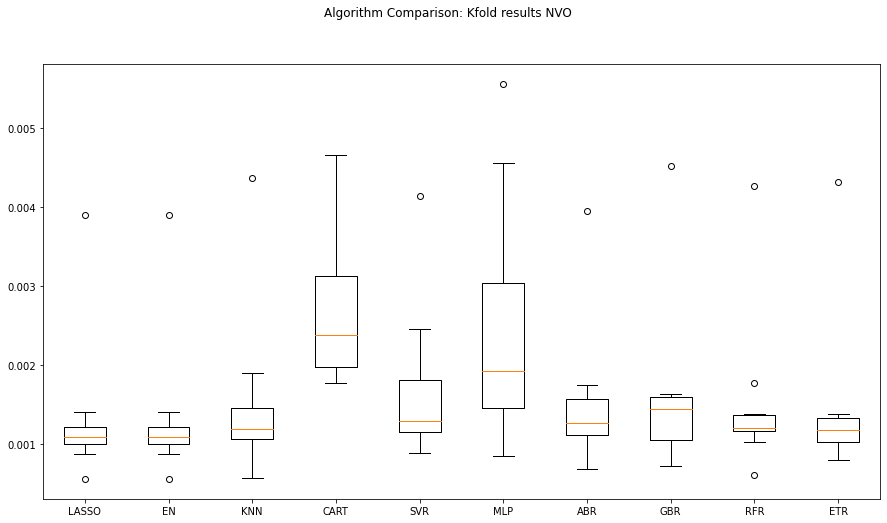

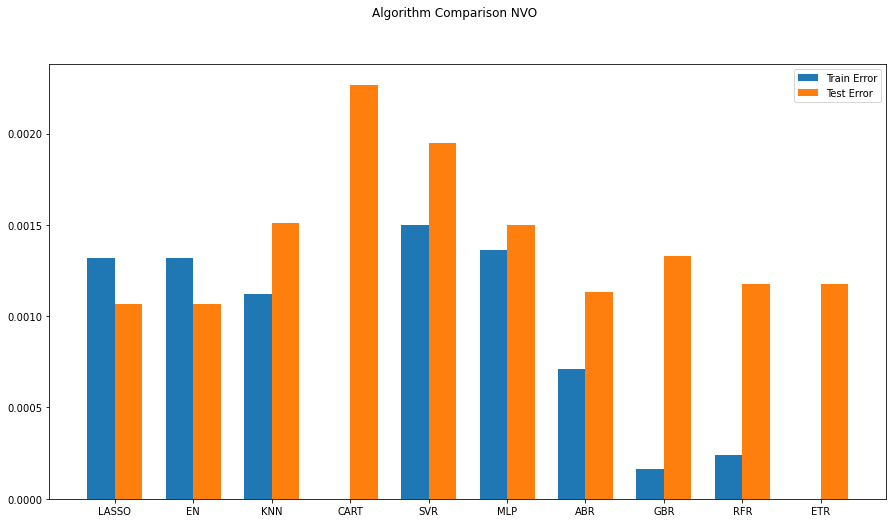

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0012595896413668776
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

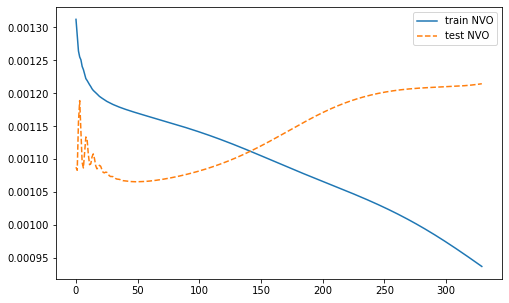

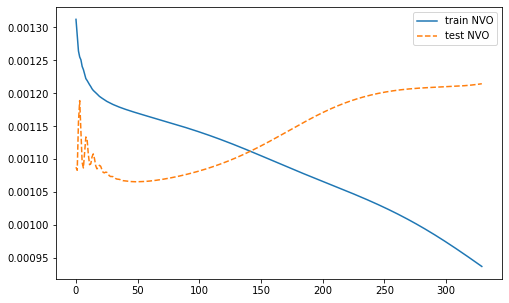

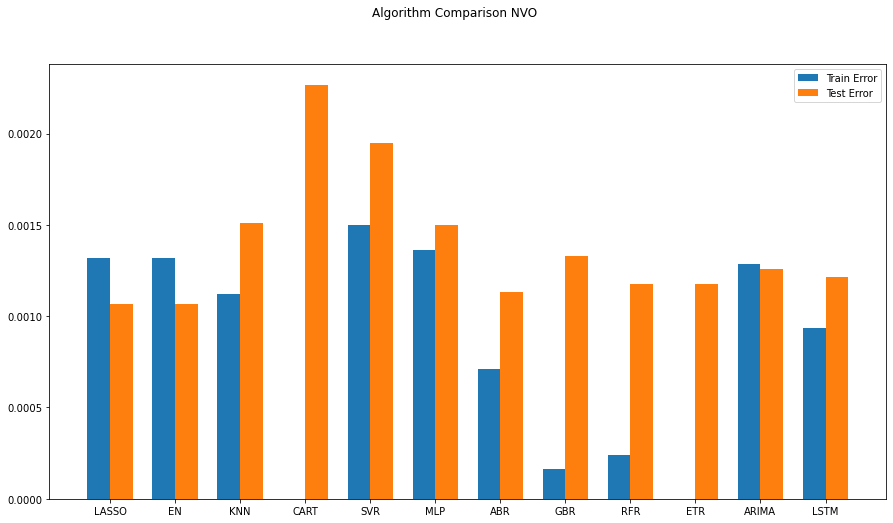

ARIMA(0, 0, 0) MSE=0.0012612
ARIMA(0, 0, 1) MSE=0.0012549
ARIMA(1, 0, 0) MSE=0.0012568
ARIMA(1, 0, 1) MSE=0.0012364
ARIMA(2, 0, 0) MSE=0.0012347
ARIMA(2, 0, 1) MSE=0.0012328
Best ARIMA(2, 0, 1) MSE=0.0012328
0.0012595896413668776


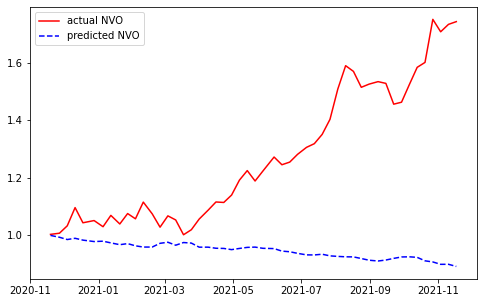

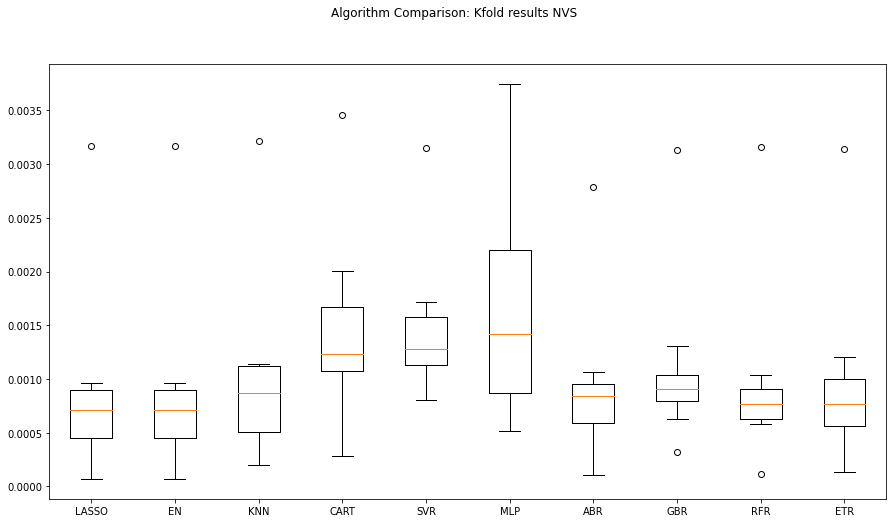

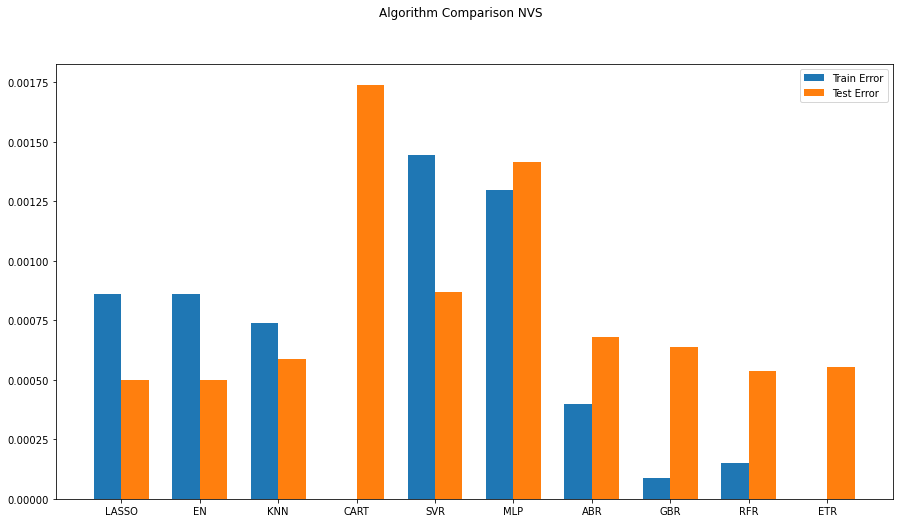

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0005043413263233617
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

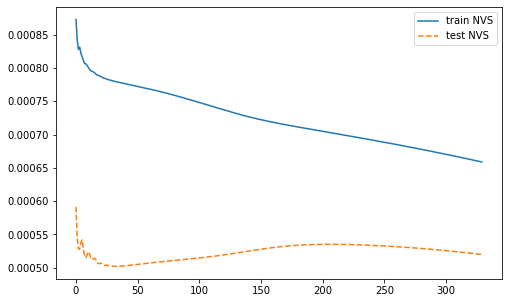

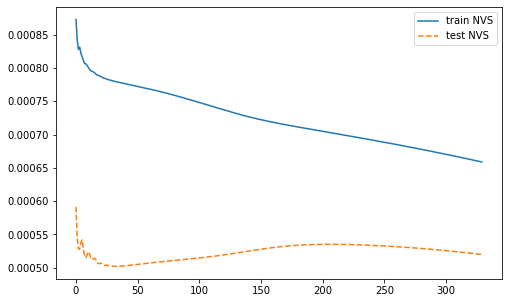

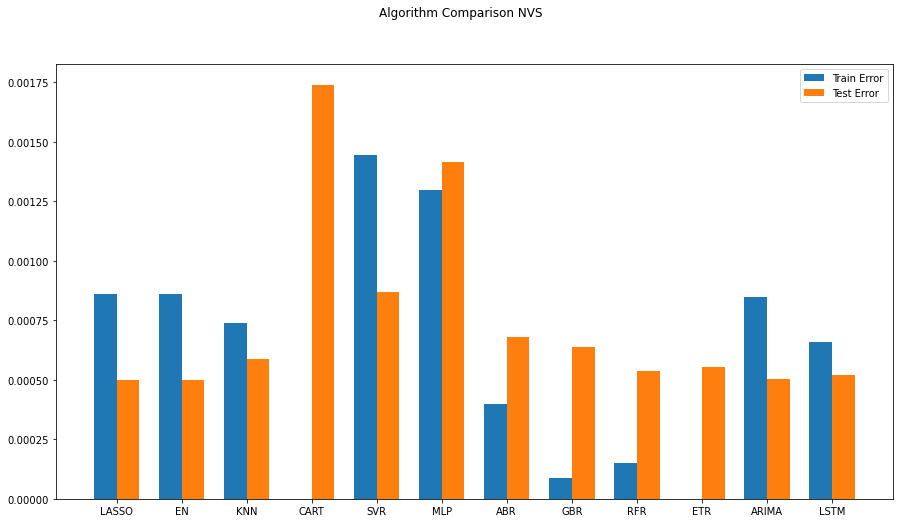

ARIMA(0, 0, 0) MSE=0.0008452
ARIMA(0, 0, 1) MSE=0.0008346
ARIMA(1, 0, 0) MSE=0.0008377
ARIMA(1, 0, 1) MSE=0.0008122
ARIMA(2, 0, 0) MSE=0.0008241
ARIMA(2, 0, 1) MSE=0.0008079
Best ARIMA(2, 0, 1) MSE=0.0008079
0.0005043413263233617


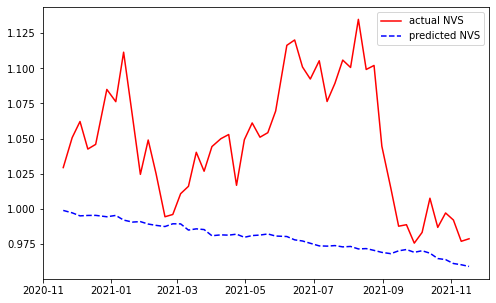

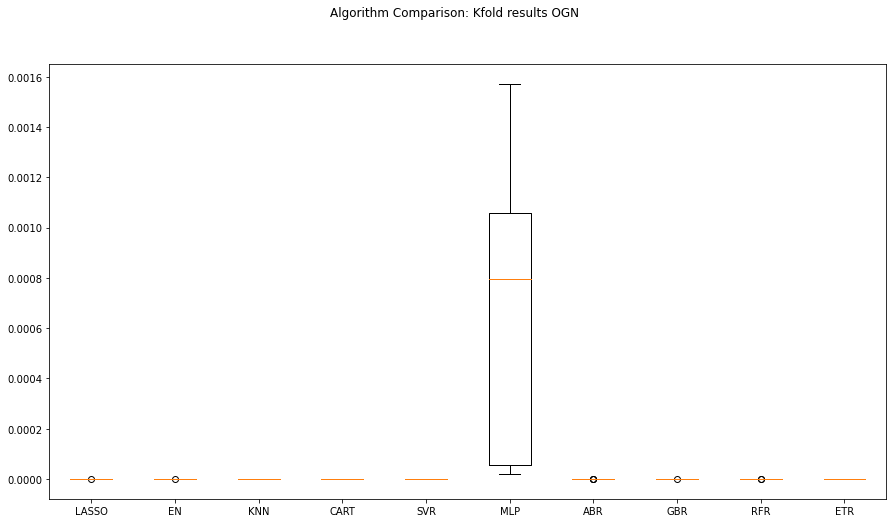

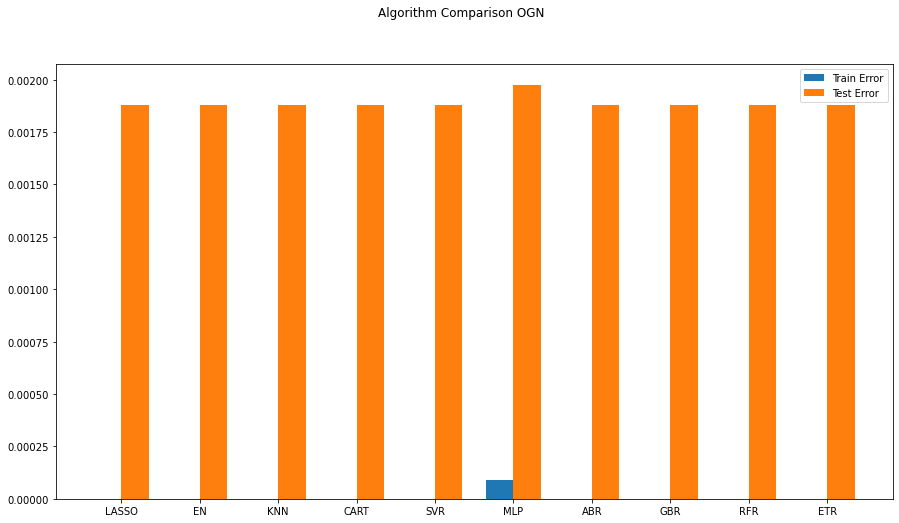

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0018776859398139574
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

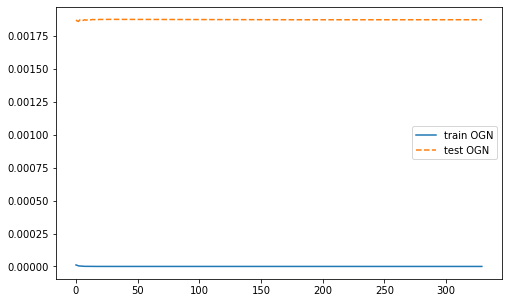

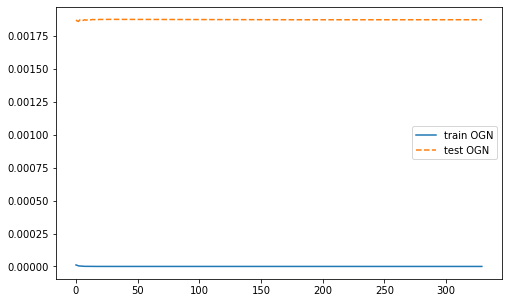

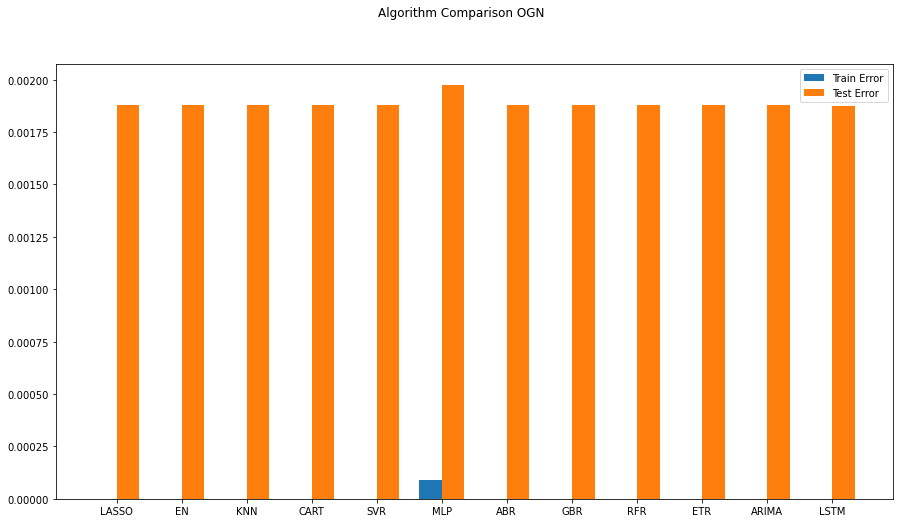

ARIMA(0, 0, 0) MSE=0.0000000
ARIMA(0, 0, 1) MSE=0.0000000
ARIMA(1, 0, 0) MSE=0.0000000
ARIMA(2, 0, 0) MSE=0.0000000
ARIMA(2, 0, 1) MSE=0.0000000
Best ARIMA(2, 0, 1) MSE=0.0000000
0.0018776859398139574


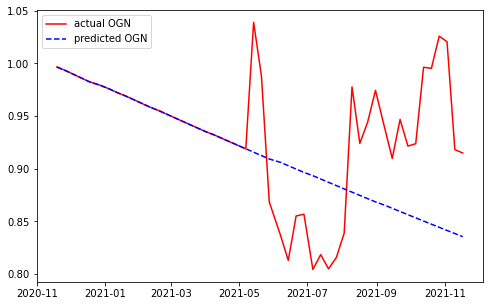

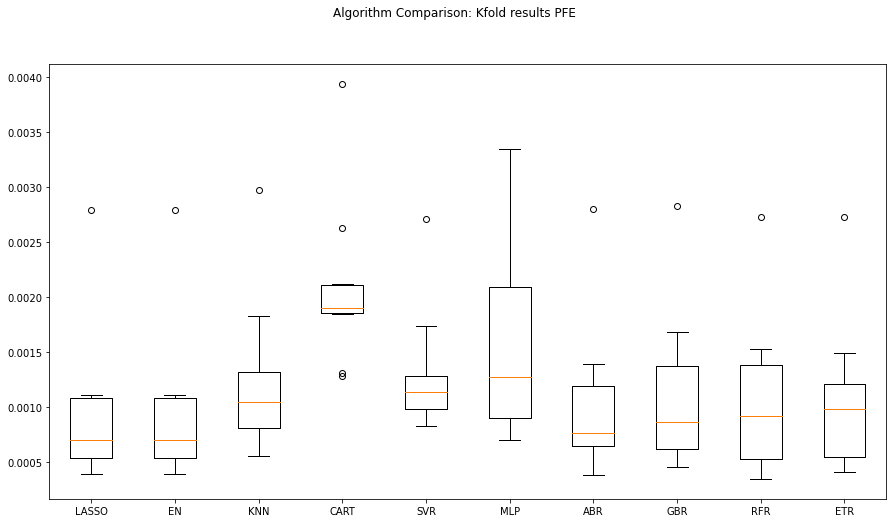

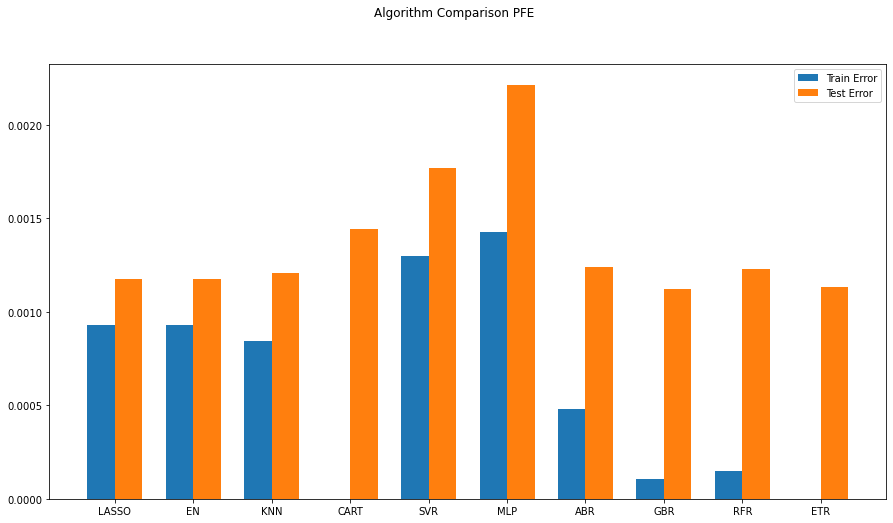

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0012310105613830607
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

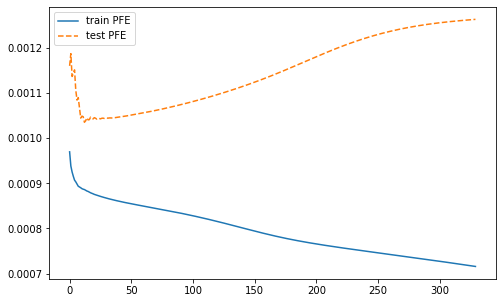

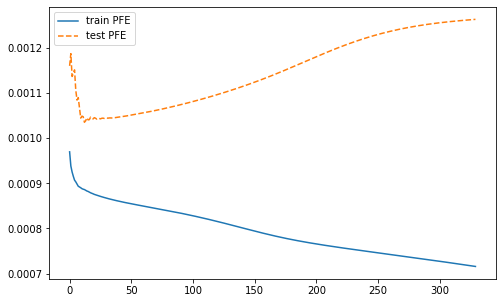

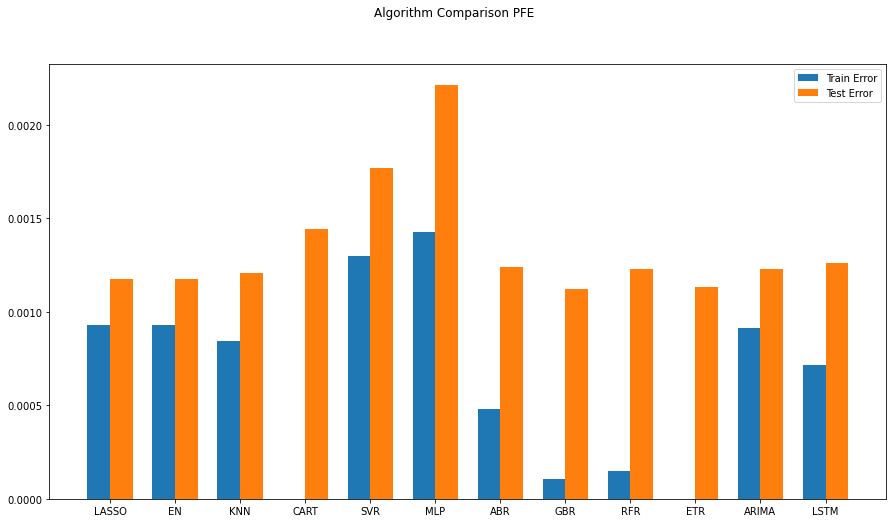

ARIMA(0, 0, 0) MSE=0.0009070
ARIMA(0, 0, 1) MSE=0.0009070
ARIMA(1, 0, 0) MSE=0.0009070
ARIMA(1, 0, 1) MSE=0.0009051
ARIMA(2, 0, 0) MSE=0.0009060
ARIMA(2, 0, 1) MSE=0.0009025
Best ARIMA(2, 0, 1) MSE=0.0009025
0.0012310105613830607


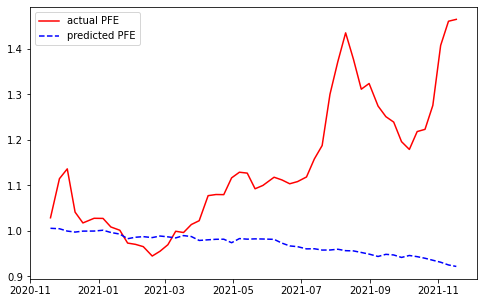

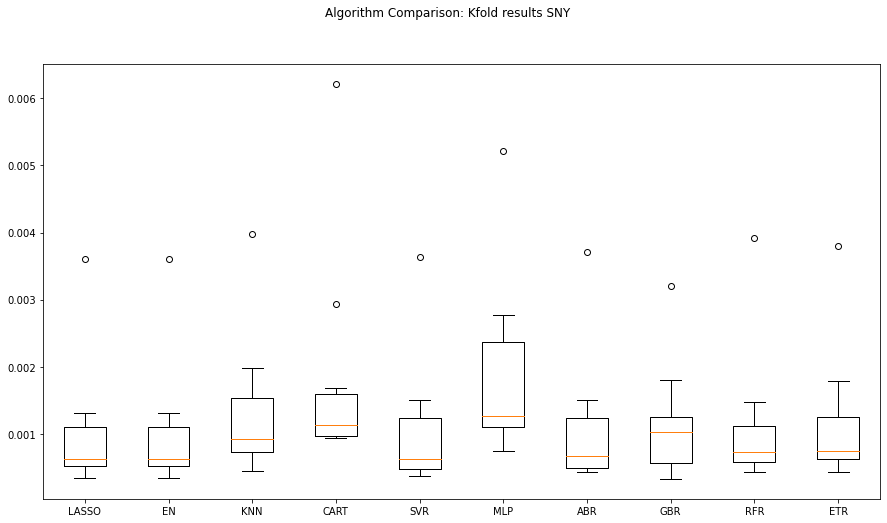

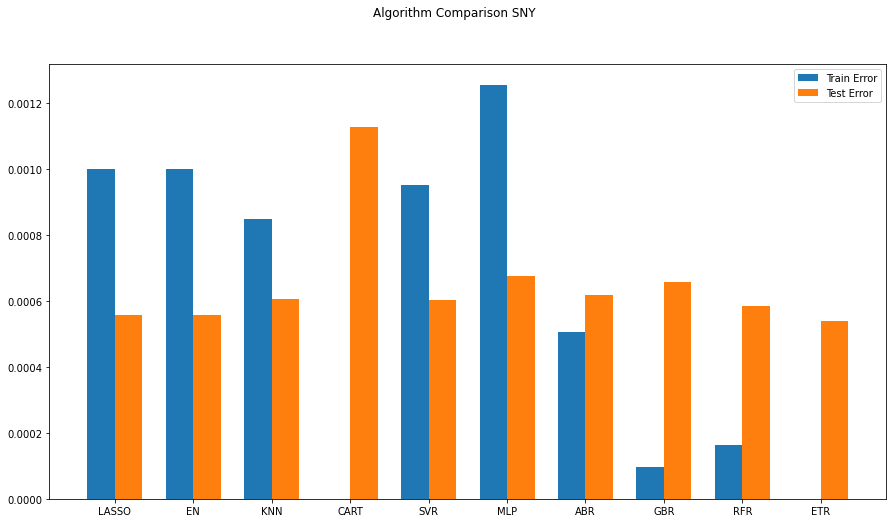

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.0005680617396079747
(51, 2, 10)
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 

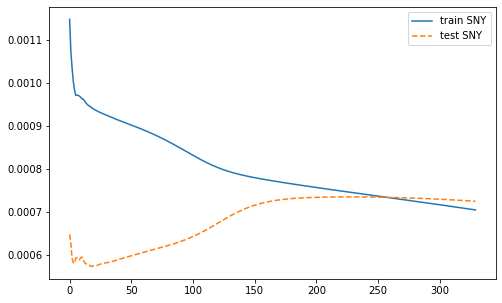

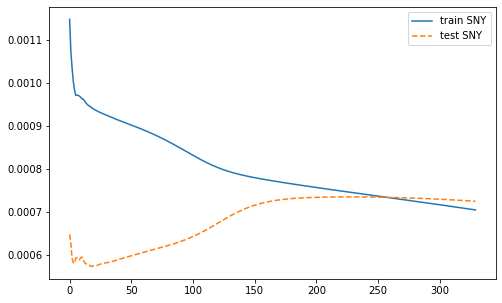

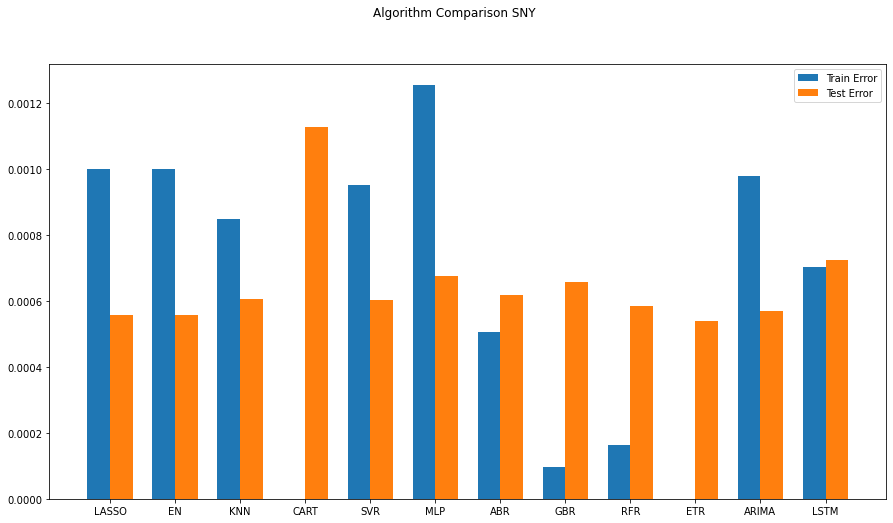

ARIMA(0, 0, 0) MSE=0.0009758
ARIMA(0, 0, 1) MSE=0.0009705
ARIMA(1, 0, 0) MSE=0.0009726
ARIMA(1, 0, 1) MSE=0.0009493
ARIMA(2, 0, 0) MSE=0.0009535
ARIMA(2, 0, 1) MSE=0.0009488
Best ARIMA(2, 0, 1) MSE=0.0009488
0.0005680617396079747


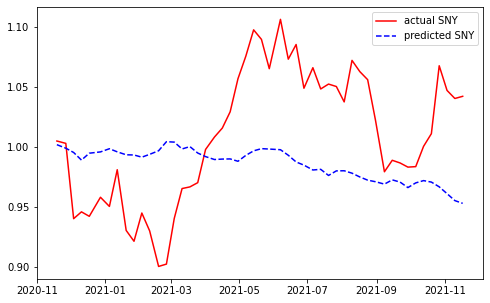

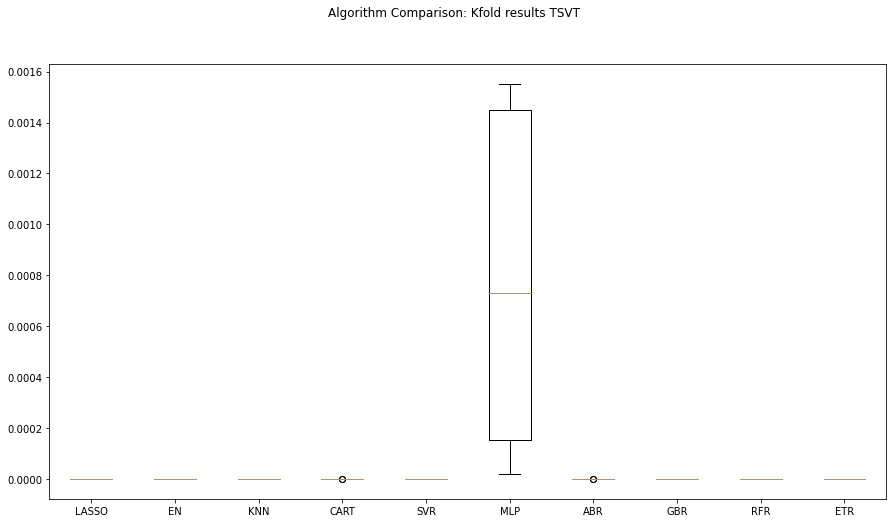

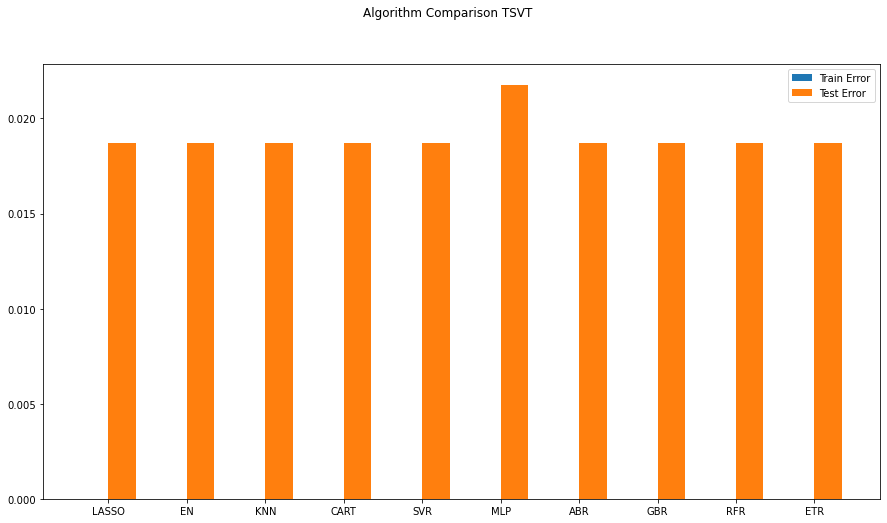

             DEXJPUS   DEXUSUK     SP500      DJIA    VIXCLS
2016-11-22  0.000157 -0.000040  0.002656  0.002184  0.001539
2016-11-30  0.015512  0.001845 -0.002684  0.002115  0.069904
2016-12-07 -0.007374  0.009807  0.019162  0.022034 -0.086943
2016-12-14  0.013651  0.008060  0.005309  0.012349  0.076385
2016-12-21  0.023450 -0.028580  0.005267  0.007521 -0.157315
...              ...       ...       ...       ...       ...
2020-10-15 -0.005678 -0.002088  0.010537  0.002414  0.022877
2020-10-22 -0.004756  0.013304 -0.008606 -0.004592  0.041400
2020-10-29 -0.001813 -0.015397 -0.042404 -0.061978  0.290613
2020-11-05 -0.009791  0.017381  0.058763  0.062912 -0.309647
2020-11-12  0.014270  0.001980  0.007538  0.024013 -0.084312

[201 rows x 5 columns]
0.018729480094837072
(51, 2, 6)
[[[0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0.]]

 [[0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0.]]

 [[0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0.]]

 [[0. 0. 0. 0. 0. 0.]
  [0. 0. 0. 0. 0. 0.]]

 [[0. 0. 0. 0. 0. 0.]
  [0. 

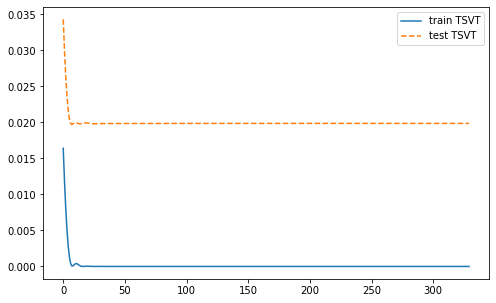

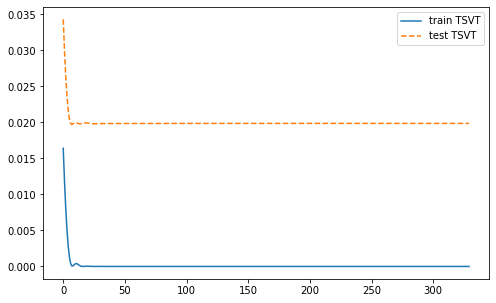

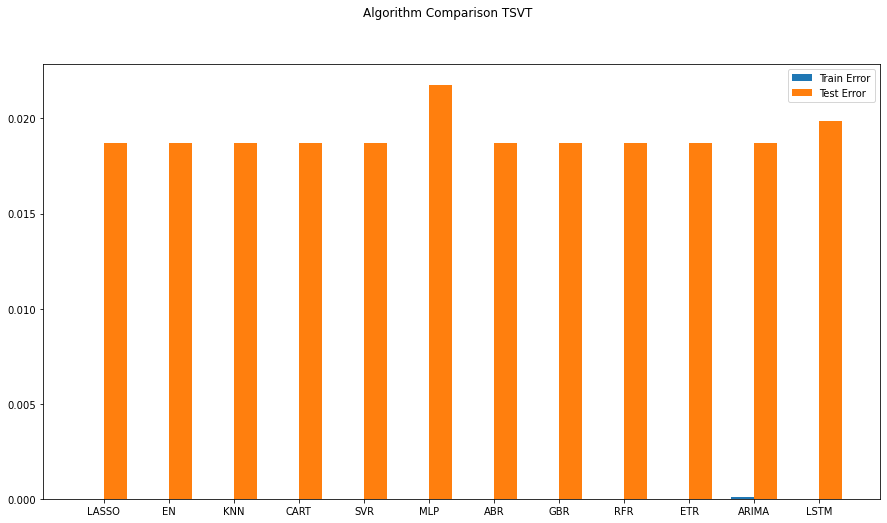

ARIMA(0, 0, 0) MSE=0.0000000
ARIMA(0, 0, 1) MSE=0.0000000
ARIMA(1, 0, 0) MSE=0.0000000
ARIMA(2, 0, 0) MSE=0.0000000
Best ARIMA(0, 0, 0) MSE=0.0000000
0.018729480094837072


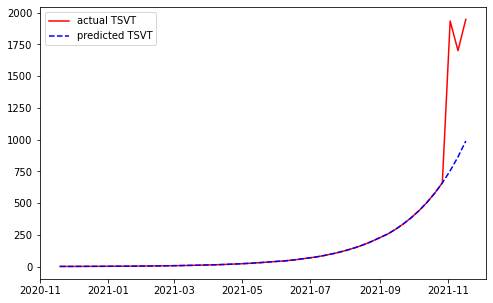

In [75]:
# LSTM Network
def create_LSTMmodel(learn_rate = 0.01, momentum=0): # create model
        model = Sequential()
        model.add(LSTM(50, input_shape=(X_train_LSTM.shape[1],X_train_LSTM.shape[2])))
        model.add(Dense(1))

        #More cells can be added if needed model.add(Dense(1))
        optimizer = SGD(lr=learn_rate, momentum=momentum) 
        model.compile(loss='mse', optimizer='adam')
        return model
    
def evaluate_arima_model(arima_order):
#predicted = list() 
    modelARIMA=ARIMA(endog=Y_temp,exog=X_train_ARIMA,order=arima_order) 
    model_fit = modelARIMA.fit()
    error = mean_squared_error(Y_temp, model_fit.fittedvalues)
    return error

# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(p_values, d_values, q_values): 
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q) 
                try:
                    mse = evaluate_arima_model(order) 
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                    print('ARIMA%s MSE=%.7f' % (order,mse))
                except: 
                    continue
    print('Best ARIMA%s MSE=%.7f' % (best_cfg, best_score))
    

    
seq_len = 2 #Length of the seq for the LSTM

for i in stk_tickers:
    try:
        X_temp1 = X_train.filter(regex=i, axis=1)
        X_temp2 = X_train.loc[:,['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
        X_temp = pd.concat([X_temp1, X_temp2], axis=1)

        #X_temp = X_train
        Y_temp = Y_train.filter(regex=i, axis=1)

        X_temp_test1 = X_test.filter(regex=i, axis=1)
        X_temp_test2 = X_test.loc[:,['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
        X_temp_test = pd.concat([X_temp_test1, X_temp_test2], axis=1)

        #X_temp_test = X_test
        Y_temp_test = Y_test.filter(regex=i, axis=1)

        temp = X.loc[:,['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
        temp2 = X.filter(regex=i, axis=1)
        X_temp_fulX = pd.concat([temp2, temp], axis=1)
        #X_temp_fulX = X

        #Arima_temp = X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
        #Arima_temp_test = X_test.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]

        names = []

        kfold_results = [] 
        test_results = [] 
        train_results = []
        # Model testing
        for name, model in models:
            names.append(name)
            ## k-fold analysis:
            kfold = KFold(n_splits=num_folds)
            #converted mean squared error to positive. The lower the better
            cv_results = -1* cross_val_score(model, X_temp, Y_temp, cv=kfold, scoring=scoring)
            kfold_results.append(cv_results)
            # Full Training period
            res = model.fit(X_temp, Y_temp)
            train_result = mean_squared_error(res.predict(X_temp), Y_temp) 
            train_results.append(train_result)
            # Test results
            test_result = mean_squared_error(res.predict(X_temp_test), Y_temp_test) 
            test_results.append(test_result)
        # Comparition starts by ticker
        for j in range(0,1):
            fig = pyplot.figure()
            fig.suptitle(f'Algorithm Comparison: Kfold results {i}')
            ax = fig.add_subplot(111)
            pyplot.boxplot(kfold_results)
            ax.set_xticklabels(names)
            fig.set_size_inches(15,8)
            pyplot.show()
        # Error testing
        for k in range(0,1):
            fig = pyplot.figure()
            ind = np.arange(len(names)) # the x locations for the groups
            width = 0.35 # the width of the bars
            fig.suptitle(f'Algorithm Comparison {i}')
            ax = fig.add_subplot(111)
            pyplot.bar(ind - width/2, train_results,  width=width, label='Train Error')
            pyplot.bar(ind + width/2, test_results, width=width, label='Test Error')
            fig.set_size_inches(15,8)
            pyplot.legend()
            ax.set_xticks(ind)
            ax.set_xticklabels(names)
            pyplot.show()

        # ARIMA and LSTM
        for arimalstm in range(0,1):
    #         X_train_ARIMA=X_temp.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
    #         X_test_ARIMA=X_test.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
    #         X_train_ARIMA=Arima_temp.loc[:, Arima_temp.columns != i]
    #         X_test_ARIMA=Arima_temp_test.loc[:, Arima_temp.columns != i]
    #         X_train_ARIMA=X_temp.loc[:, X_temp.columns != i]
    #         X_test_ARIMA=X_temp_test.loc[:, X_temp_test.columns != i]
            X_train_ARIMA=X_temp.loc[:, ['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
            X_test_ARIMA=X_temp_test.loc[:, ['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]

            tr_len = len(X_train_ARIMA)
            te_len = len(X_test_ARIMA)
            to_len = len(X_temp_fulX)

            print(X_train_ARIMA)

            X_train_ARIMA.index=pd.DatetimeIndex(X_train_ARIMA.index).to_period('W')

            Y_temp.index=pd.DatetimeIndex(Y_temp.index).to_period('W')

            modelARIMA=ARIMA(endog=Y_temp,exog=X_train_ARIMA,order=[1,0,0])
            model_fit = modelARIMA.fit(trend='nc')

            error_Training_ARIMA = mean_squared_error(Y_temp, model_fit.fittedvalues)
            predicted = model_fit.predict(start = tr_len -1 ,end = to_len -1, exog = X_test_ARIMA)[1:]
            error_Test_ARIMA = mean_squared_error(Y_temp_test,predicted)
            print(error_Test_ARIMA)

            #seq_len = 2 #Length of the seq for the LSTM
            Y_train_LSTM, Y_test_LSTM = np.array(Y_temp)[seq_len-1:], np.array(Y_temp_test) 
            X_train_LSTM = np.zeros((X_temp.shape[0]+1-seq_len, seq_len, X_temp.shape[1]))
            X_test_LSTM = np.zeros((X_temp_test.shape[0], seq_len, X_temp_fulX.shape[1]))
            print(X_test_LSTM.shape)
            print(X_test_LSTM)

            for l in range(seq_len):
                X_train_LSTM[:, l, :] = np.array(X_temp)[l:X_temp.shape[0]+l+1-seq_len, :]
                X_test_LSTM[:, l, :] = np.array(X_temp_fulX)[X_temp.shape[0]+l-1:X_temp_fulX.shape[0]+l+1-seq_len, :]
            print(X_test_LSTM.shape)
            print(X_test_LSTM)

            LSTMModel = create_LSTMmodel(learn_rate = 0.01, momentum=0)
            LSTMModel_fit = LSTMModel.fit(X_train_LSTM, Y_train_LSTM, validation_data=(X_test_LSTM, Y_test_LSTM),epochs=330, batch_size=72, verbose=0, shuffle=False)

            for m in range(seq_len):
                pyplot.plot(LSTMModel_fit.history['loss'], label=f'train {i}', )
                pyplot.plot(LSTMModel_fit.history['val_loss'], '--',label=f'test {i}',)
                pyplot.legend()
                pyplot.show()

            error_Training_LSTM = mean_squared_error(Y_train_LSTM,LSTMModel.predict(X_train_LSTM))
            predicted = LSTMModel.predict(X_test_LSTM)
            error_Test_LSTM = mean_squared_error(Y_temp_test,predicted)

            test_results.append(error_Test_ARIMA)
            test_results.append(error_Test_LSTM)
            train_results.append(error_Training_ARIMA)
            train_results.append(error_Training_LSTM)
            names.append("ARIMA")
            names.append("LSTM")

            for n in range(0,1):
                fig = pyplot.figure()
                ind = np.arange(len(names)) # the x locations for the groups
                width = 0.35 # the width of the bars
                fig.suptitle(f'Algorithm Comparison {i}')
                ax = fig.add_subplot(111)
                pyplot.bar(ind - width/2, train_results,  width=width, label='Train Error')
                pyplot.bar(ind + width/2, test_results, width=width, label='Test Error')
                fig.set_size_inches(15,8)
                pyplot.legend()
                ax.set_xticks(ind)
                ax.set_xticklabels(names)
                pyplot.show()

            p_values = [0, 1, 2]
            d_values = range(0, 2)
            q_values = range(0, 2)
            #warnings.filterwarnings("ignore")
            evaluate_models(p_values, d_values, q_values)

            modelARIMA_tuned=ARIMA(endog=Y_temp,exog=X_train_ARIMA,order=[2,0,1])
            model_fit_tuned = modelARIMA_tuned.fit(trend='nc')
            # estimate accuracy on validation set
            predicted_tuned = model_fit.predict(start = tr_len -1 ,end = to_len -1, exog = X_test_ARIMA)[1:]
            print(mean_squared_error(Y_temp_test,predicted_tuned))

            # plotting the actual data versus predicted data
            for o in range(0,1):
                predicted_tuned.index = Y_temp_test.index
                pyplot.plot(np.exp(Y_temp_test).cumprod(), 'r', label=f'actual {i}',)
                # plotting t, a separately
                pyplot.plot(np.exp(predicted_tuned).cumprod(), 'b--', label=f'predicted {i}')
                pyplot.legend()
                pyplot.rcParams["figure.figsize"] = (8,5)
                pyplot.show()
    except:
        pass
    

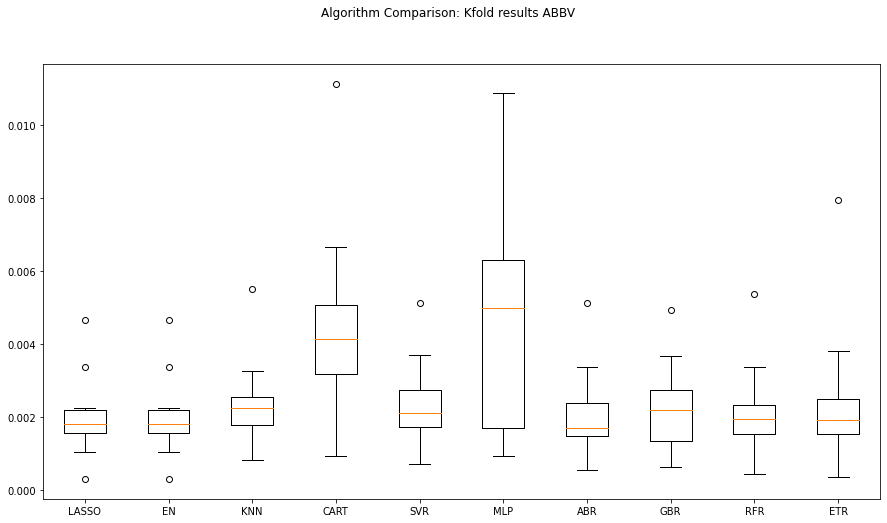

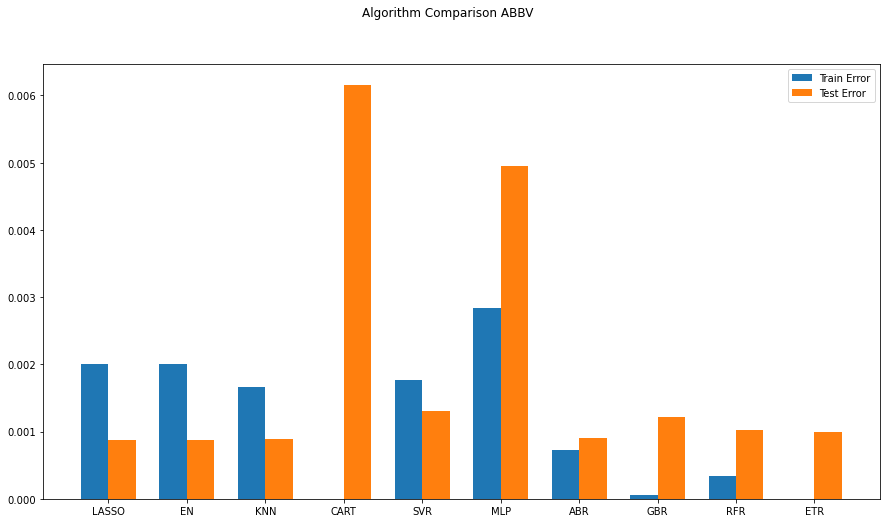

                AMGN       AZN      BIIB       BMY      CRXT      GILD  \
2016-11-22  0.001967  0.003780 -0.000648  0.000757 -0.020242  0.000291   
2016-11-30 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242 -0.010259   
2016-12-07 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242 -0.012562   
2016-12-14  0.051757  0.054210  0.003324  0.057340 -0.020242  0.045887   
2016-12-21 -0.017093 -0.008464 -0.011030  0.003243 -0.020242 -0.023386   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242 -0.005702   
2020-10-22 -0.030370 -0.011291 -0.050538  0.005611 -0.020242 -0.037050   
2020-10-29 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242 -0.035910   
2020-11-05  0.062939  0.077041  0.292538  0.095906 -0.020242  0.018619   
2020-11-12  0.022043  0.030002 -0.308677 -0.015811 -0.020242  0.005852   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-22 -0.000570  0.001406  

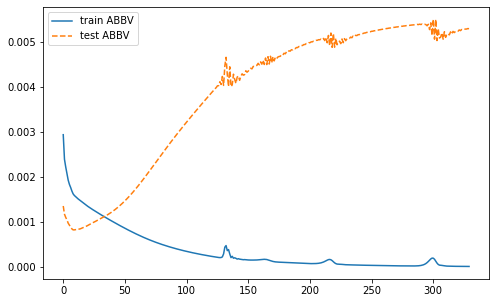

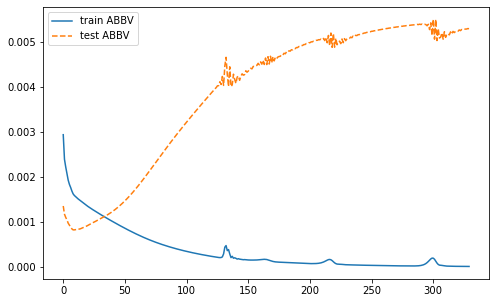

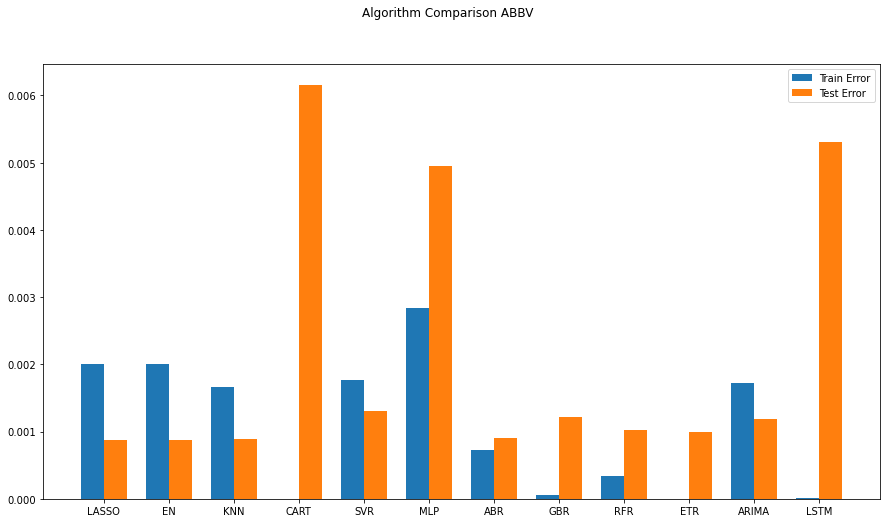

Best ARIMANone MSE=inf
0.0011896937839784578


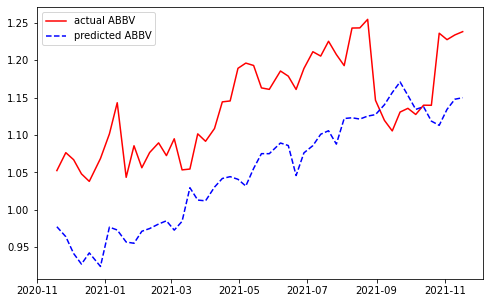

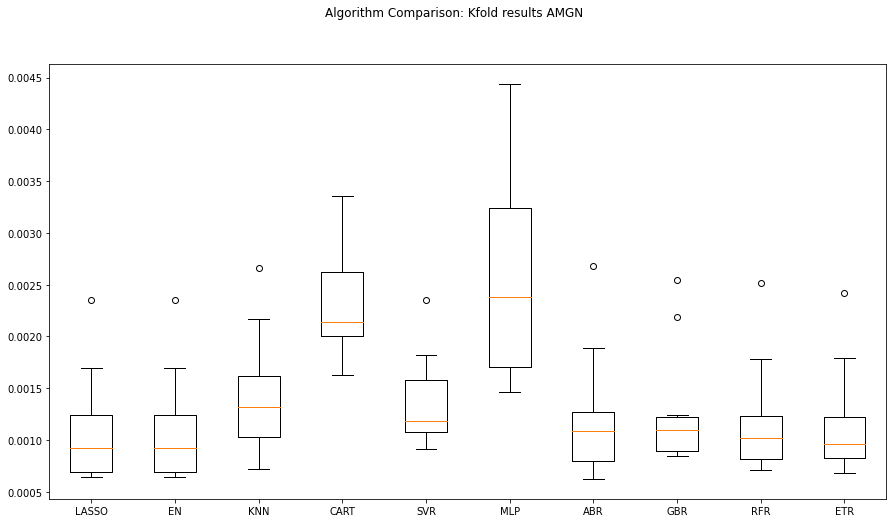

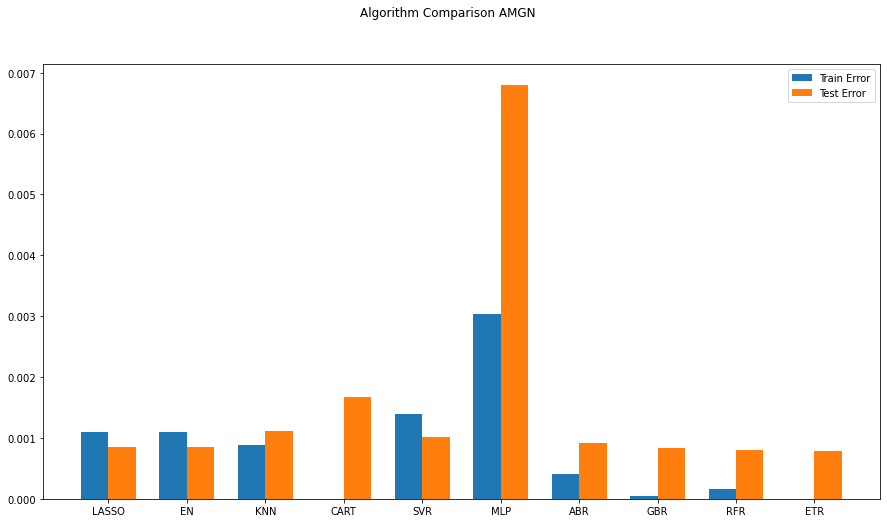

                ABBV       AZN      BIIB       BMY      CRXT      GILD  \
2016-11-22  0.003566  0.003780 -0.000648  0.000757 -0.020242  0.000291   
2016-11-30  0.031240 -0.011033 -0.078579 -0.001947 -0.020242 -0.010259   
2016-12-07 -0.013412 -0.011156 -0.030277 -0.021491 -0.020242 -0.012562   
2016-12-14  0.027620  0.054210  0.003324  0.057340 -0.020242  0.045887   
2016-12-21 -0.003574 -0.008464 -0.011030  0.003243 -0.020242 -0.023386   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.028884 -0.022166 -0.019666 -0.020242 -0.005702   
2020-10-22 -0.010853 -0.011291 -0.050538  0.005611 -0.020242 -0.037050   
2020-10-29 -0.044134 -0.017277 -0.083284 -0.047869 -0.020242 -0.035910   
2020-11-05  0.149625  0.077041  0.292538  0.095906 -0.020242  0.018619   
2020-11-12  0.040886  0.030002 -0.308677 -0.015811 -0.020242  0.005852   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-22 -0.000570  0.001406  

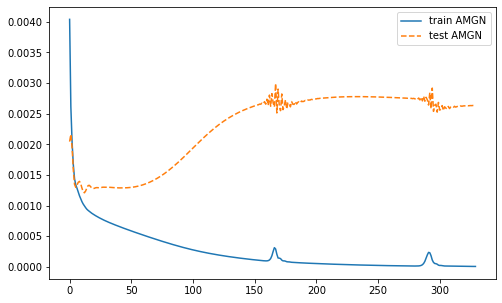

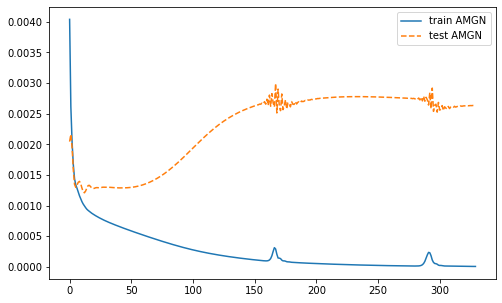

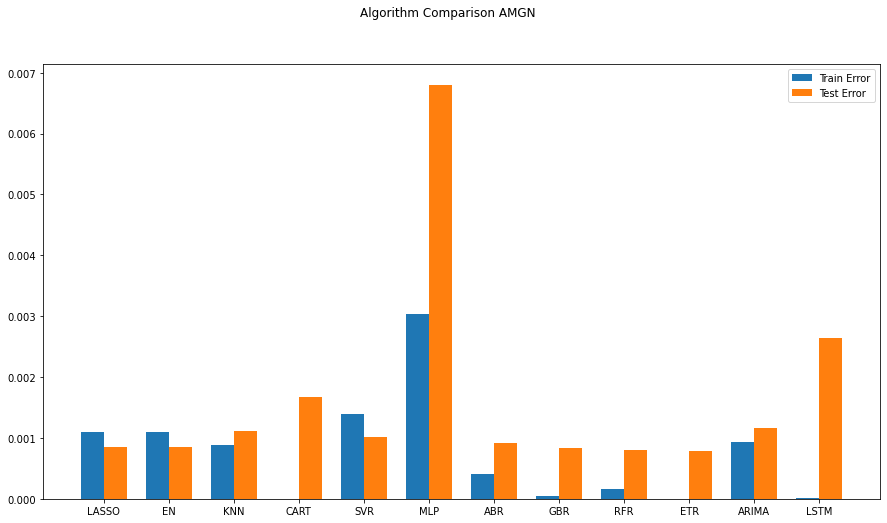

Best ARIMANone MSE=inf
0.001162128143667862


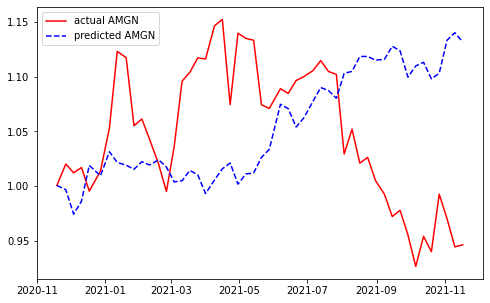

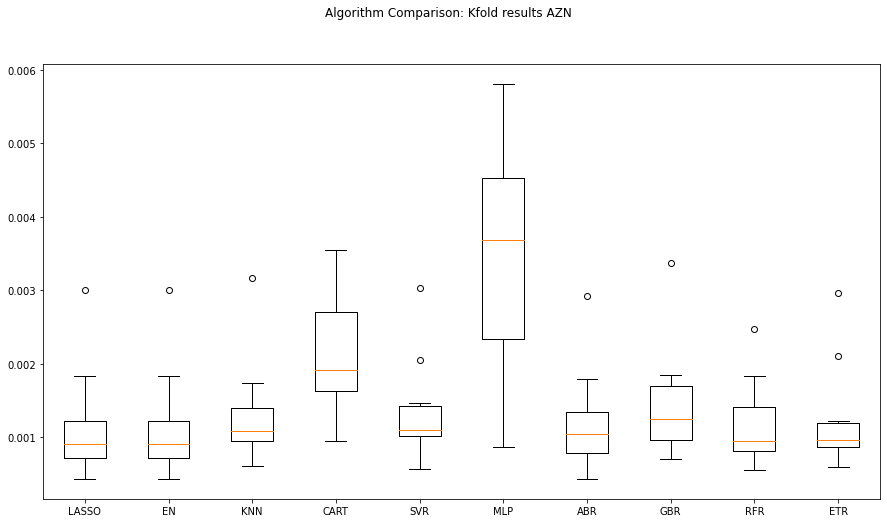

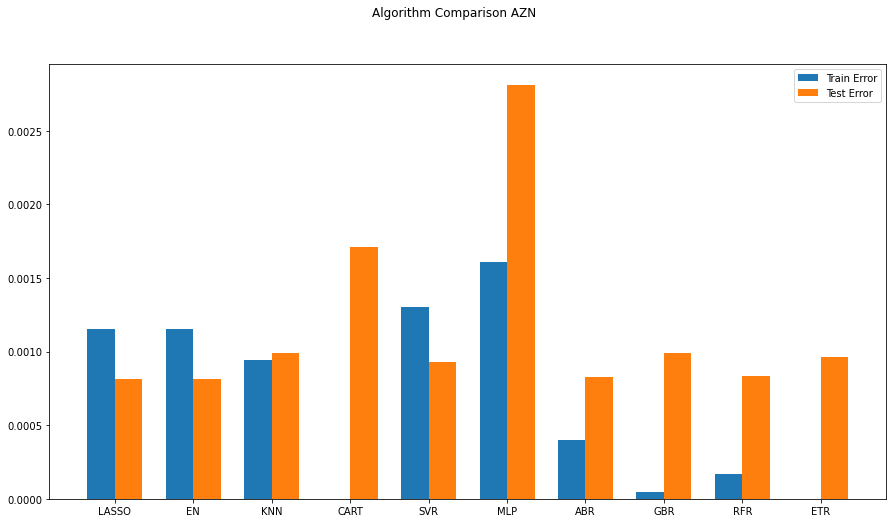

                ABBV      AMGN      BIIB       BMY      CRXT      GILD  \
2016-11-22  0.003566  0.001967 -0.000648  0.000757 -0.020242  0.000291   
2016-11-30  0.031240 -0.001803 -0.078579 -0.001947 -0.020242 -0.010259   
2016-12-07 -0.013412 -0.020193 -0.030277 -0.021491 -0.020242 -0.012562   
2016-12-14  0.027620  0.051757  0.003324  0.057340 -0.020242  0.045887   
2016-12-21 -0.003574 -0.017093 -0.011030  0.003243 -0.020242 -0.023386   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.022166 -0.019666 -0.020242 -0.005702   
2020-10-22 -0.010853 -0.030370 -0.050538  0.005611 -0.020242 -0.037050   
2020-10-29 -0.044134 -0.045589 -0.083284 -0.047869 -0.020242 -0.035910   
2020-11-05  0.149625  0.062939  0.292538  0.095906 -0.020242  0.018619   
2020-11-12  0.040886  0.022043 -0.308677 -0.015811 -0.020242  0.005852   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-22 -0.000570  0.001406  

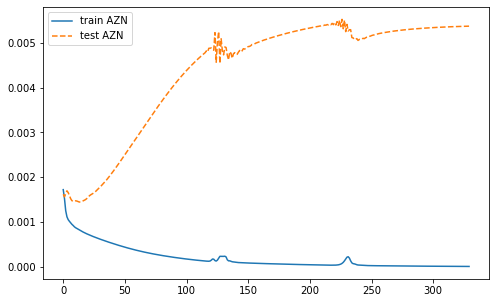

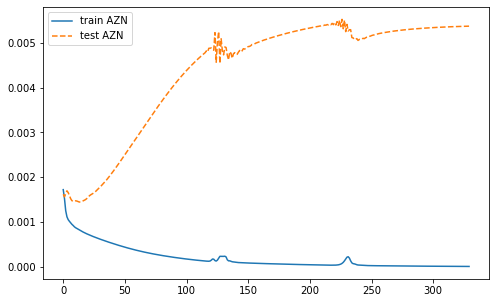

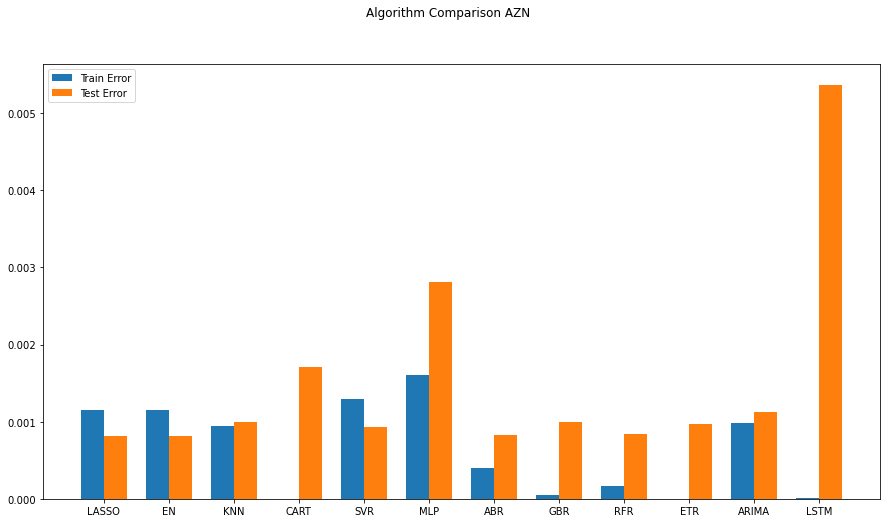

Best ARIMANone MSE=inf
0.0011228058562894295


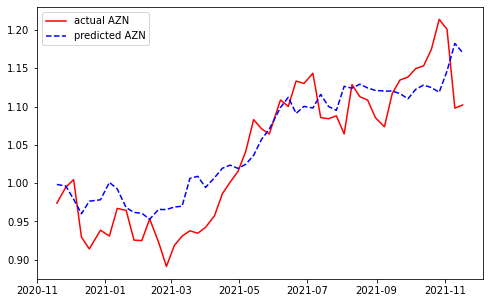

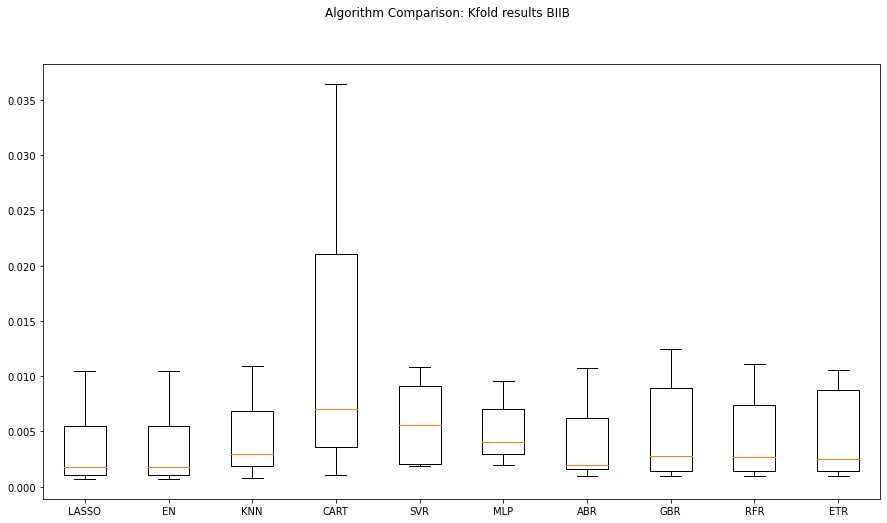

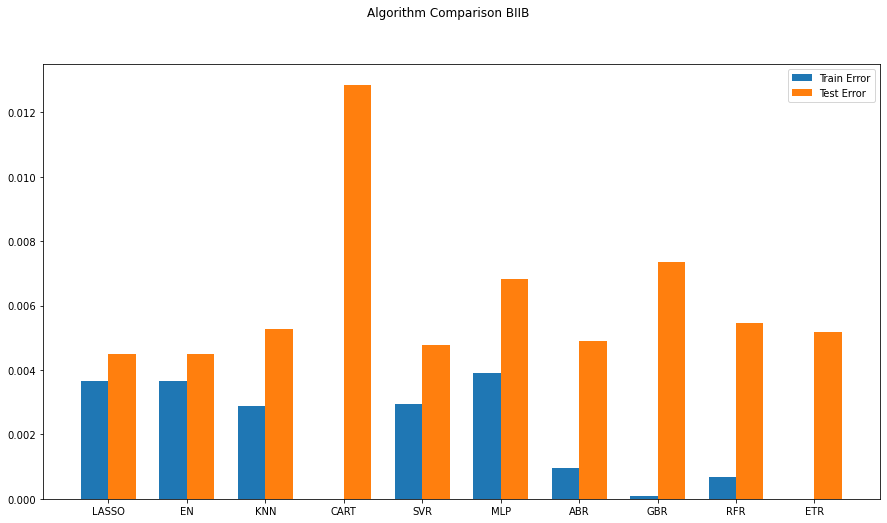

                ABBV      AMGN       AZN       BMY      CRXT      GILD  \
2016-11-22  0.003566  0.001967  0.003780  0.000757 -0.020242  0.000291   
2016-11-30  0.031240 -0.001803 -0.011033 -0.001947 -0.020242 -0.010259   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.021491 -0.020242 -0.012562   
2016-12-14  0.027620  0.051757  0.054210  0.057340 -0.020242  0.045887   
2016-12-21 -0.003574 -0.017093 -0.008464  0.003243 -0.020242 -0.023386   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.019666 -0.020242 -0.005702   
2020-10-22 -0.010853 -0.030370 -0.011291  0.005611 -0.020242 -0.037050   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.047869 -0.020242 -0.035910   
2020-11-05  0.149625  0.062939  0.077041  0.095906 -0.020242  0.018619   
2020-11-12  0.040886  0.022043  0.030002 -0.015811 -0.020242  0.005852   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-22 -0.000570  0.001406  

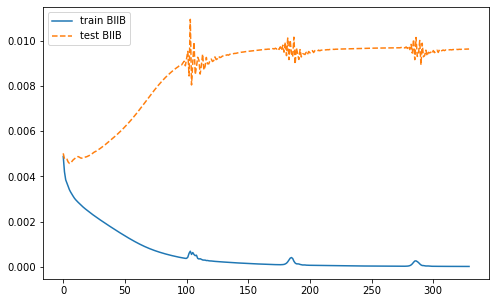

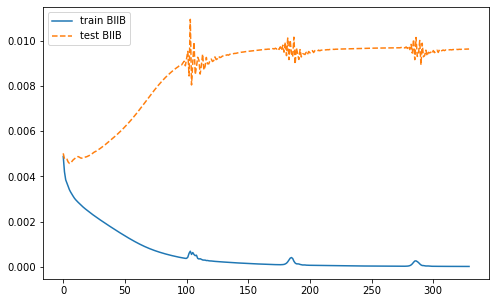

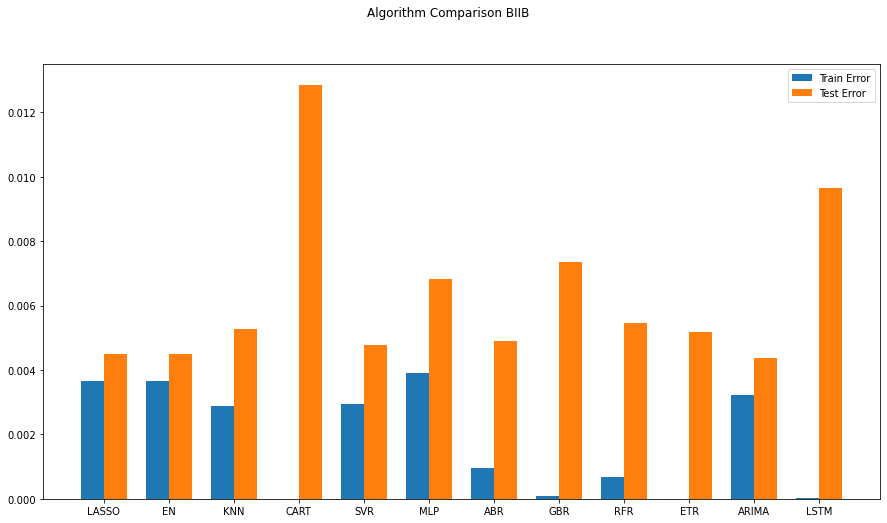

Best ARIMANone MSE=inf
0.004373483022554388


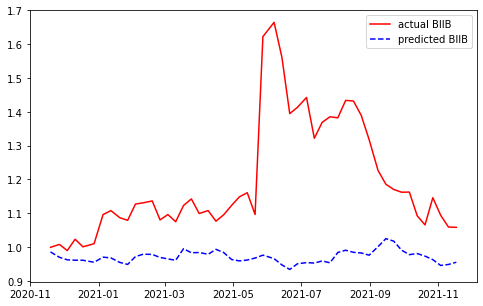

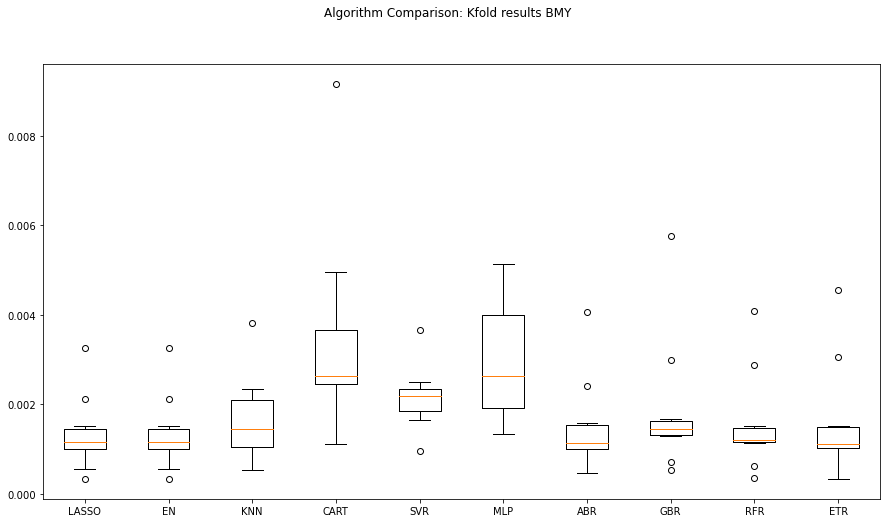

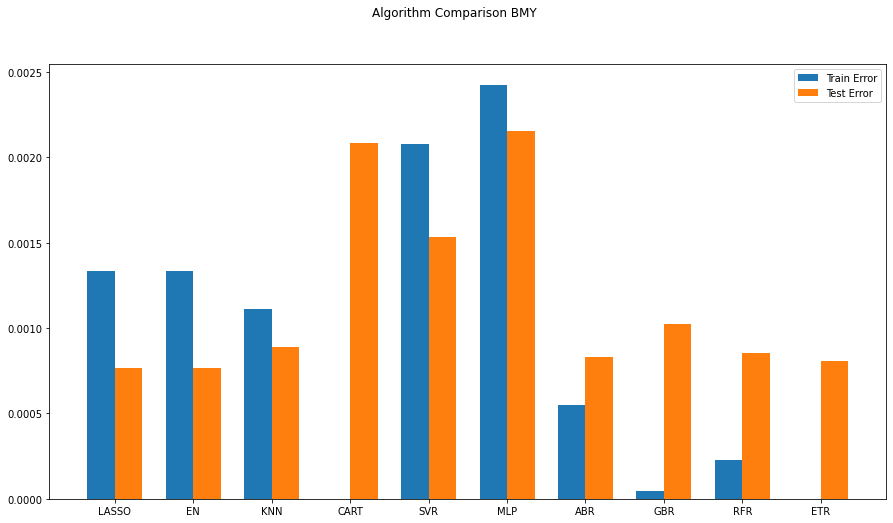

                ABBV      AMGN       AZN      BIIB      CRXT      GILD  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648 -0.020242  0.000291   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.020242 -0.010259   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.020242 -0.012562   
2016-12-14  0.027620  0.051757  0.054210  0.003324 -0.020242  0.045887   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030 -0.020242 -0.023386   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.020242 -0.005702   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538 -0.020242 -0.037050   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.020242 -0.035910   
2020-11-05  0.149625  0.062939  0.077041  0.292538 -0.020242  0.018619   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.020242  0.005852   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-22 -0.000570  0.001406  

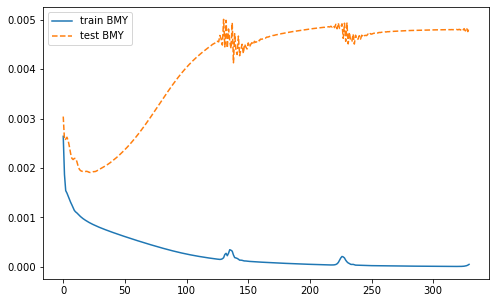

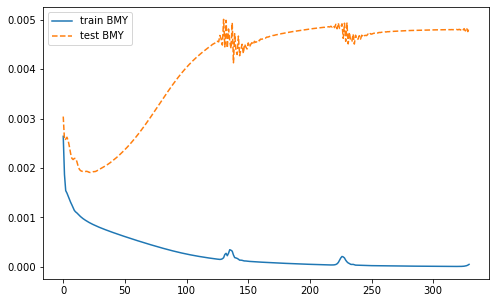

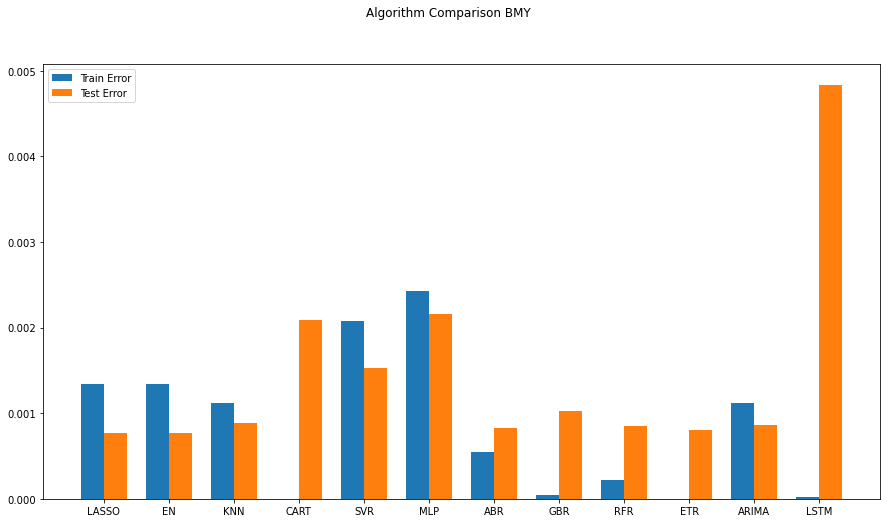

Best ARIMANone MSE=inf
0.0008565187130266453


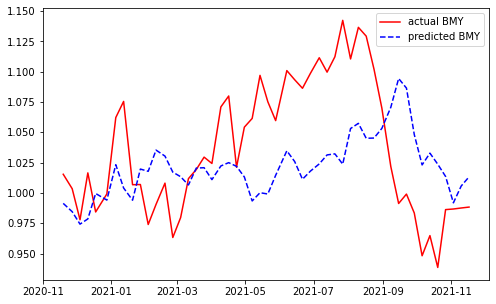

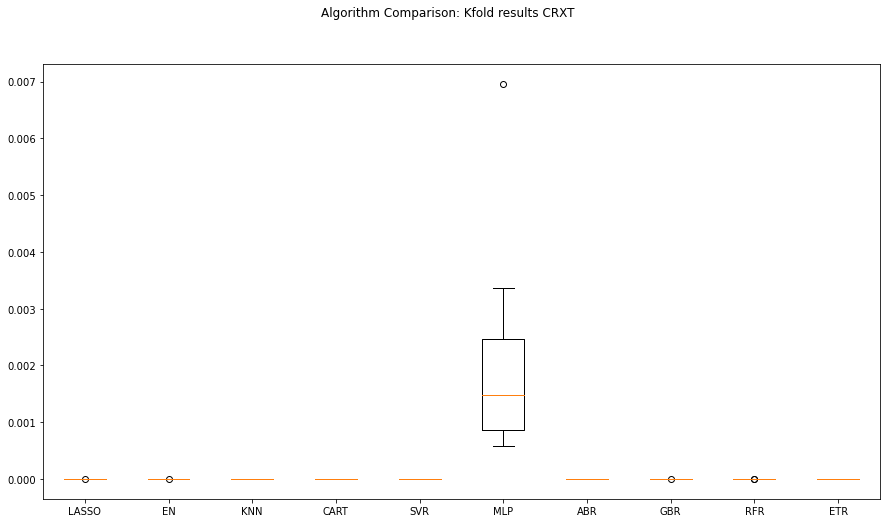

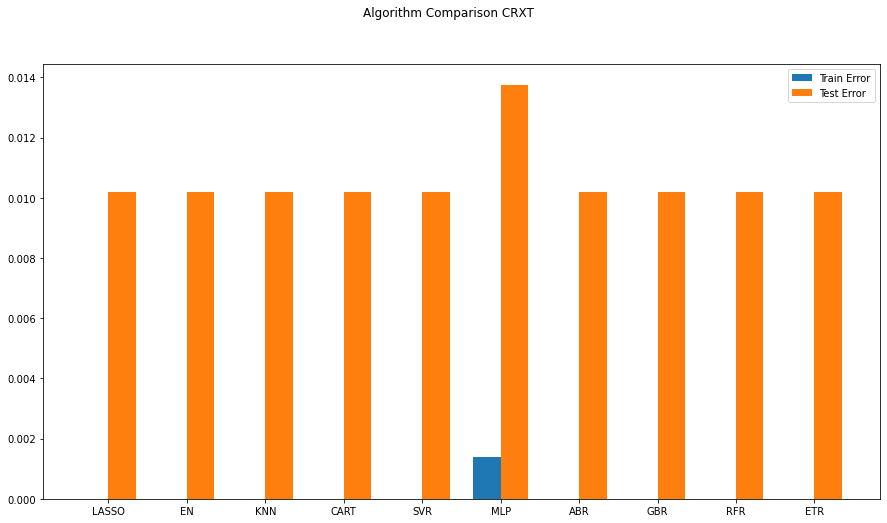

                ABBV      AMGN       AZN      BIIB       BMY      GILD  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757  0.000291   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.010259   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.012562   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340  0.045887   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.023386   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.005702   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.037050   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.035910   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906  0.018619   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811  0.005852   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-22 -0.000570  0.001406  

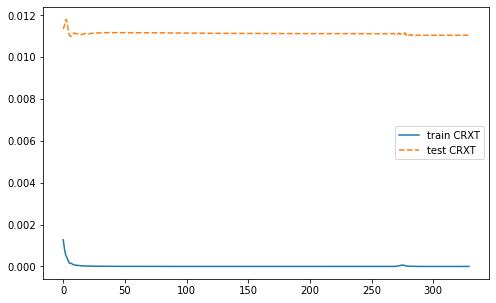

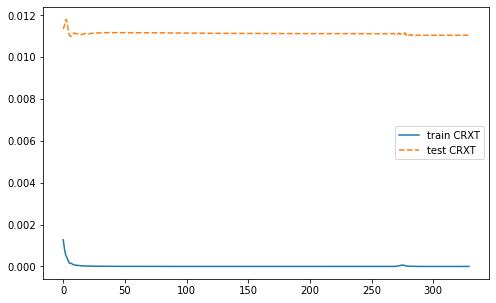

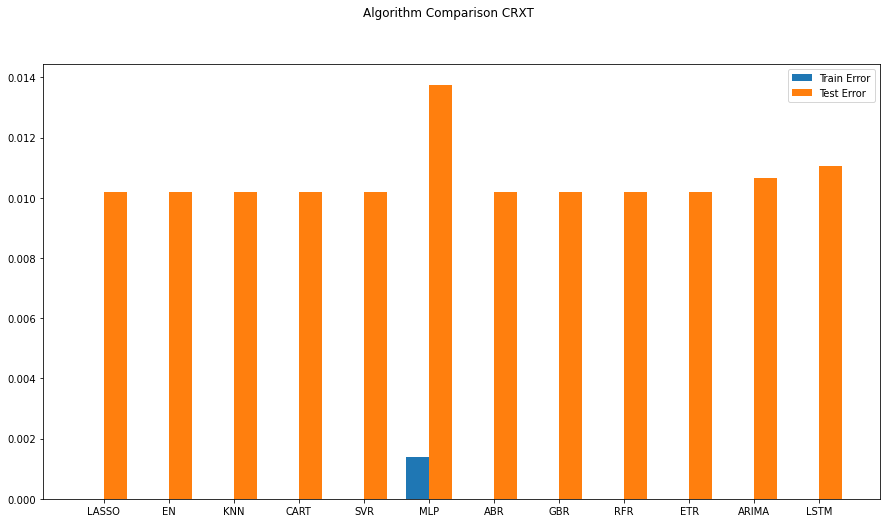

Best ARIMANone MSE=inf
0.010667692681195454


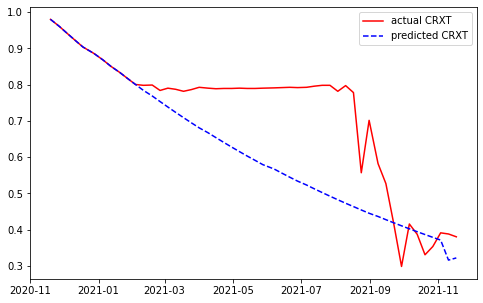

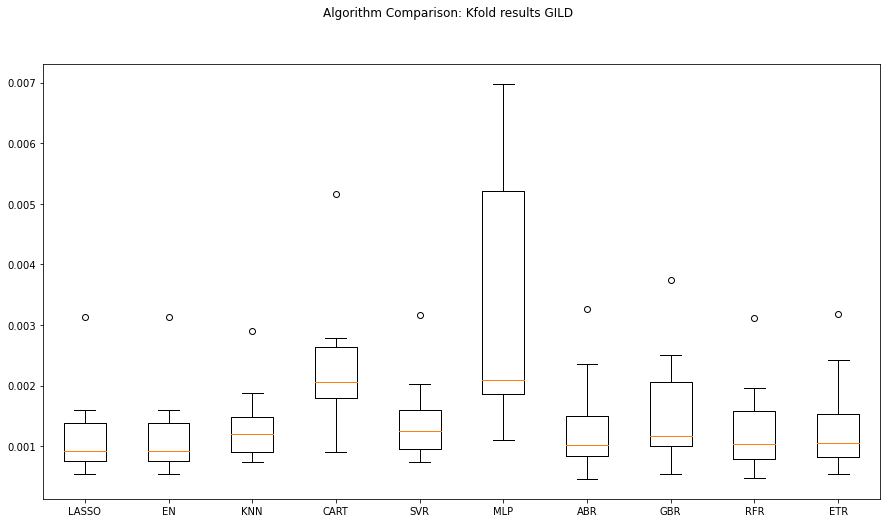

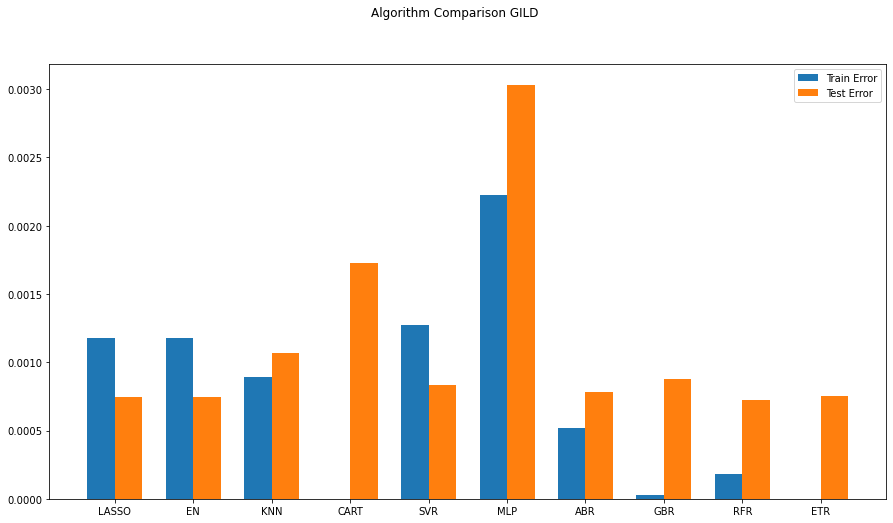

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-22 -0.000570  0.001406  

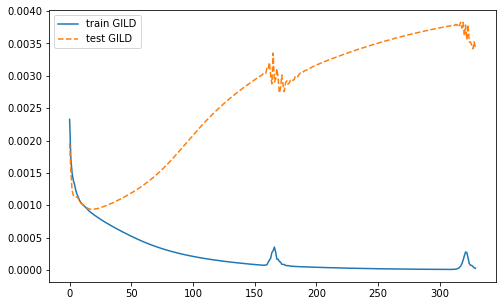

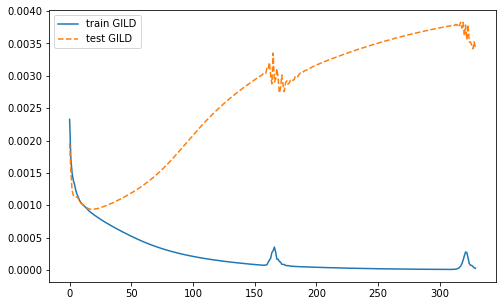

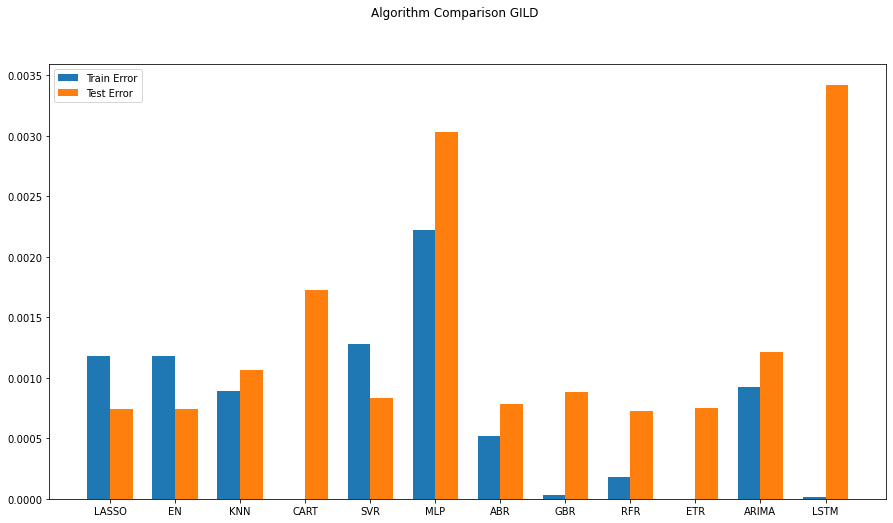

Best ARIMANone MSE=inf
0.0012102497062645304


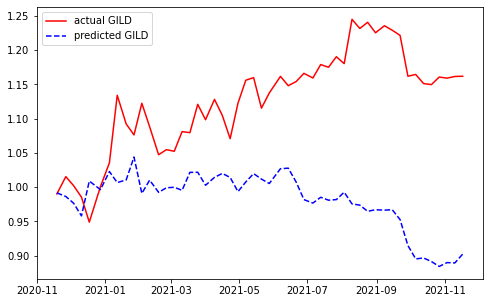

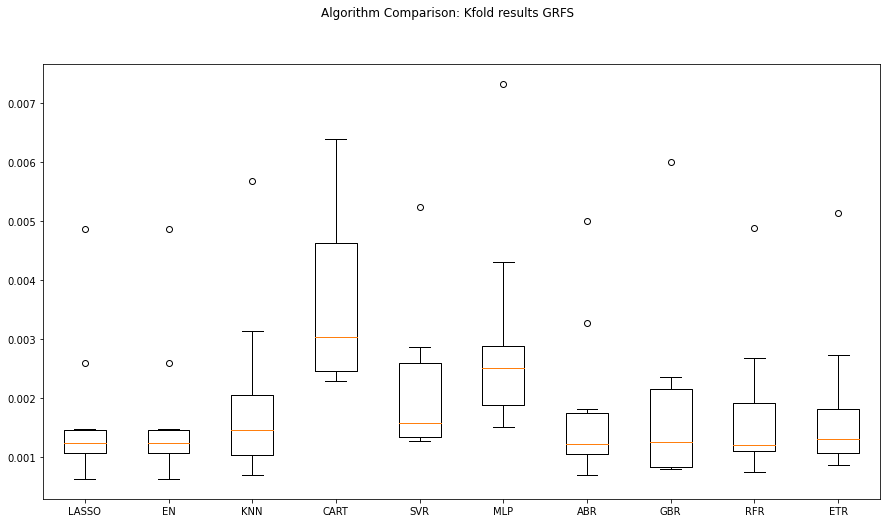

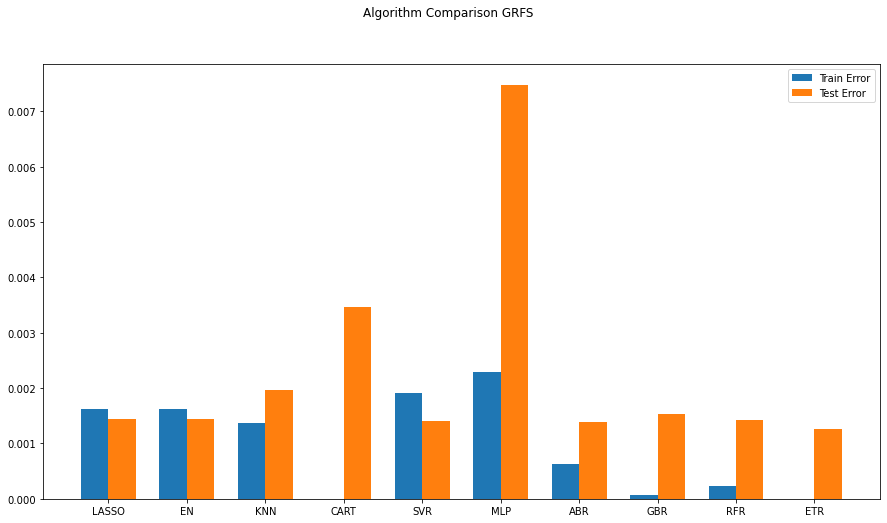

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-22  0.000291  0.001406  

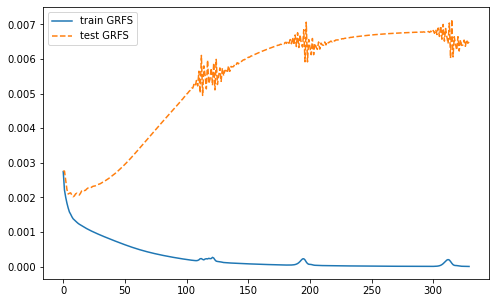

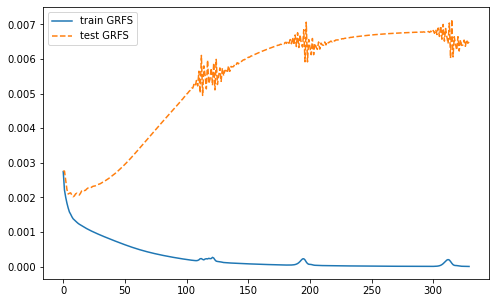

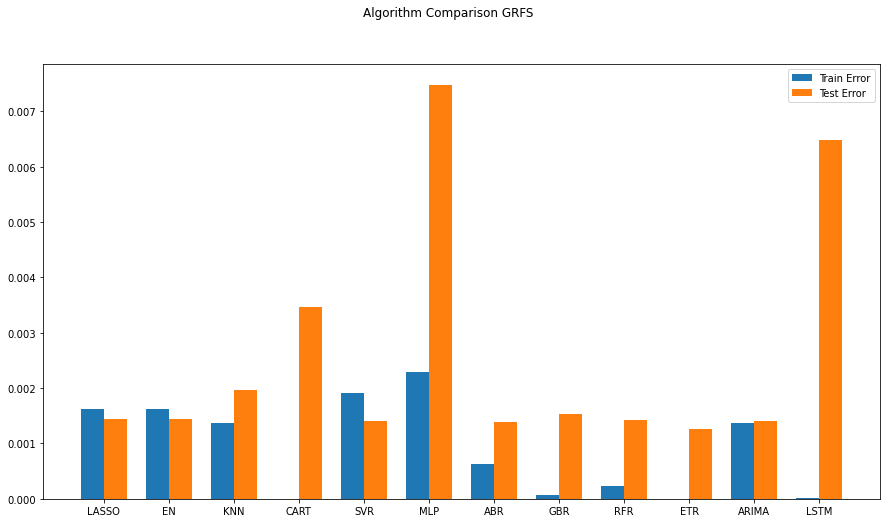

Best ARIMANone MSE=inf
0.0014045673446075463


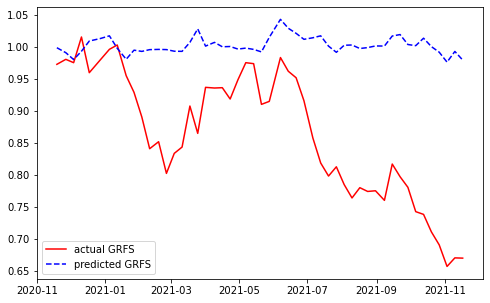

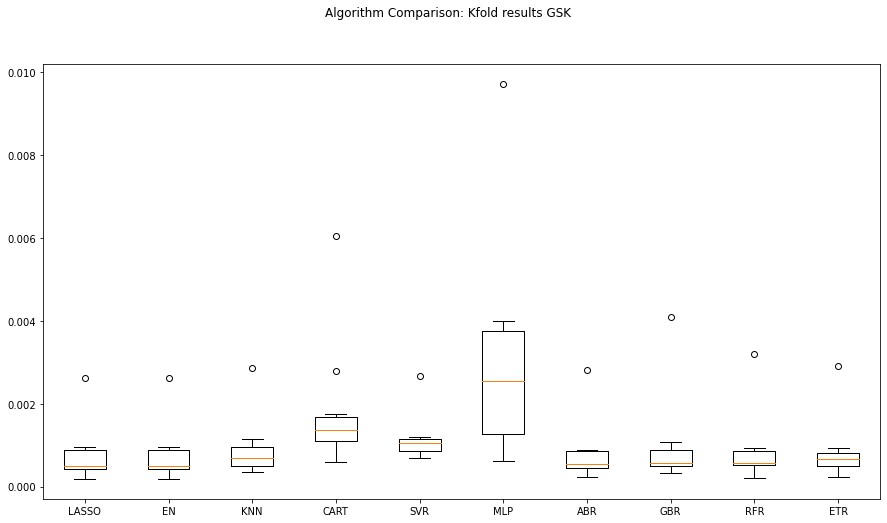

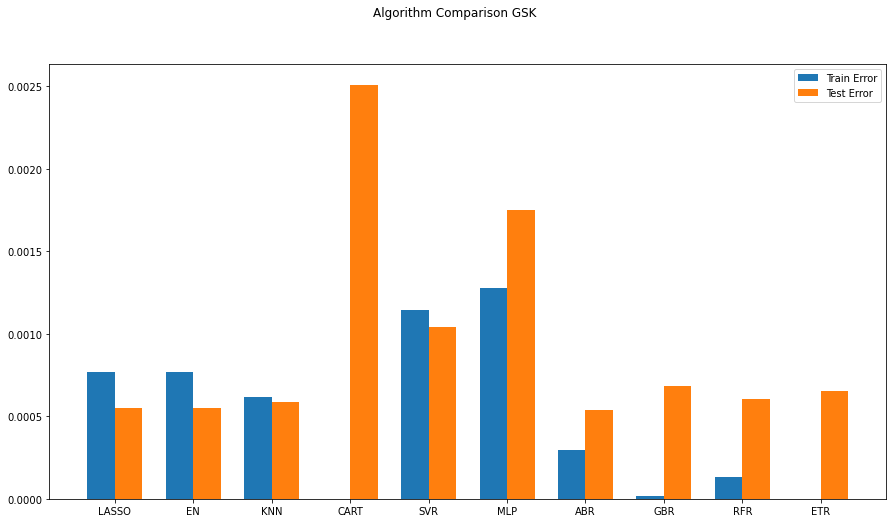

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       HCM      HZNP  ...       NVS       OGN  \
2016-11-22  0.000291 -0.000570  

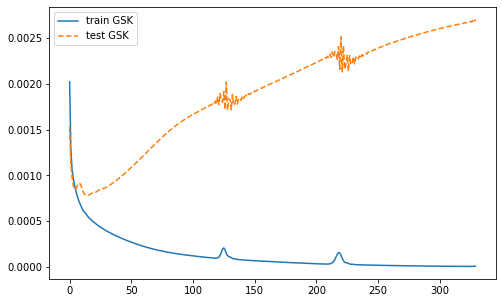

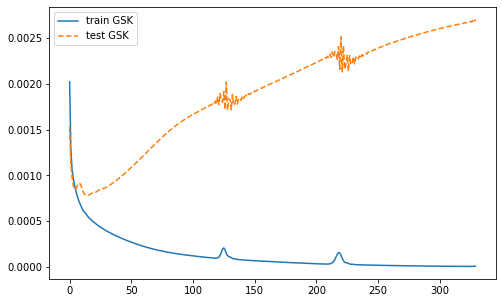

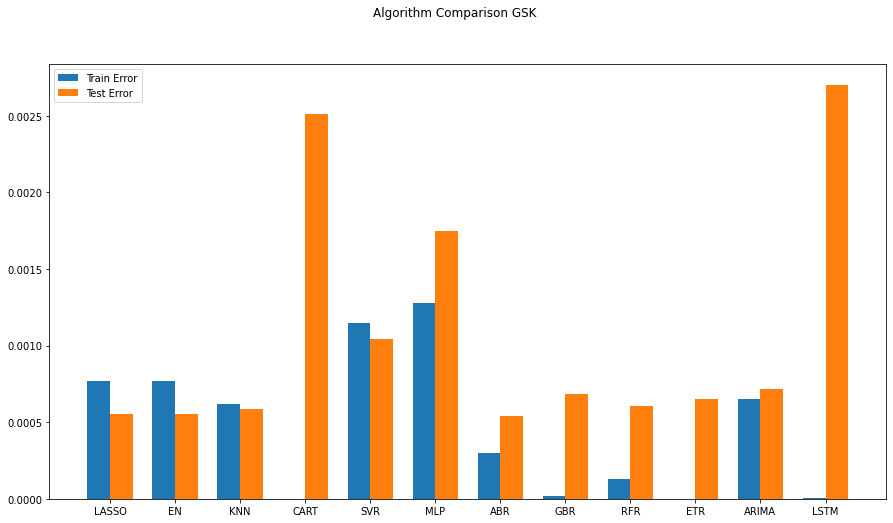

Best ARIMANone MSE=inf
0.0007157550793122863


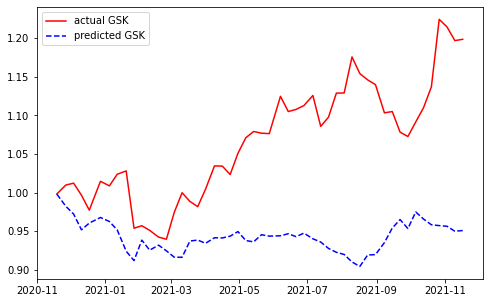

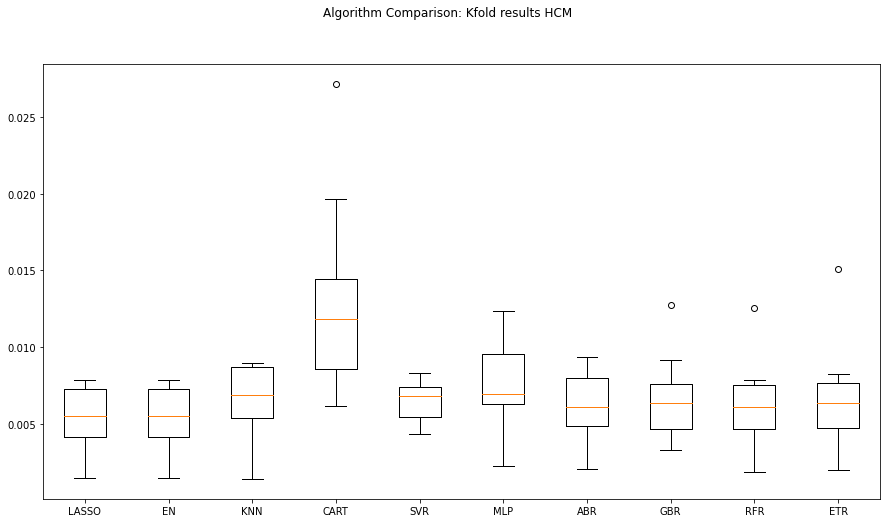

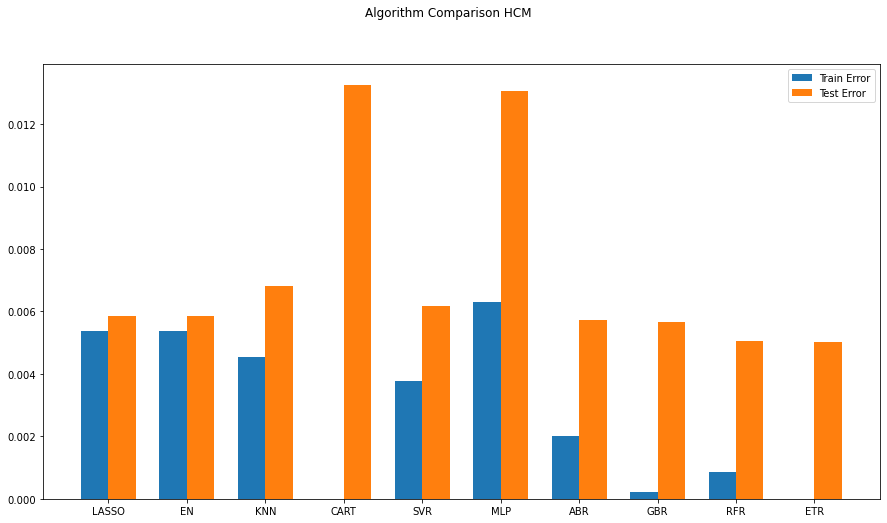

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK      HZNP  ...       NVS       OGN  \
2016-11-22  0.000291 -0.000570  

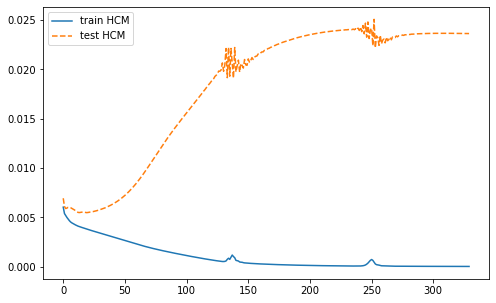

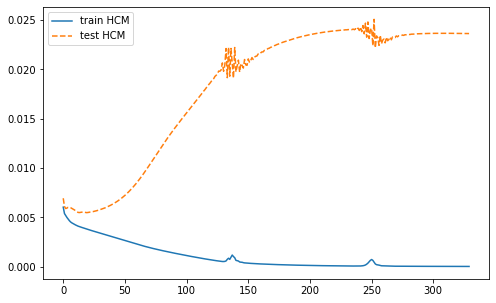

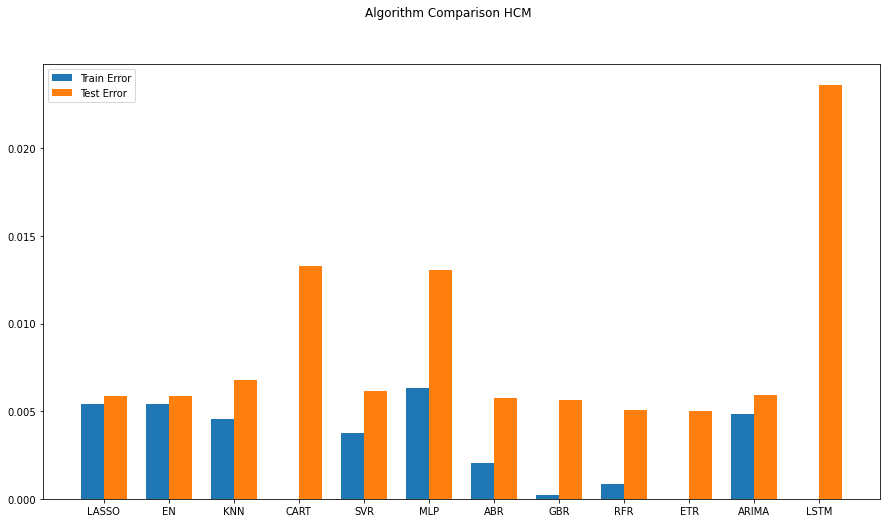

Best ARIMANone MSE=inf
0.005928824205414083


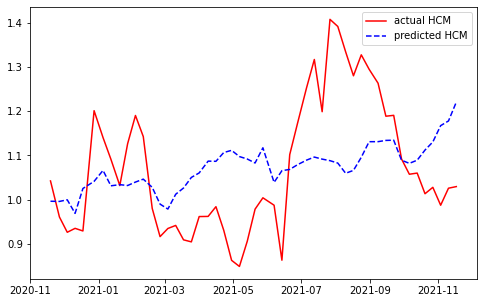

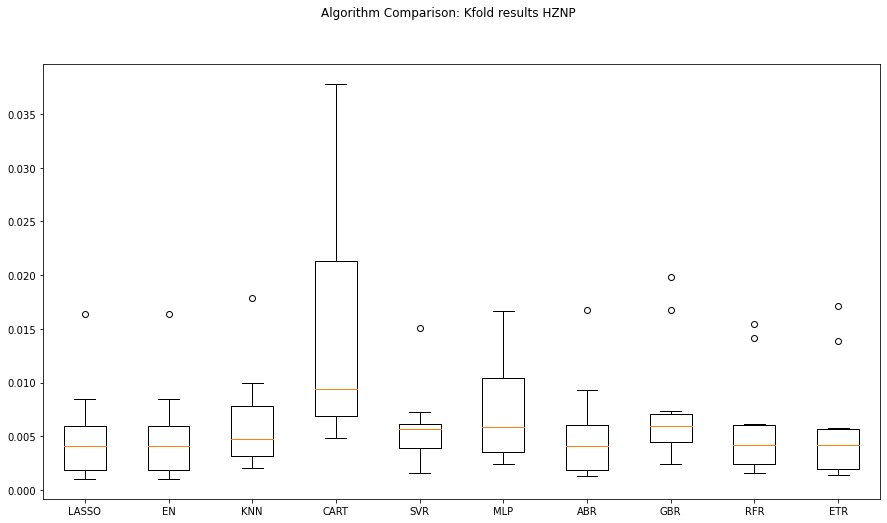

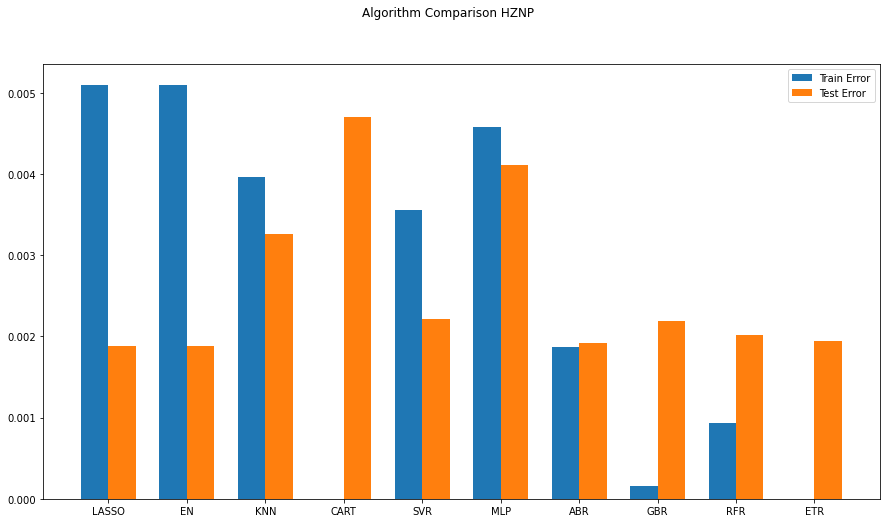

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVS       OGN  \
2016-11-22  0.000291 -0.000570  

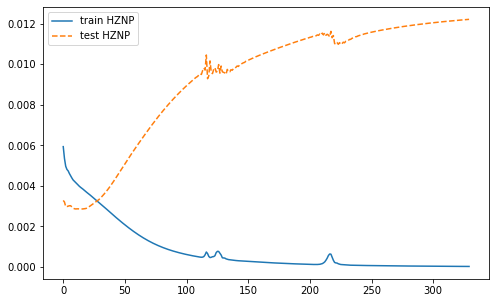

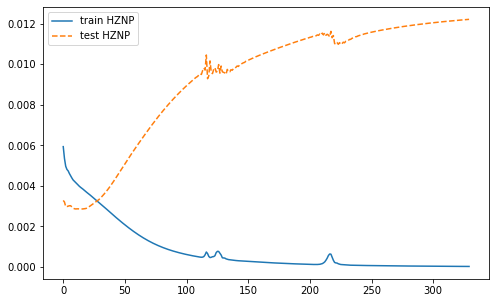

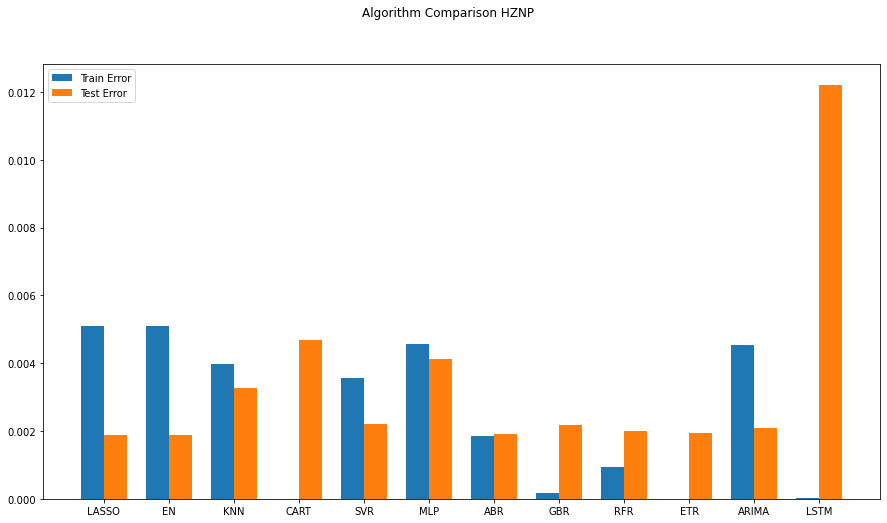

Best ARIMANone MSE=inf
0.0020848306958390615


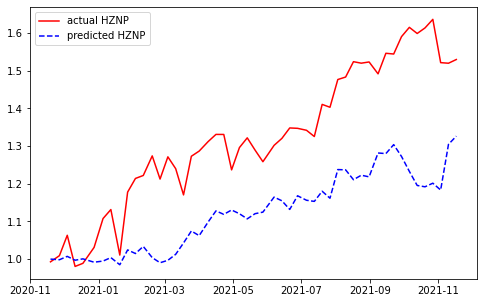

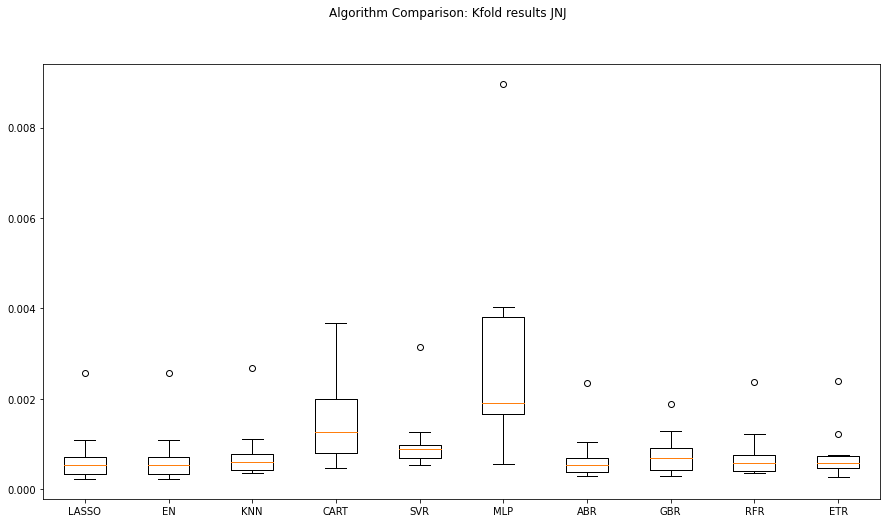

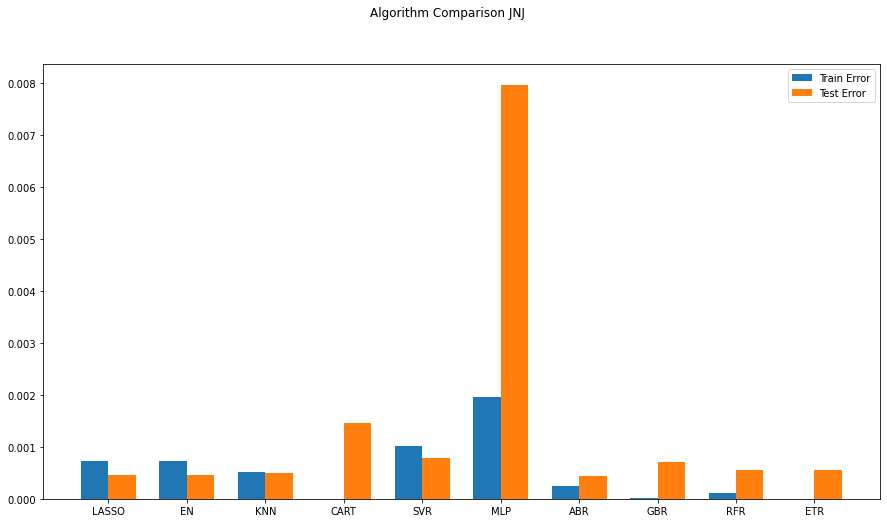

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVS       OGN  \
2016-11-22  0.000291 -0.000570  

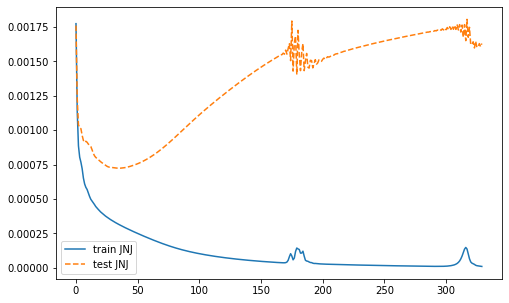

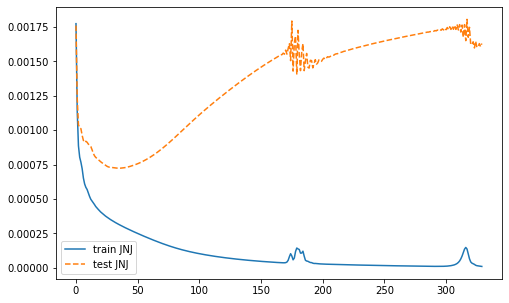

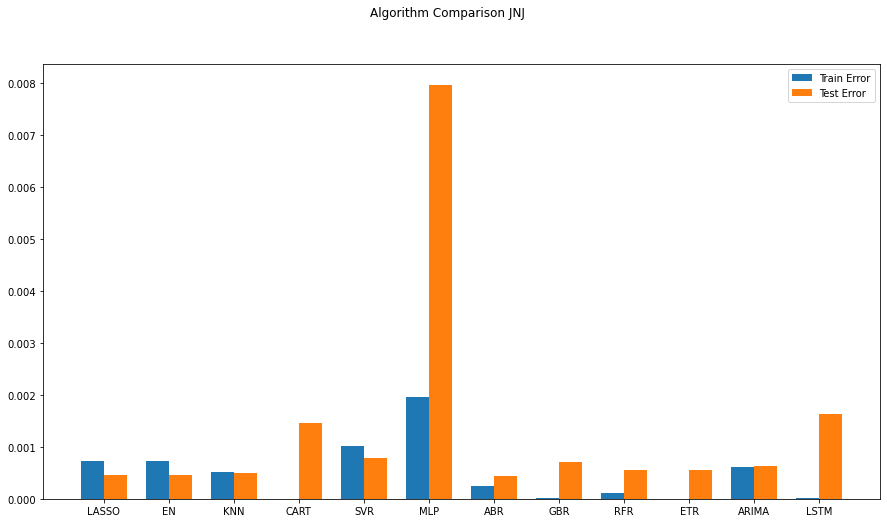

Best ARIMANone MSE=inf
0.000623524807637095


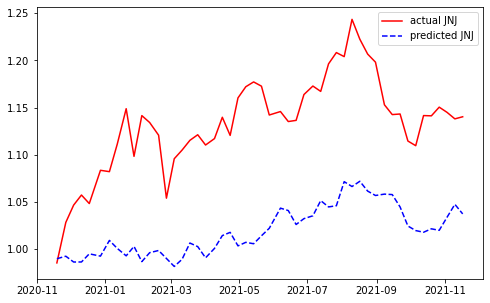

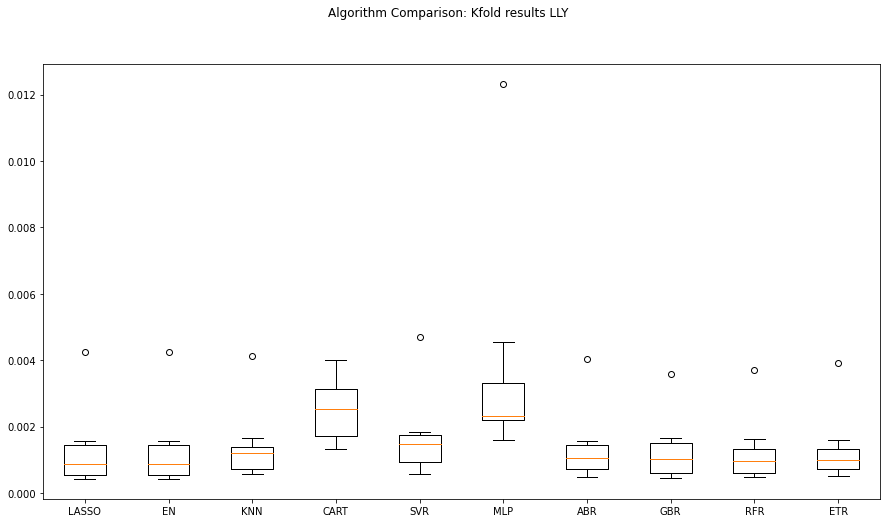

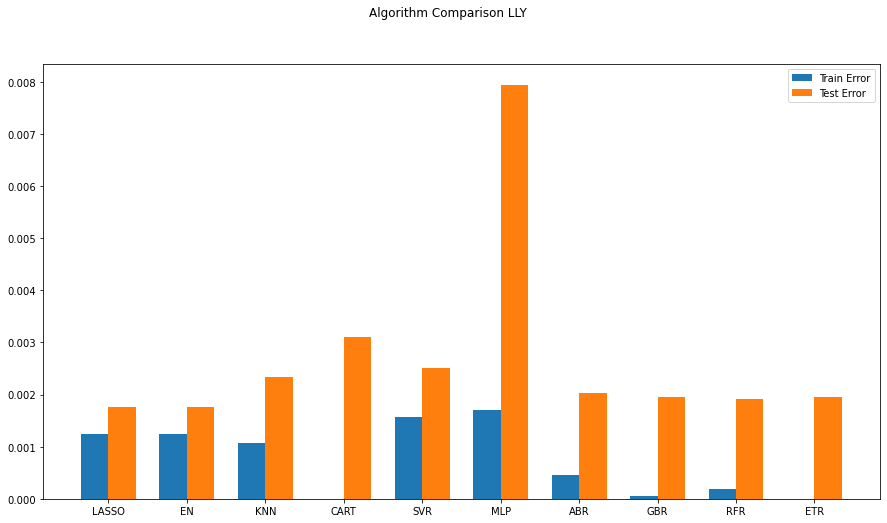

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVS       OGN  \
2016-11-22  0.000291 -0.000570  

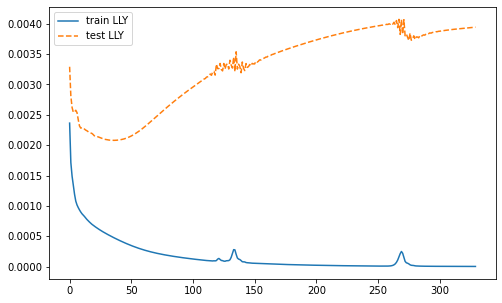

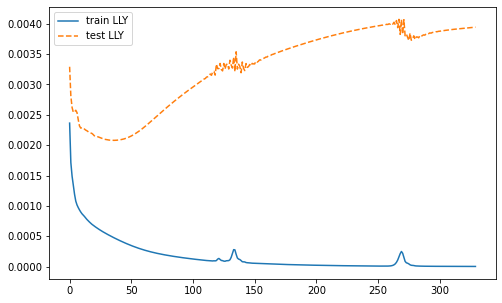

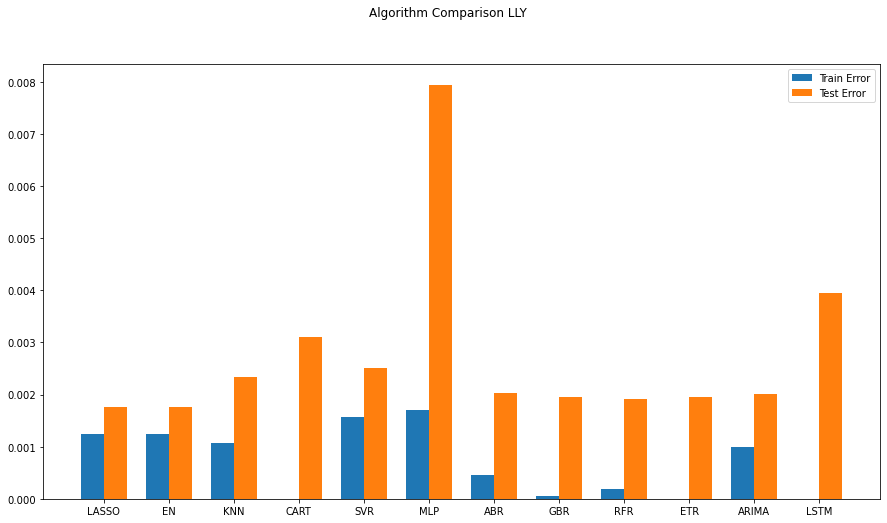

Best ARIMANone MSE=inf
0.0020135897344557142


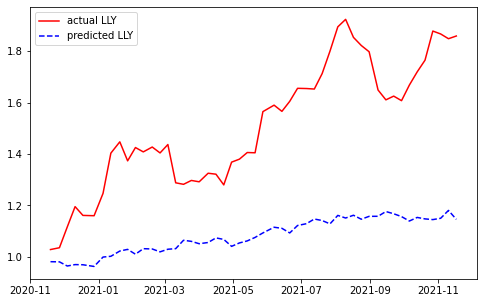

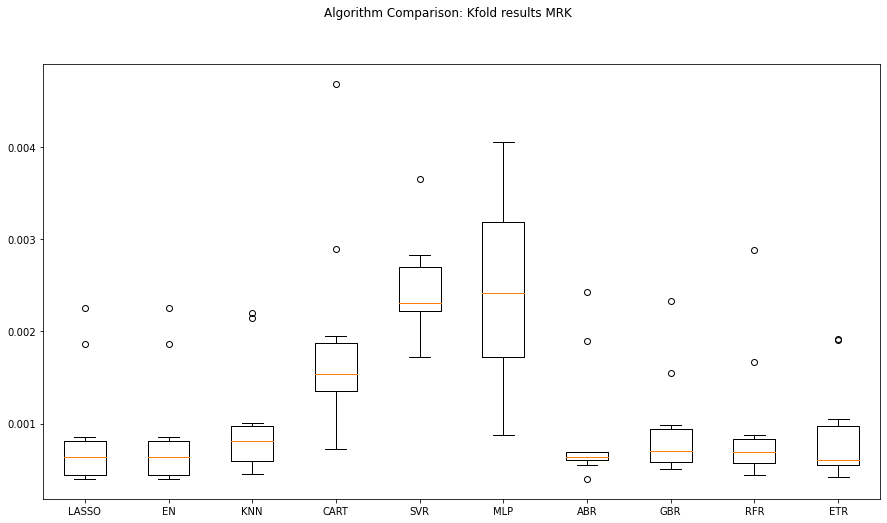

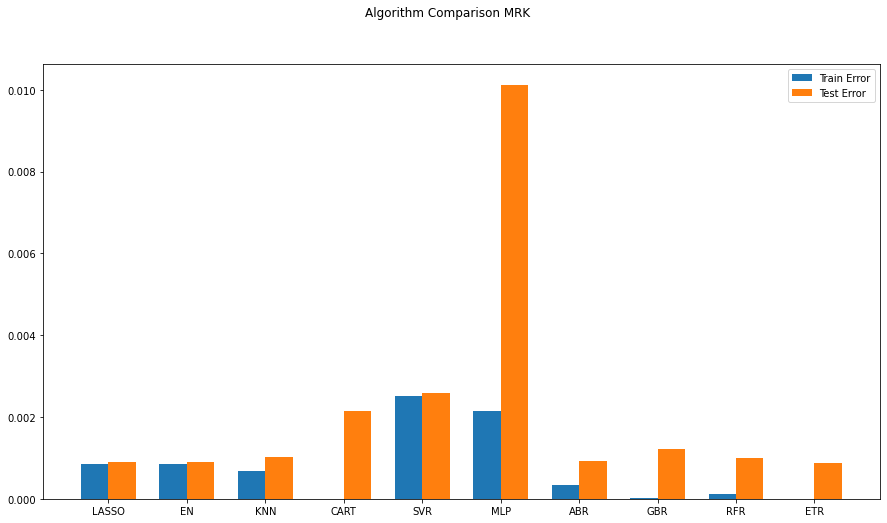

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVS       OGN  \
2016-11-22  0.000291 -0.000570  

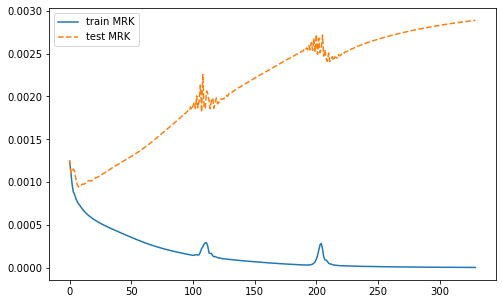

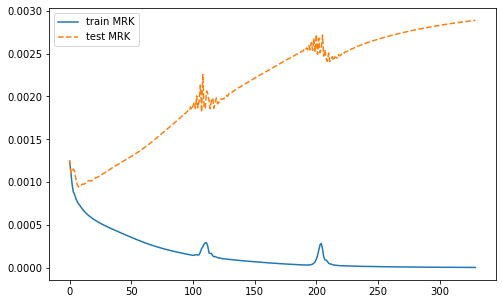

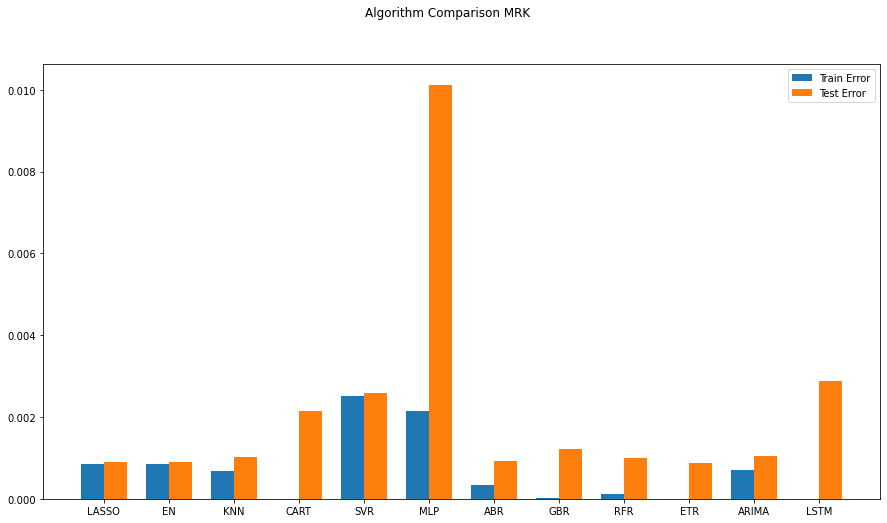

Best ARIMANone MSE=inf
0.0010544542007412002


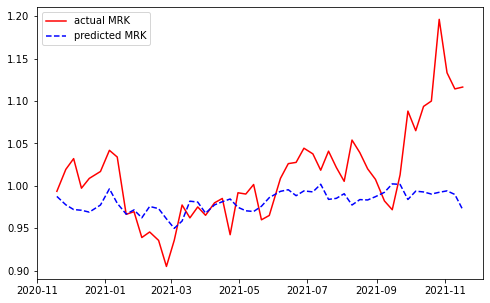

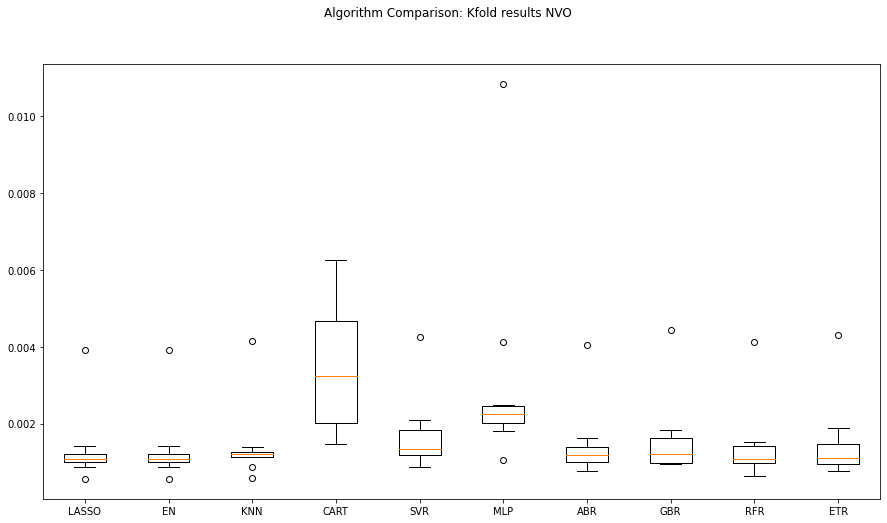

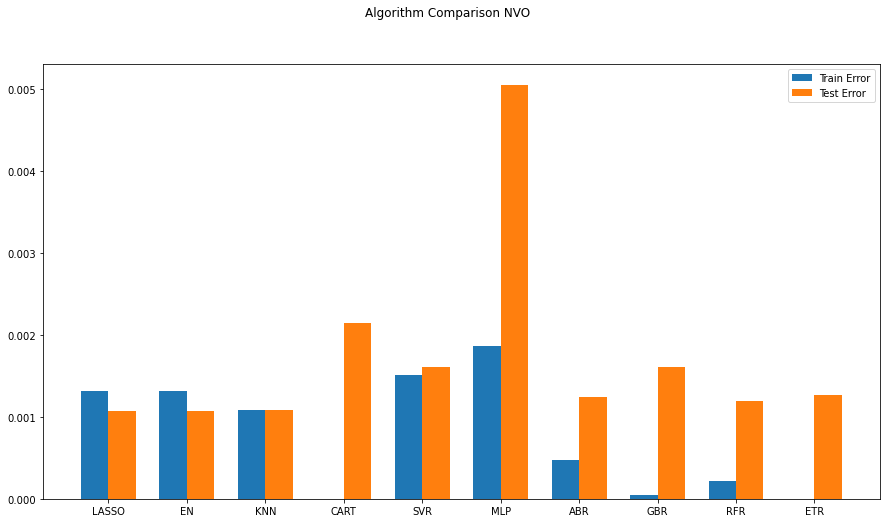

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVS       OGN  \
2016-11-22  0.000291 -0.000570  

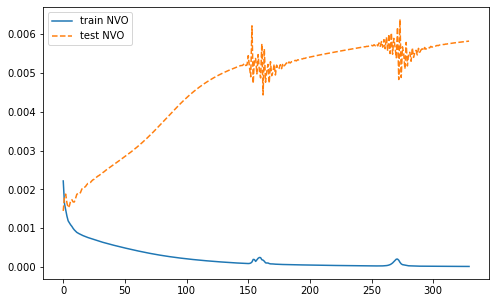

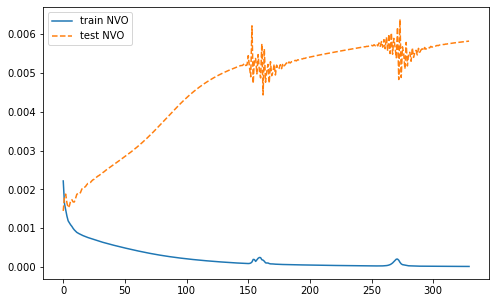

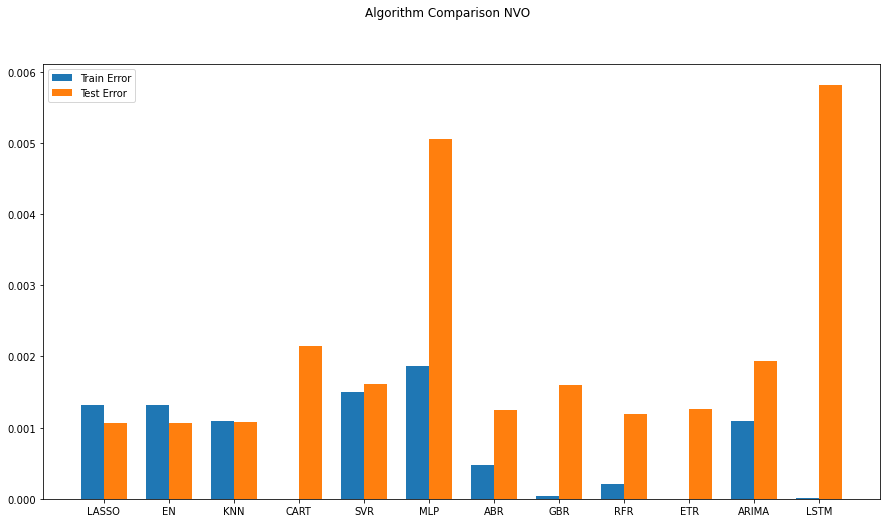

Best ARIMANone MSE=inf
0.001938047769460648


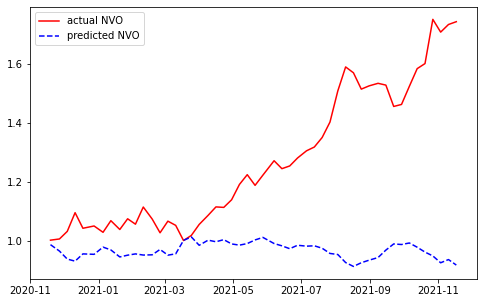

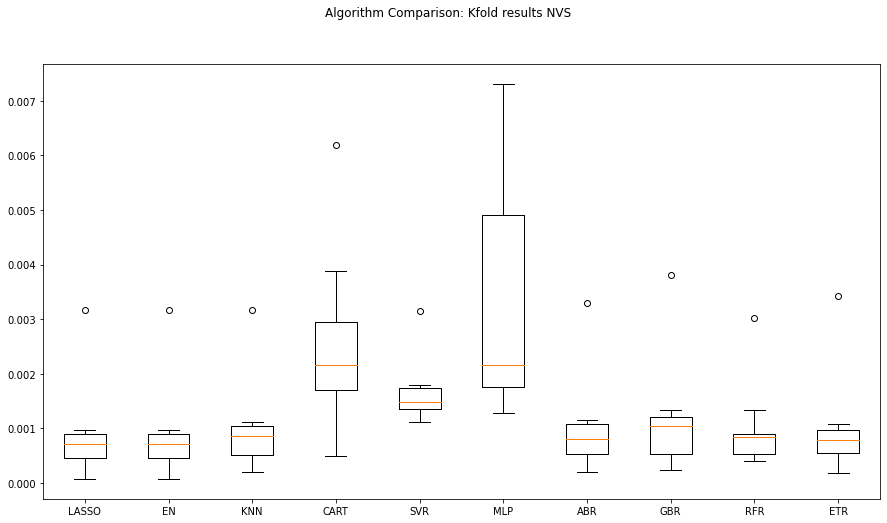

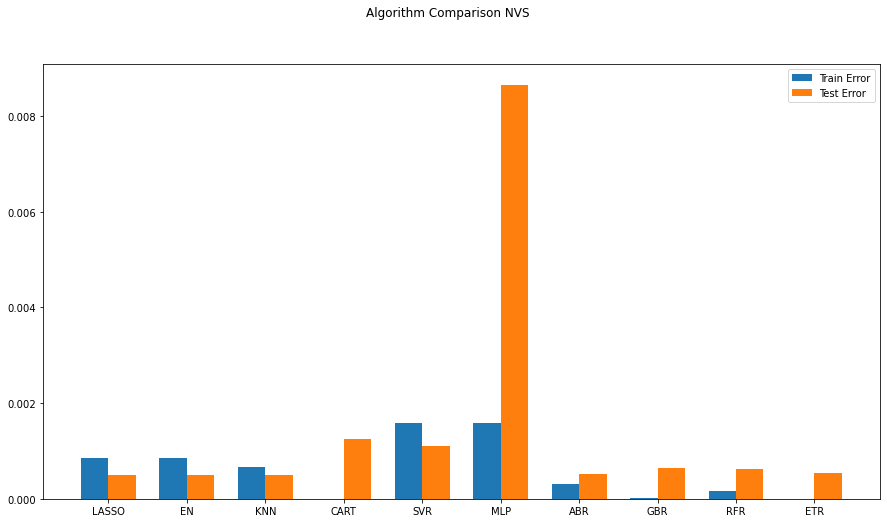

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVO       OGN  \
2016-11-22  0.000291 -0.000570  

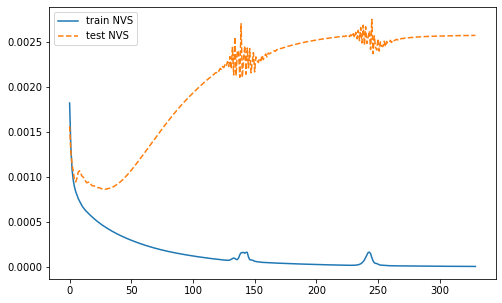

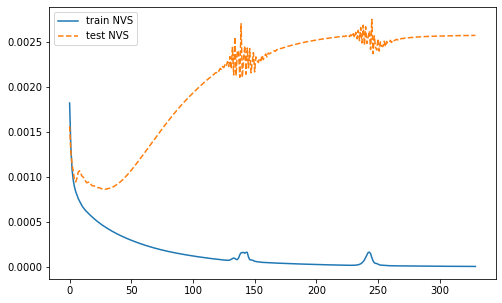

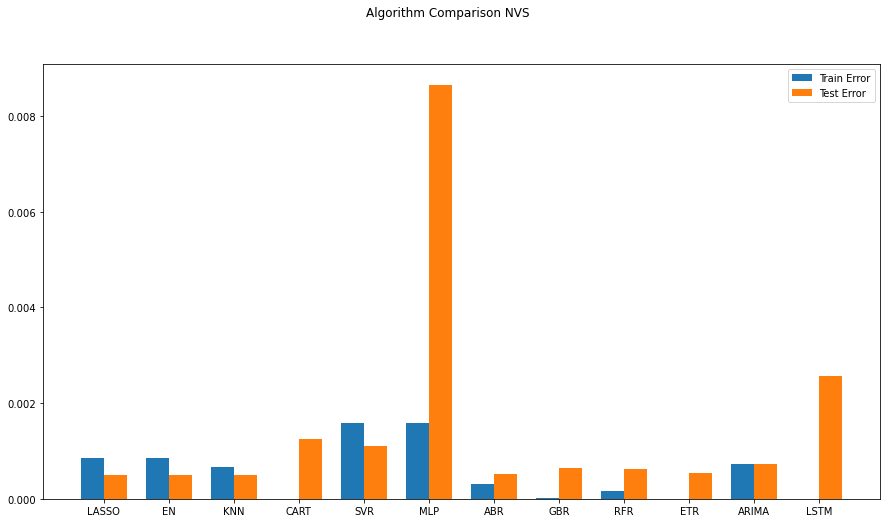

Best ARIMANone MSE=inf
0.0007218348092902959


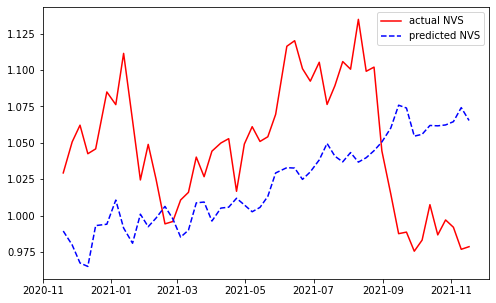

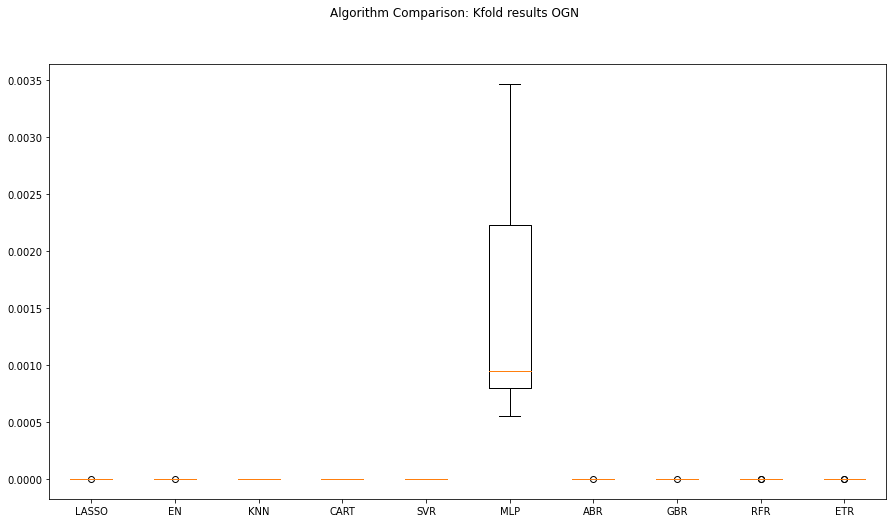

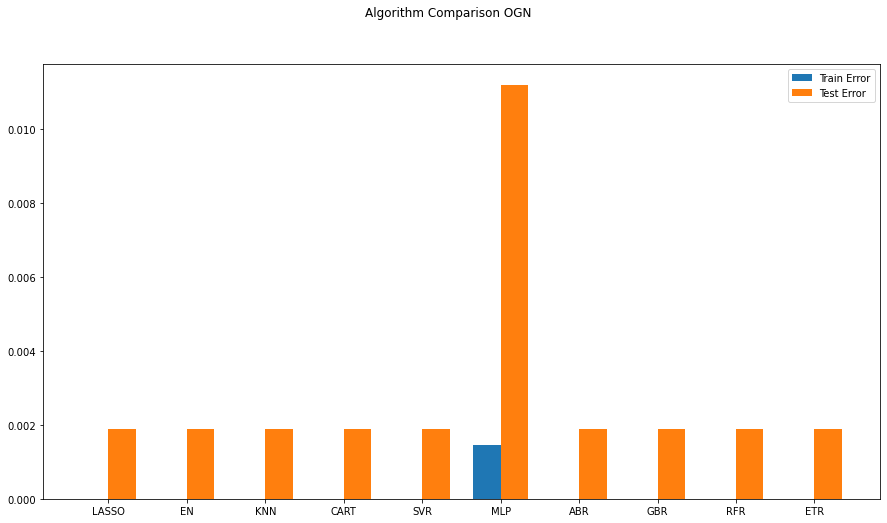

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVO       NVS  \
2016-11-22  0.000291 -0.000570  

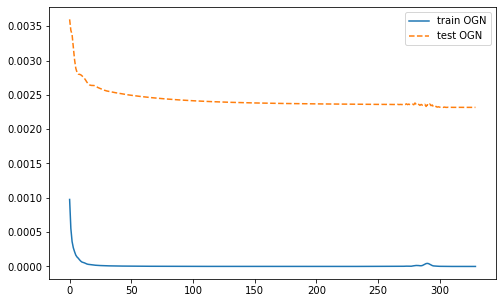

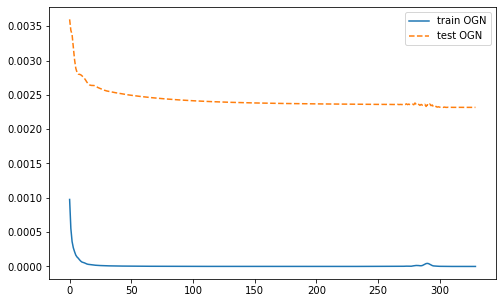

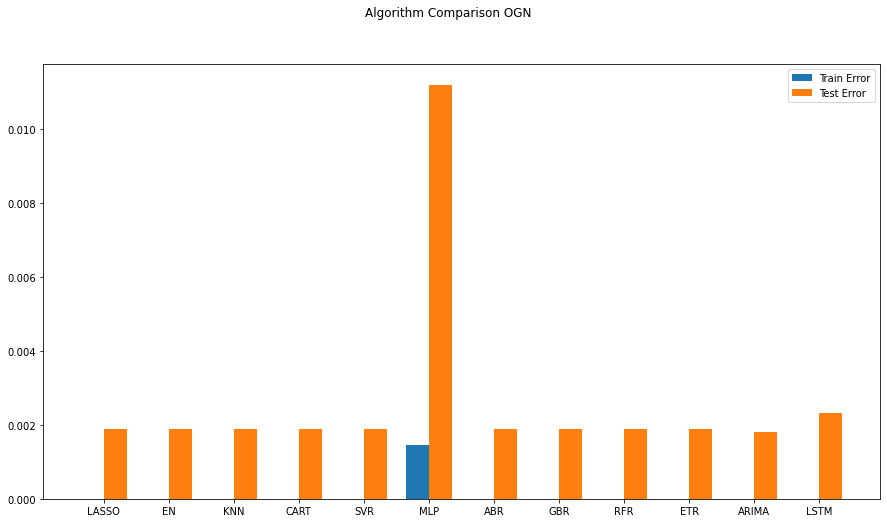

Best ARIMANone MSE=inf
0.0017942512193770278


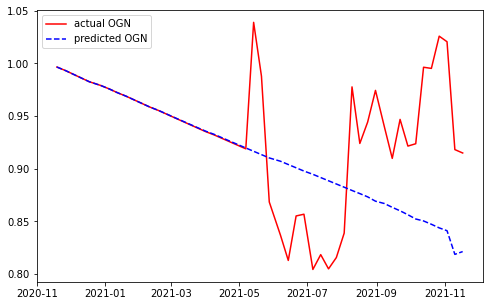

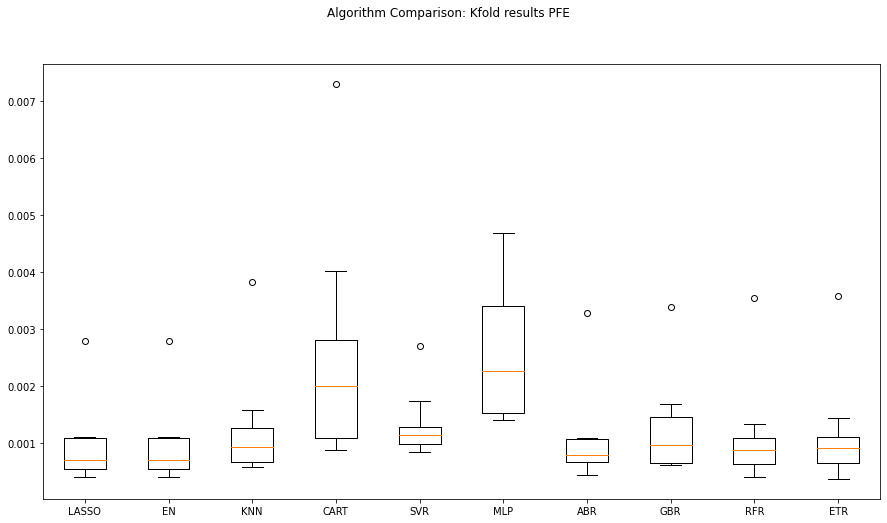

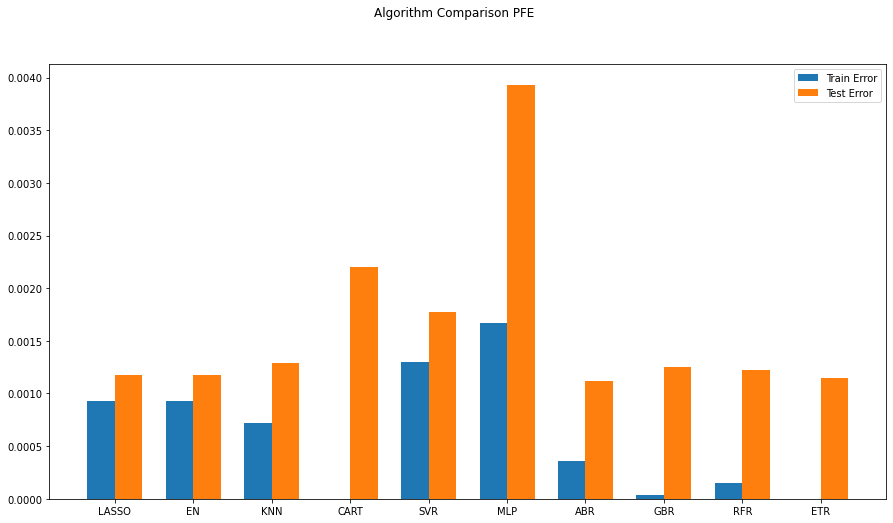

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVO       NVS  \
2016-11-22  0.000291 -0.000570  

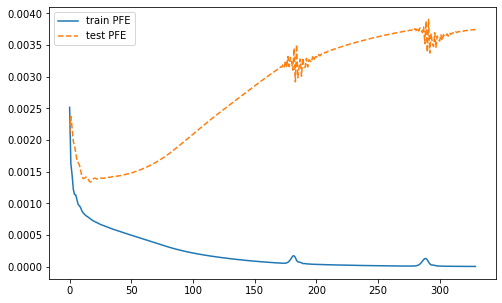

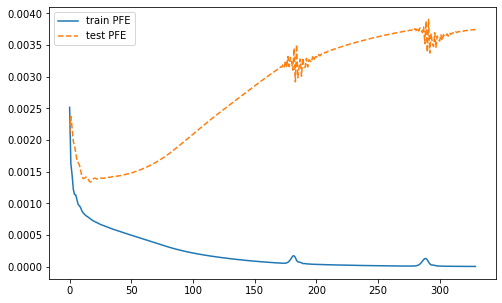

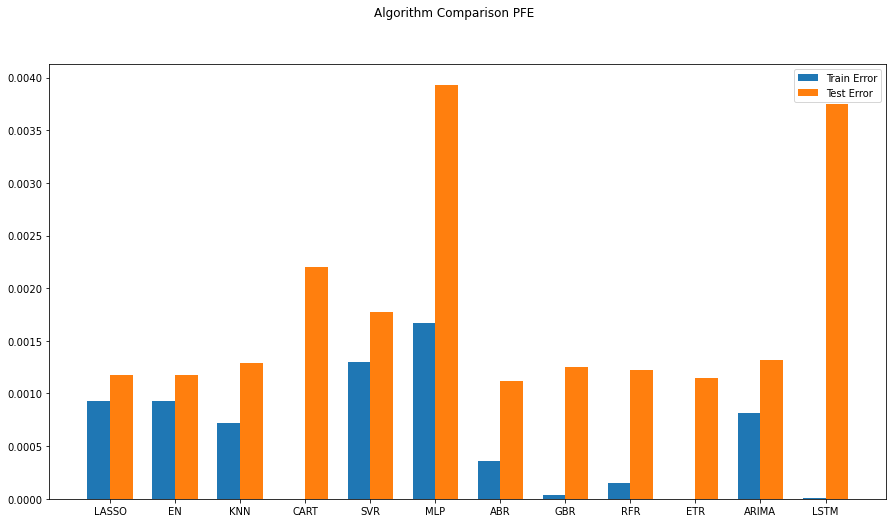

Best ARIMANone MSE=inf
0.0013223188167873223


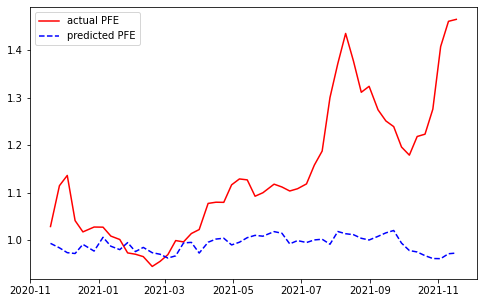

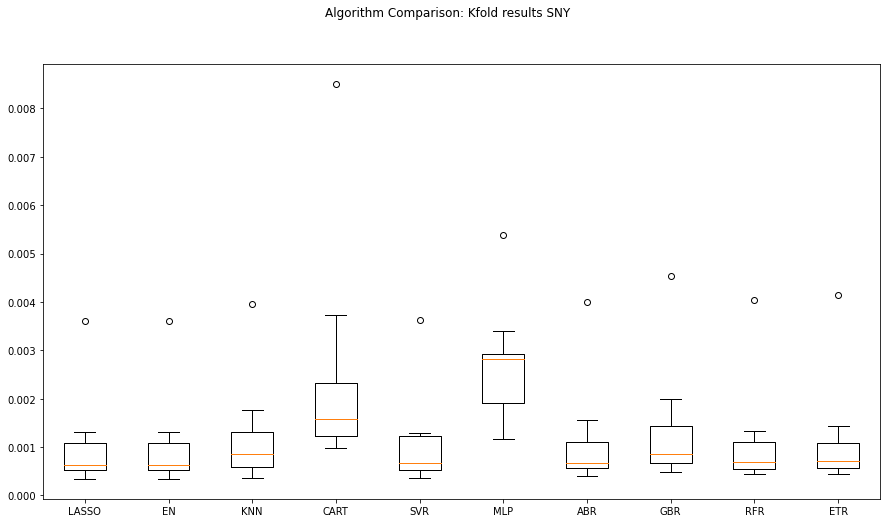

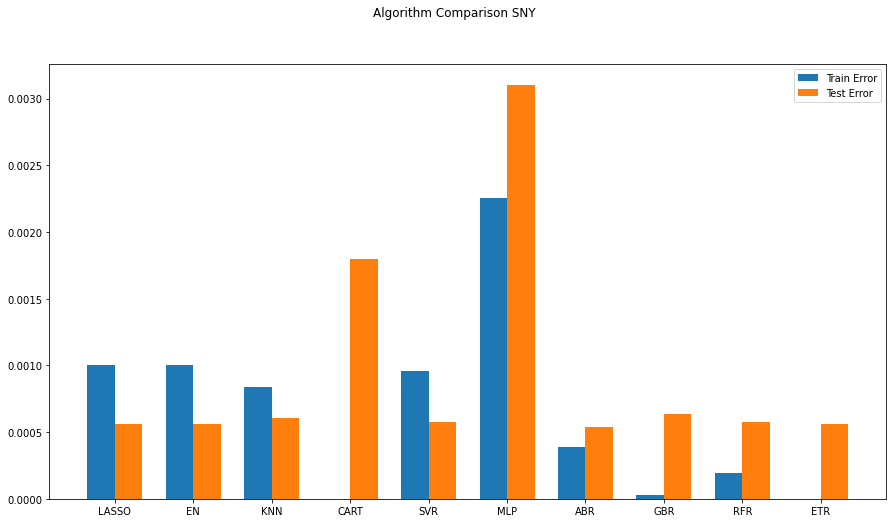

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVO       NVS  \
2016-11-22  0.000291 -0.000570  

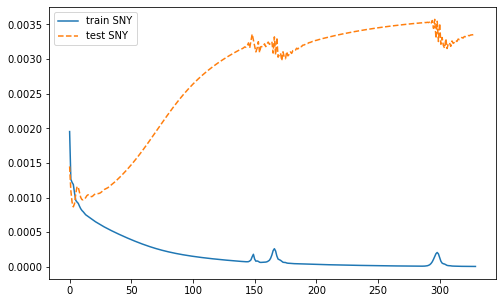

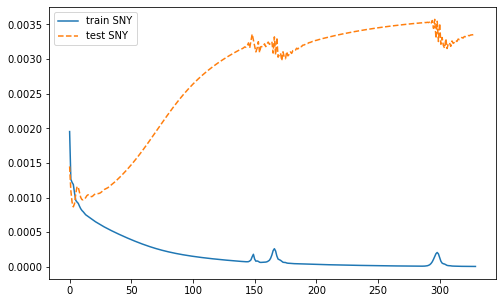

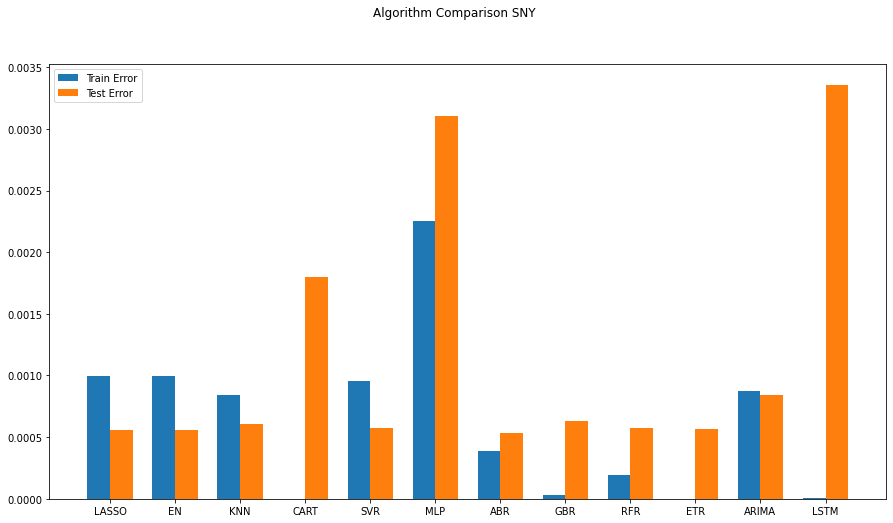

Best ARIMANone MSE=inf
0.0008445886066360211


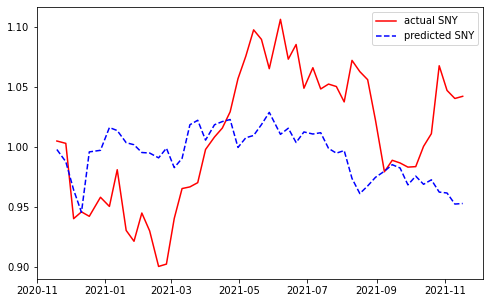

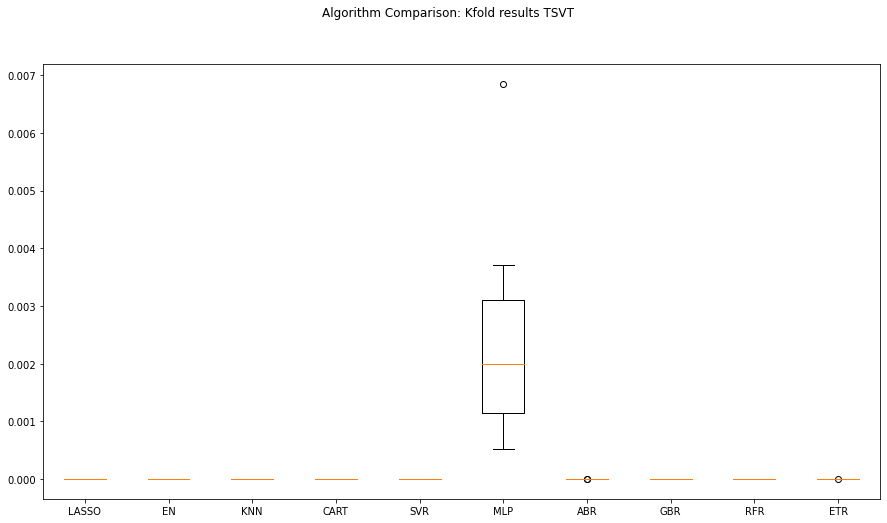

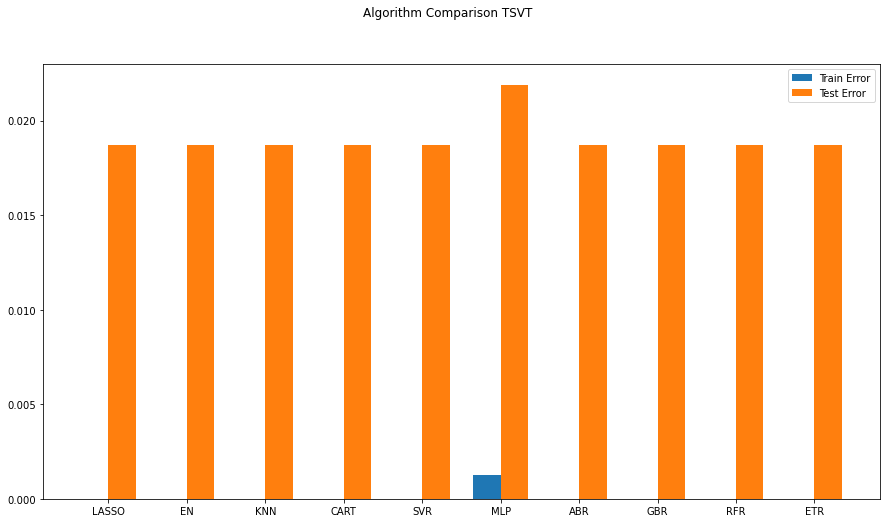

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-22  0.003566  0.001967  0.003780 -0.000648  0.000757 -0.020242   
2016-11-30  0.031240 -0.001803 -0.011033 -0.078579 -0.001947 -0.020242   
2016-12-07 -0.013412 -0.020193 -0.011156 -0.030277 -0.021491 -0.020242   
2016-12-14  0.027620  0.051757  0.054210  0.003324  0.057340 -0.020242   
2016-12-21 -0.003574 -0.017093 -0.008464 -0.011030  0.003243 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-15 -0.010929 -0.021386 -0.028884 -0.022166 -0.019666 -0.020242   
2020-10-22 -0.010853 -0.030370 -0.011291 -0.050538  0.005611 -0.020242   
2020-10-29 -0.044134 -0.045589 -0.017277 -0.083284 -0.047869 -0.020242   
2020-11-05  0.149625  0.062939  0.077041  0.292538  0.095906 -0.020242   
2020-11-12  0.040886  0.022043  0.030002 -0.308677 -0.015811 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVO       NVS  \
2016-11-22  0.000291 -0.000570  

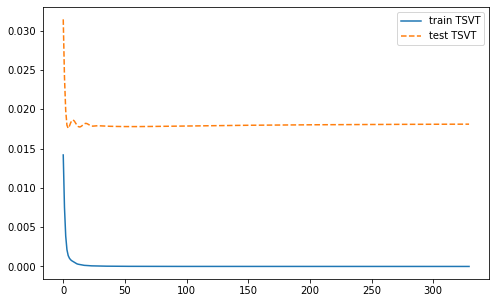

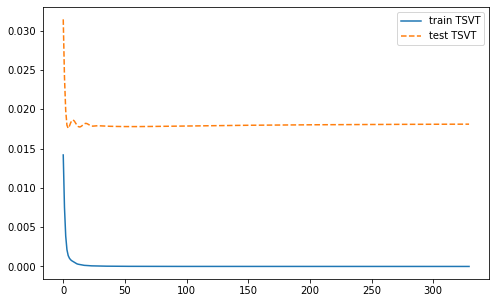

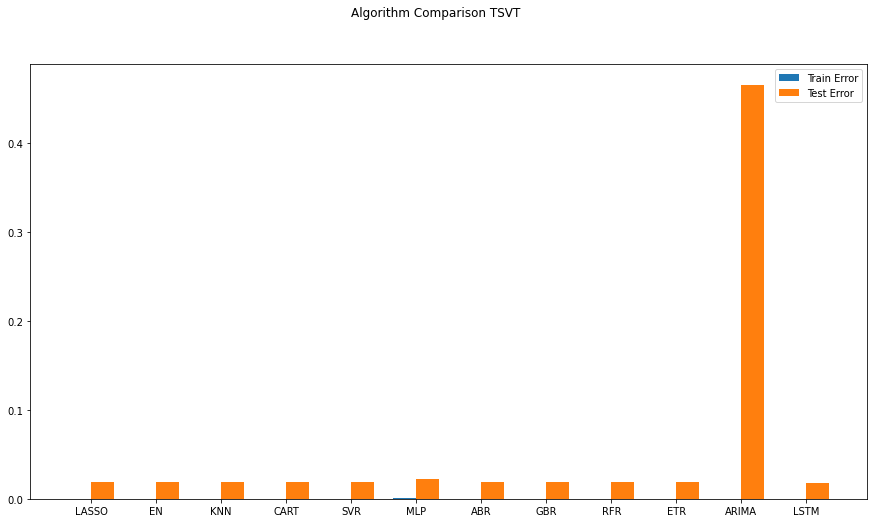

Best ARIMANone MSE=inf
0.46623471729720095


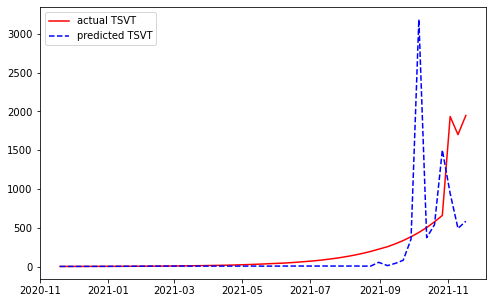

In [76]:
# Free for all
# Need to remove LR model
# LSTM Network
def create_LSTMmodel(learn_rate = 0.01, momentum=0): # create model
        model = Sequential()
        model.add(LSTM(50, input_shape=(X_train_LSTM.shape[1],X_train_LSTM.shape[2])))
        model.add(Dense(1))

        #More cells can be added if needed model.add(Dense(1))
        optimizer = SGD(lr=learn_rate, momentum=momentum) 
        model.compile(loss='mse', optimizer='adam')
        return model
    
def evaluate_arima_model(arima_order):
#predicted = list() 
    modelARIMA=ARIMA(endog=Y_temp,exog=X_train_ARIMA,order=arima_order) 
    model_fit = modelARIMA.fit()
    error = mean_squared_error(Y_temp, model_fit.fittedvalues)
    return error

# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(p_values, d_values, q_values): 
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q) 
                try:
                    mse = evaluate_arima_model(order) 
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                    print('ARIMA%s MSE=%.7f' % (order,mse))
                except: 
                    continue
    print('Best ARIMA%s MSE=%.7f' % (best_cfg, best_score))
    

    
seq_len = 2 #Length of the seq for the LSTM

for i in stk_tickers:
    try:
        #X_temp = X_train.filter(regex=i, axis=1)
        X_temp = X_train
        Y_temp = Y_train.filter(regex=i, axis=1)
        #_temp_test = X_test.filter(regex=i, axis=1)
        X_temp_test = X_test
        Y_temp_test = Y_test.filter(regex=i, axis=1)

        #temp = X.loc[:,['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
        #temp2 = X.filter(regex=i, axis=1)
        #X_temp_fulX = pd.concat([temp2, temp], axis=1)
        X_temp_fulX = X

        Arima_temp = X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
        Arima_temp_test = X_test.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]

        names = []

        kfold_results = [] 
        test_results = [] 
        train_results = []
        # Model testing
        for name, model in models:
            names.append(name)
            ## k-fold analysis:
            kfold = KFold(n_splits=num_folds)
            #converted mean squared error to positive. The lower the better
            cv_results = -1* cross_val_score(model, X_temp, Y_temp, cv=kfold, scoring=scoring)
            kfold_results.append(cv_results)
            # Full Training period
            res = model.fit(X_temp, Y_temp)
            train_result = mean_squared_error(res.predict(X_temp), Y_temp) 
            train_results.append(train_result)
            # Test results
            test_result = mean_squared_error(res.predict(X_temp_test), Y_temp_test) 
            test_results.append(test_result)
        # Comparition starts by ticker
        for j in range(0,1):
            fig = pyplot.figure()
            fig.suptitle(f'Algorithm Comparison: Kfold results {i}')
            ax = fig.add_subplot(111)
            pyplot.boxplot(kfold_results)
            ax.set_xticklabels(names)
            fig.set_size_inches(15,8)
            pyplot.show()
        # Error testing
        for k in range(0,1):
            fig = pyplot.figure()
            ind = np.arange(len(names)) # the x locations for the groups
            width = 0.35 # the width of the bars
            fig.suptitle(f'Algorithm Comparison {i}')
            ax = fig.add_subplot(111)
            pyplot.bar(ind - width/2, train_results,  width=width, label='Train Error')
            pyplot.bar(ind + width/2, test_results, width=width, label='Test Error')
            fig.set_size_inches(15,8)
            pyplot.legend()
            ax.set_xticks(ind)
            ax.set_xticklabels(names)
            pyplot.show()

        # ARIMA and LSTM
        for arimalstm in range(0,1):

    #         X_train_ARIMA=X_temp.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
    #         X_test_ARIMA=X_test.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
            X_train_ARIMA=Arima_temp.loc[:, Arima_temp.columns != i]
            X_test_ARIMA=Arima_temp_test.loc[:, Arima_temp.columns != i]

            tr_len = len(X_train_ARIMA)
            te_len = len(X_test_ARIMA)
            to_len = len(X_temp_fulX)

            print(X_train_ARIMA)

            X_train_ARIMA.index=pd.DatetimeIndex(X_train_ARIMA.index).to_period('W')

            Y_temp.index=pd.DatetimeIndex(Y_temp.index).to_period('W')

            modelARIMA=ARIMA(endog=Y_temp,exog=X_train_ARIMA,order=[1,0,0])
            model_fit = modelARIMA.fit(trend='nc')

            error_Training_ARIMA = mean_squared_error(Y_temp, model_fit.fittedvalues)
            predicted = model_fit.predict(start = tr_len -1 ,end = to_len -1, exog = X_test_ARIMA)[1:]
            error_Test_ARIMA = mean_squared_error(Y_temp_test,predicted)
            print(error_Test_ARIMA)

            #seq_len = 2 #Length of the seq for the LSTM
            Y_train_LSTM, Y_test_LSTM = np.array(Y_temp)[seq_len-1:], np.array(Y_temp_test) 
            X_train_LSTM = np.zeros((X_temp.shape[0]+1-seq_len, seq_len, X_temp.shape[1]))
            X_test_LSTM = np.zeros((X_temp_test.shape[0], seq_len, X_temp_fulX.shape[1]))
            print(X_test_LSTM.shape)
            print(X_test_LSTM)

            for l in range(seq_len):
                X_train_LSTM[:, l, :] = np.array(X_temp)[l:X_temp.shape[0]+l+1-seq_len, :]
                X_test_LSTM[:, l, :] = np.array(X_temp_fulX)[X_temp.shape[0]+l-1:X_temp_fulX.shape[0]+l+1-seq_len, :]
            print(X_test_LSTM.shape)
            print(X_test_LSTM)

            LSTMModel = create_LSTMmodel(learn_rate = 0.01, momentum=0)
            LSTMModel_fit = LSTMModel.fit(X_train_LSTM, Y_train_LSTM, validation_data=(X_test_LSTM, Y_test_LSTM),epochs=330, batch_size=72, verbose=0, shuffle=False)

            for m in range(seq_len):
                pyplot.plot(LSTMModel_fit.history['loss'], label=f'train {i}', )
                pyplot.plot(LSTMModel_fit.history['val_loss'], '--',label=f'test {i}',)
                pyplot.legend()
                pyplot.show()

            error_Training_LSTM = mean_squared_error(Y_train_LSTM,LSTMModel.predict(X_train_LSTM))
            predicted = LSTMModel.predict(X_test_LSTM)
            error_Test_LSTM = mean_squared_error(Y_temp_test,predicted)

            test_results.append(error_Test_ARIMA)
            test_results.append(error_Test_LSTM)
            train_results.append(error_Training_ARIMA)
            train_results.append(error_Training_LSTM)
            names.append("ARIMA")
            names.append("LSTM")

            for n in range(0,1):
                fig = pyplot.figure()
                ind = np.arange(len(names)) # the x locations for the groups
                width = 0.35 # the width of the bars
                fig.suptitle(f'Algorithm Comparison {i}')
                ax = fig.add_subplot(111)
                pyplot.bar(ind - width/2, train_results,  width=width, label='Train Error')
                pyplot.bar(ind + width/2, test_results, width=width, label='Test Error')
                fig.set_size_inches(15,8)
                pyplot.legend()
                ax.set_xticks(ind)
                ax.set_xticklabels(names)
                pyplot.show()

            p_values = [0, 1, 2]
            d_values = range(0, 2)
            q_values = range(0, 2)
            #warnings.filterwarnings("ignore")
            evaluate_models(p_values, d_values, q_values)

            modelARIMA_tuned=ARIMA(endog=Y_temp,exog=X_train_ARIMA,order=[2,0,1])
            model_fit_tuned = modelARIMA_tuned.fit(trend='nc')
            # estimate accuracy on validation set
            predicted_tuned = model_fit.predict(start = tr_len -1 ,end = to_len -1, exog = X_test_ARIMA)[1:]
            print(mean_squared_error(Y_temp_test,predicted_tuned))

            # plotting the actual data versus predicted data
            for o in range(0,1):
                predicted_tuned.index = Y_temp_test.index
                pyplot.plot(np.exp(Y_temp_test).cumprod(), 'r', label=f'actual {i}',)
                # plotting t, a separately
                pyplot.plot(np.exp(predicted_tuned).cumprod(), 'b--', label=f'predicted {i}')
                pyplot.legend()
                pyplot.rcParams["figure.figsize"] = (8,5)
                pyplot.show()
    except:
        pass

In [77]:
#X_train.loc[:, stk_tickers]
Arima_temp = X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
Arima_temp.loc[:, Arima_temp.columns != 'ABBV']

#X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
#X_train

,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,HZNP,...,NVS,OGN,PFE,SNY,TSVT,DEXJPUS,DEXUSUK,SP500,DJIA,VIXCLS
2016-11-22,0.001967,0.003780,-0.000648,0.000757,-0.020242,0.000291,-0.000570,0.001406,0.003542,0.006471,...,0.001842,-0.003531,0.002833,0.001747,0.135236,0.000157,-0.000040,0.002656,0.002184,0.001539
2016-11-30,-0.001803,-0.011033,-0.078579,-0.001947,-0.020242,-0.010259,0.012231,-0.006594,0.097842,-0.068319,...,0.009792,-0.003531,0.025525,0.008494,0.135236,0.015512,0.001845,-0.002684,0.002115,0.069904
2016-12-07,-0.020193,-0.011156,-0.030277,-0.021491,-0.020242,-0.012562,-0.058227,-0.006371,0.066388,-0.020924,...,-0.002038,-0.003531,-0.030004,0.007929,0.135236,-0.007374,0.009807,0.019162,0.022034,-0.086943
2016-12-14,0.051757,0.054210,0.003324,0.057340,-0.020242,0.045887,0.002058,0.010859,-0.002030,-0.250063,...,0.033250,-0.003531,0.050941,-0.022462,0.135236,0.013651,0.008060,0.005309,0.012349,0.076385
2016-12-21,-0.017093,-0.008464,-0.011030,0.003243,-0.020242,-0.023386,0.074597,0.004468,-0.052864,0.057894,...,0.008003,-0.003531,-0.012880,-0.004807,0.135236,0.023450,-0.028580,0.005267,0.007521,-0.157315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-10-15,-0.021386,-0.028884,-0.022166,-0.019666,-0.020242,-0.005702,0.100674,-0.032270,-0.075191,-0.050631,...,-0.024867,-0.003531,-0.009259,-0.007975,0.135236,-0.005678,-0.002088,0.010537,0.002414,0.022877
2020-10-22,-0.030370,-0.011291,-0.050538,0.005611,-0.020242,-0.037050,-0.075637,-0.025047,-0.022703,-0.042094,...,-0.011543,-0.003531,0.023791,-0.020832,0.135236,-0.004756,0.013304,-0.008606,-0.004592,0.041400
2020-10-29,-0.045589,-0.017277,-0.083284,-0.047869,-0.020242,-0.035910,-0.076478,-0.032733,-0.056208,0.021590,...,-0.078080,-0.003531,-0.059156,-0.072459,0.135236,-0.001813,-0.015397,-0.042404,-0.061978,0.290613
2020-11-05,0.062939,0.077041,0.292538,0.095906,-0.020242,0.018619,0.100486,0.080315,0.122221,0.014054,...,0.075945,-0.003531,0.041209,0.100669,0.135236,-0.009791,0.017381,0.058763,0.062912,-0.309647


# DELETE FROM HERE

In [78]:
# When there are exogenus variables it is said that is an ARIMAX
modelARIMA=ARIMA(endog=Y_train,exog=X_train_ARIMA,order=[1,0,0])
model_fit = modelARIMA.fit()

ValueError: The indices for endog and exog are not aligned

In [79]:
error_Training_ARIMA = mean_squared_error(Y_train, model_fit.fittedvalues)

ValueError: y_true and y_pred have different number of output (20!=1)

In [ ]:

predicted = model_fit.predict(start = tr_len -1 ,end = to_len -1, exog = X_test_ARIMA)[1:]
error_Test_ARIMA = mean_squared_error(Y_test,predicted)
error_Test_ARIMA

In [ ]:
# Adding a RNN LSTM
seq_len = 2 #Length of the seq for the LSTM
Y_train_LSTM, Y_test_LSTM = np.array(Y_train)[seq_len-1:], np.array(Y_test) 
X_train_LSTM = np.zeros((X_train.shape[0]+1-seq_len, seq_len, X_train.shape[1]))
X_test_LSTM = np.zeros((X_test.shape[0], seq_len, X.shape[1]))

In [ ]:
X_test_LSTM.shape

In [ ]:
X_test_LSTM

In [ ]:
for i in range(seq_len):
        X_train_LSTM[:, i, :] = np.array(X_train)[i:X_train.shape[0]+i+1-seq_len, :]
        X_test_LSTM[:, i, :] = np.array(X)[X_train.shape[0]+i-1:X.shape[0]+i+1-seq_len, :]

In [ ]:
X_test_LSTM.shape

In [ ]:

X_test_LSTM

In [ ]:
# LSTM Network
def create_LSTMmodel(learn_rate = 0.01, momentum=0): # create model
        model = Sequential()
        model.add(LSTM(50, input_shape=(X_train_LSTM.shape[1],X_train_LSTM.shape[2])))
        model.add(Dense(1))

        #More cells can be added if needed model.add(Dense(1))
        optimizer = SGD(lr=learn_rate, momentum=momentum) 
        model.compile(loss='mse', optimizer='adam')
        return model
LSTMModel = create_LSTMmodel(learn_rate = 0.01, momentum=0)
LSTMModel_fit = LSTMModel.fit(X_train_LSTM, Y_train_LSTM, validation_data=(X_test_LSTM, Y_test_LSTM),epochs=330, batch_size=72, verbose=0, shuffle=False)

In [ ]:
pyplot.plot(LSTMModel_fit.history['loss'], label='train', )
pyplot.plot(LSTMModel_fit.history['val_loss'], '--',label='test',)
pyplot.legend()
pyplot.show()

In [ ]:
error_Training_LSTM = mean_squared_error(Y_train_LSTM,LSTMModel.predict(X_train_LSTM))

In [ ]:
predicted = LSTMModel.predict(X_test_LSTM)
error_Test_LSTM = mean_squared_error(Y_test,predicted)

In [ ]:
test_results.append(error_Test_ARIMA)
test_results.append(error_Test_LSTM)
train_results.append(error_Training_ARIMA)
train_results.append(error_Training_LSTM)
names.append("ARIMA")
names.append("LSTM")

In [ ]:
# compare algorithms
fig = pyplot.figure()
ind = np.arange(len(names)) # the x locations for the groups
width = 0.35 # the width of the bars
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
pyplot.bar(ind - width/2, train_results,  width=width, label='Train Error')
pyplot.bar(ind + width/2, test_results, width=width, label='Test Error')
fig.set_size_inches(15,8)
pyplot.legend()
ax.set_xticks(ind)
ax.set_xticklabels(names)
pyplot.show()

In [ ]:
def evaluate_arima_model(arima_order):
#predicted = list() 
    modelARIMA=ARIMA(endog=Y_train,exog=X_train_ARIMA,order=arima_order) 
    model_fit = modelARIMA.fit()
    error = mean_squared_error(Y_train, model_fit.fittedvalues)
    return error

In [ ]:
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(p_values, d_values, q_values): 
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q) 
                try:
                    mse = evaluate_arima_model(order) 
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                    print('ARIMA%s MSE=%.7f' % (order,mse))
                except: 
                    continue
    print('Best ARIMA%s MSE=%.7f' % (best_cfg, best_score))

In [ ]:
# evaluate parameters
p_values = [0, 1, 2]
d_values = range(0, 2)
q_values = range(0, 2)
#warnings.filterwarnings("ignore")
evaluate_models(p_values, d_values, q_values)

In [ ]:
# ARIMA(2, 0, 1) MSE=0.0009632

In [ ]:
modelARIMA_tuned=ARIMA(endog=Y_train,exog=X_train_ARIMA,order=[2,0,1])
model_fit_tuned = modelARIMA_tuned.fit()
# estimate accuracy on validation set
predicted_tuned = model_fit.predict(start = tr_len -1 ,end = to_len -1, exog = X_test_ARIMA)[1:]
print(mean_squared_error(Y_test,predicted_tuned))

In [ ]:
# plotting the actual data versus predicted data
predicted_tuned.index = Y_test.index
pyplot.plot(np.exp(Y_test).cumprod(), 'r', label='actual',)
# plotting t, a separately
pyplot.plot(np.exp(predicted_tuned).cumprod(), 'b--', label='predicted')
pyplot.legend()
pyplot.rcParams["figure.figsize"] = (8,5)
pyplot.show()